# **1. Business Understanding**

## **Overview**

Dengan jumlah user yang semakin meningkat, banyak user
yang diacquired hanya untuk memenuhi jumlah user target dari
perusahaan Fashion Campus. Tim Marketing diberikan tugas
untuk membuat promo yang menarik untuk menarik perhatian
user. Namun, hal ini berdampak dengan banyaknya user yang
tidak organic, dimana mereka banyak yang tidak kembali lagi
ke platform untuk melakukan transaksi. Churn rate dari user
pun meningkat. Berdasarkan hal tersebut perlu dibuat churn prediction model agar tim marketing dan tim bisnis dapat membuat keputusan strategi berdasarkan data untuk mengatasi churn rate customers.

Tujuan:
- mengetahui probabilitas user terhadap churn
pada satu (1) bulan yang akan datang dengan membuat churn prediction model.
- mengetahui seberapa akurat model yang dibuat.

 ## **ERD**
 Berikut ERD untuk case ini:
 
 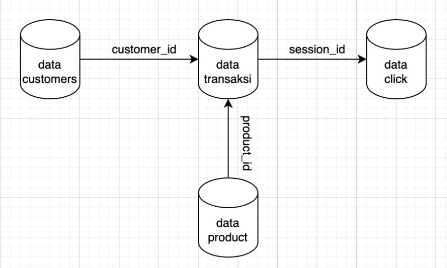

# **2. Data Preparation**

### **2.1 Library**

In [ ]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Data Manipulation

import pandas as pd
import numpy as np

# Data Collection
import ast

# Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt

# Export Output DataFrame
from google.colab import files

# Machine Learning
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.metrics import recall_score, confusion_matrix, precision_score, f1_score, accuracy_score, classification_report, roc_auc_score, balanced_accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
# Creating scaled set to be used in model to improve the results
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from scipy.stats import uniform
import warnings
warnings.filterwarnings('ignore')
import xgboost as xgb
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectFromModel

#function for metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_curve, auc

import six
import sys
sys.modules['sklearn.externals.six'] = six
from sklearn.tree import export_graphviz
from six import StringIO  
from IPython.display import Image  
import pydotplus
from scipy.stats import randint
from matplotlib import rcParams

# Import library of Gaussian Naive Bayes model
from sklearn.naive_bayes import GaussianNB

# Import library for LogisticRegression
from sklearn.linear_model import LogisticRegression

# Import library of RandomForestClassifier model
from sklearn.ensemble import RandomForestClassifier

# Import Library of Support Vector Machine model
from sklearn import svm

# Import library of KNeighborsClassifier model
from sklearn.neighbors import KNeighborsClassifier

from sklearn.inspection import permutation_importance
import shap

# Imbalance
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.over_sampling import ADASYN
from collections import Counter

### **2.2 Read Dataset**

In [ ]:
# Set the max columns to none

pd.set_option('display.max_columns', None)

In [ ]:
# Login Google Drive

from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Read Dataset use Google Drive

click_stream_dataset = pd.read_csv('gdrive/My Drive/Mockup Dataset/click_stream.csv')
customer_dataset = pd.read_csv('gdrive/My Drive/Mockup Dataset/customer.csv')
product_dataset = pd.read_csv('gdrive/My Drive/Mockup Dataset/product.csv', error_bad_lines=False)
transactions_dataset = pd.read_csv('gdrive/My Drive/Mockup Dataset/transactions.csv')

In [ ]:
# Read Dataset in Google Colab

# click_stream_dataset = pd.read_csv('/content/click_stream.csv')
# customer_dataset = pd.read_csv('/content/customer.csv')
# product_dataset = pd.read_csv('/content/product.csv', error_bad_lines=False)
# transactions_dataset = pd.read_csv('/content/transactions.csv')

## **2.3 Data Collection**

### **2.3.1 Transaction Dataset**

In [ ]:
transactions_dataset.head(2)

,created_at,customer_id,booking_id,session_id,product_metadata,payment_method,payment_status,promo_amount,promo_code,shipment_fee,shipment_date_limit,shipment_location_lat,shipment_location_long,total_amount
0,2018-07-29T15:22:01.458193Z,5868,186e2bee-0637-4710-8981-50c2d737bc42,3abaa6ce-e320-4e51-9469-d9f3fa328e86,"[{'product_id': 54728, 'quantity': 1, 'item_pr...",Debit Card,Success,1415,WEEKENDSERU,10000,2018-08-03T05:07:24.812676Z,-8.227893,111.969107,199832
1,2018-07-30T12:40:22.365620Z,4774,caadb57b-e808-4f94-9e96-8a7d4c9898db,2ee5ead1-f13e-4759-92df-7ff48475e970,"[{'product_id': 16193, 'quantity': 1, 'item_pr...",Credit Card,Success,0,NaN,10000,2018-08-03T01:29:03.415705Z,3.013470,107.802514,155526


In [ ]:
transactions_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 852584 entries, 0 to 852583
Data columns (total 14 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   created_at              852584 non-null  object 
 1   customer_id             852584 non-null  int64  
 2   booking_id              852584 non-null  object 
 3   session_id              852584 non-null  object 
 4   product_metadata        852584 non-null  object 
 5   payment_method          852584 non-null  object 
 6   payment_status          852584 non-null  object 
 7   promo_amount            852584 non-null  int64  
 8   promo_code              326536 non-null  object 
 9   shipment_fee            852584 non-null  int64  
 10  shipment_date_limit     852584 non-null  object 
 11  shipment_location_lat   852584 non-null  float64
 12  shipment_location_long  852584 non-null  float64
 13  total_amount            852584 non-null  int64  
dtypes: float64(2), int64

In [ ]:
# Change data type to save memory

transactions_dataset[['payment_method', 'payment_status', 'promo_code']] = transactions_dataset[['payment_method', 'payment_status', 'promo_code']].astype('category')
transactions_dataset['shipment_date_limit'] = transactions_dataset['shipment_date_limit'].astype('datetime64')
transactions_dataset['created_at'] = transactions_dataset['created_at'].astype('datetime64')

In [ ]:
#change the data type of column 'product_metadata' to be literal 

tmp = transactions_dataset.iloc[:,4].astype('string')
tmp = tmp.map(lambda x: ast.literal_eval(x))
tmp = tmp.to_frame()
transactions_dataset['product_metadata'] = tmp['product_metadata']

# explode
transactions_dataset = transactions_dataset.explode('product_metadata')
transactions_dataset.shape

(1254585, 14)

In [ ]:
type(transactions_dataset.iloc[2,4])

dict

In [ ]:
transactions_dataset.reset_index()

,index,created_at,customer_id,booking_id,session_id,product_metadata,payment_method,payment_status,promo_amount,promo_code,shipment_fee,shipment_date_limit,shipment_location_lat,shipment_location_long,total_amount
0,0,2018-07-29 15:22:01.458193,5868,186e2bee-0637-4710-8981-50c2d737bc42,3abaa6ce-e320-4e51-9469-d9f3fa328e86,"{'product_id': 54728, 'quantity': 1, 'item_pri...",Debit Card,Success,1415,WEEKENDSERU,10000,2018-08-03 05:07:24.812676,-8.227893,111.969107,199832
1,1,2018-07-30 12:40:22.365620,4774,caadb57b-e808-4f94-9e96-8a7d4c9898db,2ee5ead1-f13e-4759-92df-7ff48475e970,"{'product_id': 16193, 'quantity': 1, 'item_pri...",Credit Card,Success,0,NaN,10000,2018-08-03 01:29:03.415705,3.013470,107.802514,155526
2,2,2018-09-15 11:51:17.365620,4774,6000fffb-9c1a-4f4a-9296-bc8f6b622b50,93325fb6-eb00-4268-bb0e-6471795a0ad0,"{'product_id': 53686, 'quantity': 4, 'item_pri...",OVO,Success,0,NaN,10000,2018-09-18 08:41:49.422380,-2.579428,115.743885,550696
3,3,2018-11-01 11:23:48.365620,4774,f5e530a7-4350-4cd1-a3bc-525b5037bcab,bcad5a61-1b67-448d-8ff4-781d67bc56e4,"{'product_id': 20228, 'quantity': 1, 'item_pri...",Credit Card,Success,0,NaN,0,2018-11-05 17:42:27.954235,-3.602334,120.363824,271012
4,4,2018-12-18 11:20:30.365620,4774,0efc0594-dbbf-4f9a-b0b0-a488cfddf8a2,df1042ab-13e6-4072-b9d2-64a81974c51a,"{'product_id': 55220, 'quantity': 1, 'item_pri...",Credit Card,Success,0,NaN,0,2018-12-23 17:24:07.361785,-3.602334,120.363824,198753
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1254580,852579,2021-09-21 22:10:05.074873,25121,66f02fa4-c62e-497a-8b6e-be239009b50a,484eecde-9f4a-42de-a8df-7ce6668101f4,"{'product_id': 30642, 'quantity': 2, 'item_pri...",Debit Card,Failed,0,NaN,0,2021-09-27 00:43:40.992167,-6.869535,111.077145,226820
1254581,852580,2021-12-09 07:35:18.222046,34829,ccde6b83-ee42-4cce-b2cd-976574886eac,954e1211-4d45-4d0b-ba84-53e80119592c,"{'product_id': 19394, 'quantity': 1, 'item_pri...",OVO,Success,5010,AZ2022,10000,2021-12-12 07:52:44.803822,-8.677264,115.176947,359203
1254582,852581,2021-12-11 01:20:36.944593,99645,5bcd3434-1dc6-44bb-ae63-fd19714cbd6c,e6e6c108-abd0-49a2-b0a5-691117f9cfe1,"{'product_id': 13079, 'quantity': 4, 'item_pri...",Credit Card,Success,2181,WEEKENDSERU,5000,2021-12-12 13:28:22.848703,-6.185498,106.831093,1158159
1254583,852582,2019-12-18 11:01:09.623382,87319,af7f291a-b01b-4bfd-89a9-237b16368b15,bb6e5426-a3f3-426a-b99d-79173eaa234b,"{'product_id': 11312, 'quantity': 1, 'item_pri...",Credit Card,Success,4503,AZ2022,0,2019-12-23 22:56:46.831720,-7.155977,110.891858,184143


In [ ]:
import json
tmp = pd.json_normalize(transactions_dataset.product_metadata)

In [ ]:
transactions_dataset = pd.concat([transactions_dataset.reset_index(), tmp], join = 'outer',axis = 1)

In [ ]:
transactions_dataset.head(2)

,index,created_at,customer_id,booking_id,session_id,product_metadata,payment_method,payment_status,promo_amount,promo_code,shipment_fee,shipment_date_limit,shipment_location_lat,shipment_location_long,total_amount,product_id,quantity,item_price
0,0,2018-07-29 15:22:01.458193,5868,186e2bee-0637-4710-8981-50c2d737bc42,3abaa6ce-e320-4e51-9469-d9f3fa328e86,"{'product_id': 54728, 'quantity': 1, 'item_pri...",Debit Card,Success,1415,WEEKENDSERU,10000,2018-08-03 05:07:24.812676,-8.227893,111.969107,199832,54728,1,191247
1,1,2018-07-30 12:40:22.365620,4774,caadb57b-e808-4f94-9e96-8a7d4c9898db,2ee5ead1-f13e-4759-92df-7ff48475e970,"{'product_id': 16193, 'quantity': 1, 'item_pri...",Credit Card,Success,0,NaN,10000,2018-08-03 01:29:03.415705,3.013470,107.802514,155526,16193,1,145526


### **2.3.2 Click Stream Dataset**

In [ ]:
click_stream_dataset.head(2)

,session_id,event_name,event_time,event_id,traffic_source,event_metadata
0,fb0abf9e-fd1a-44dd-b5c0-2834d5a4b81c,HOMEPAGE,2019-09-06T15:54:32.821085Z,9c4388c4-c95b-4678-b5ca-e9cbc0734109,MOBILE,NaN
1,fb0abf9e-fd1a-44dd-b5c0-2834d5a4b81c,SCROLL,2019-09-06T16:03:57.821085Z,4690e1f5-3f99-42d3-84a5-22c4c4d8500a,MOBILE,NaN


In [ ]:
click_stream_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12833602 entries, 0 to 12833601
Data columns (total 6 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   session_id      object
 1   event_name      object
 2   event_time      object
 3   event_id        object
 4   traffic_source  object
 5   event_metadata  object
dtypes: object(6)
memory usage: 587.5+ MB


In [ ]:
## Change data type to save memory 

click_stream_dataset[['event_name', 'traffic_source']] = click_stream_dataset[['event_name', 'traffic_source']].astype('category')
click_stream_dataset[['event_time']] = click_stream_dataset[['event_time']].astype('datetime64')

In [ ]:
click_stream_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12833602 entries, 0 to 12833601
Data columns (total 6 columns):
 #   Column          Dtype         
---  ------          -----         
 0   session_id      object        
 1   event_name      category      
 2   event_time      datetime64[ns]
 3   event_id        object        
 4   traffic_source  category      
 5   event_metadata  object        
dtypes: category(2), datetime64[ns](1), object(3)
memory usage: 416.1+ MB


In [ ]:
click_stream_dataset.columns

Index(['session_id', 'event_name', 'event_time', 'event_id', 'traffic_source',
       'event_metadata'],
      dtype='object')

In [ ]:
click_stream_dataset['traffic_source'].unique()

['MOBILE', 'WEB']
Categories (2, object): ['MOBILE', 'WEB']

In [ ]:
click_stream_dataset['event_name'].unique()

['HOMEPAGE', 'SCROLL', 'ADD_TO_CART', 'BOOKING', 'SEARCH', 'ITEM_DETAIL', 'ADD_PROMO', 'CLICK', 'PROMO_PAGE']
Categories (9, object): ['ADD_PROMO', 'ADD_TO_CART', 'BOOKING', 'CLICK', ..., 'ITEM_DETAIL',
                         'PROMO_PAGE', 'SCROLL', 'SEARCH']

In [ ]:
# Group by click_stream_dataset by event_name

homepage = click_stream_dataset[click_stream_dataset['event_name'] == 'HOMEPAGE']
scroll = click_stream_dataset[click_stream_dataset['event_name'] == 'SCROLL']
add_to_cart = click_stream_dataset[(click_stream_dataset['event_name'] == 'ADD_TO_CART')]
booking = click_stream_dataset[click_stream_dataset['event_name'] == 'BOOKING']
search = click_stream_dataset[click_stream_dataset['event_name'] == 'SEARCH']
item_detail = click_stream_dataset[click_stream_dataset['event_name'] == 'ITEM_DETAIL']
add_promo = click_stream_dataset[click_stream_dataset['event_name'] == 'ADD_PROMO']
click = click_stream_dataset[click_stream_dataset['event_name'] == 'CLICK']
promo_page = click_stream_dataset[click_stream_dataset['event_name'] == 'PROMO_PAGE']

In [ ]:
# Check unique value in event metadata

click_stream_dataset[click_stream_dataset['event_name'] == 'HOMEPAGE']['event_metadata'].unique()

array([nan], dtype=object)

In [ ]:
click_stream_dataset[click_stream_dataset['event_name'] == 'SCROLL']['event_metadata'].unique()

array([nan], dtype=object)

In [ ]:
click_stream_dataset[click_stream_dataset['event_name'] == 'ITEM_DETAIL']['event_metadata'].unique()

array([nan], dtype=object)

In [ ]:
click_stream_dataset[click_stream_dataset['event_name'] == 'CLICK']['event_metadata'].unique()

array([nan], dtype=object)

In [ ]:
click_stream_dataset[click_stream_dataset['event_name'] == 'PROMO PAGE']['event_metadata'].unique()

array([], dtype=object)

- ### **Add To Cart**

In [ ]:
add_to_cart = add_to_cart.reset_index()
add_to_cart = add_to_cart.drop('index', axis=1)
add_to_cart

,session_id,event_name,event_time,event_id,traffic_source,event_metadata
0,7d440441-e67a-4d36-b324-80ffd636d166,ADD_TO_CART,2019-09-01 12:06:33.322763,934e306e-ecc6-472f-9ccb-12c8536910a2,MOBILE,"{'product_id': 15315, 'quantity': 4, 'item_pri..."
1,f7b5cd60-4f87-4b3c-8bde-c7da8930eec2,ADD_TO_CART,2019-09-09 05:06:03.425431,c1b42157-39a7-4521-a4dc-ed0200de301a,MOBILE,"{'product_id': 6133, 'quantity': 2, 'item_pric..."
2,f7b5cd60-4f87-4b3c-8bde-c7da8930eec2,ADD_TO_CART,2019-09-09 05:23:36.425431,61cbe834-c585-406e-8eac-30f671e51fbb,MOBILE,"{'product_id': 6721, 'quantity': 1, 'item_pric..."
3,f7b5cd60-4f87-4b3c-8bde-c7da8930eec2,ADD_TO_CART,2019-09-09 05:42:03.425431,2bd3f01a-e062-4c13-8b9d-598fb5379ed2,MOBILE,"{'product_id': 57622, 'quantity': 1, 'item_pri..."
4,f7b5cd60-4f87-4b3c-8bde-c7da8930eec2,ADD_TO_CART,2019-09-09 05:58:58.425431,ba1c5f20-869a-42be-878c-75496c28aba3,MOBILE,"{'product_id': 5490, 'quantity': 1, 'item_pric..."
...,...,...,...,...,...,...
1937152,f38416ce-51f2-46b0-a476-776d8fed1cb0,ADD_TO_CART,2021-08-01 08:02:26.737783,c5aaef2b-0732-4f27-a1a4-d3dd4e5e7c6f,WEB,"{'product_id': 4869, 'quantity': 1, 'item_pric..."
1937153,c1ce86f6-858b-4009-af5b-f1483a28d020,ADD_TO_CART,2020-09-22 22:45:47.674560,83bf5984-1a3b-438d-94fd-23d451dfb73b,WEB,"{'product_id': 25127, 'quantity': 1, 'item_pri..."
1937154,f5c4bbe0-f977-45bb-af23-6ab524df7777,ADD_TO_CART,2022-04-09 21:01:14.132472,9b24acc0-09f2-41ad-b591-6409660cb0b7,MOBILE,"{'product_id': 19386, 'quantity': 1, 'item_pri..."
1937155,ad1063b0-a6e5-40a9-aed6-d1b45741e571,ADD_TO_CART,2021-06-07 04:38:05.354381,ed7a0b57-5992-4a13-86f4-34425370d43b,MOBILE,"{'product_id': 13143, 'quantity': 1, 'item_pri..."


In [ ]:
add_to_cart['event_metadata'] = add_to_cart['event_metadata'].astype(str)

In [ ]:
#change the type data of column 'event_metadata' to be literal 

tmp = add_to_cart.iloc[:,5].astype('str')
tmp = tmp.map(lambda x: ast.literal_eval(x))
tmp = tmp.to_frame()
add_to_cart['event_metadata'] = tmp['event_metadata']

In [ ]:
type(add_to_cart.iloc[2,5])

dict

In [ ]:
add_metadata = pd.DataFrame(list(add_to_cart['event_metadata']))
add_metadata

,product_id,quantity,item_price
0,15315,4,313529
1,6133,2,249443
2,6721,1,134504
3,57622,1,384716
4,5490,1,121318
...,...,...,...
1937152,4869,1,282771
1937153,25127,1,166365
1937154,19386,1,208644
1937155,13143,1,284949


In [ ]:
add_to_cart = pd.concat([add_to_cart, add_metadata], axis=1)

In [ ]:
add_to_cart

,session_id,event_name,event_time,event_id,traffic_source,event_metadata,product_id,quantity,item_price
0,7d440441-e67a-4d36-b324-80ffd636d166,ADD_TO_CART,2019-09-01 12:06:33.322763,934e306e-ecc6-472f-9ccb-12c8536910a2,MOBILE,"{'product_id': 15315, 'quantity': 4, 'item_pri...",15315,4,313529
1,f7b5cd60-4f87-4b3c-8bde-c7da8930eec2,ADD_TO_CART,2019-09-09 05:06:03.425431,c1b42157-39a7-4521-a4dc-ed0200de301a,MOBILE,"{'product_id': 6133, 'quantity': 2, 'item_pric...",6133,2,249443
2,f7b5cd60-4f87-4b3c-8bde-c7da8930eec2,ADD_TO_CART,2019-09-09 05:23:36.425431,61cbe834-c585-406e-8eac-30f671e51fbb,MOBILE,"{'product_id': 6721, 'quantity': 1, 'item_pric...",6721,1,134504
3,f7b5cd60-4f87-4b3c-8bde-c7da8930eec2,ADD_TO_CART,2019-09-09 05:42:03.425431,2bd3f01a-e062-4c13-8b9d-598fb5379ed2,MOBILE,"{'product_id': 57622, 'quantity': 1, 'item_pri...",57622,1,384716
4,f7b5cd60-4f87-4b3c-8bde-c7da8930eec2,ADD_TO_CART,2019-09-09 05:58:58.425431,ba1c5f20-869a-42be-878c-75496c28aba3,MOBILE,"{'product_id': 5490, 'quantity': 1, 'item_pric...",5490,1,121318
...,...,...,...,...,...,...,...,...,...
1937152,f38416ce-51f2-46b0-a476-776d8fed1cb0,ADD_TO_CART,2021-08-01 08:02:26.737783,c5aaef2b-0732-4f27-a1a4-d3dd4e5e7c6f,WEB,"{'product_id': 4869, 'quantity': 1, 'item_pric...",4869,1,282771
1937153,c1ce86f6-858b-4009-af5b-f1483a28d020,ADD_TO_CART,2020-09-22 22:45:47.674560,83bf5984-1a3b-438d-94fd-23d451dfb73b,WEB,"{'product_id': 25127, 'quantity': 1, 'item_pri...",25127,1,166365
1937154,f5c4bbe0-f977-45bb-af23-6ab524df7777,ADD_TO_CART,2022-04-09 21:01:14.132472,9b24acc0-09f2-41ad-b591-6409660cb0b7,MOBILE,"{'product_id': 19386, 'quantity': 1, 'item_pri...",19386,1,208644
1937155,ad1063b0-a6e5-40a9-aed6-d1b45741e571,ADD_TO_CART,2021-06-07 04:38:05.354381,ed7a0b57-5992-4a13-86f4-34425370d43b,MOBILE,"{'product_id': 13143, 'quantity': 1, 'item_pri...",13143,1,284949


- ### **Booking**

In [ ]:
# Check category in event_metadata
click_stream_dataset[click_stream_dataset['event_name'] == 'BOOKING']['event_metadata'].unique()

array(["{'payment_status': 'Success'}", "{'payment_status': 'Failed'}"],
      dtype=object)

In [ ]:
booking = booking.reset_index()
booking = booking.drop('index', axis=1)
booking

,session_id,event_name,event_time,event_id,traffic_source,event_metadata
0,7d440441-e67a-4d36-b324-80ffd636d166,BOOKING,2019-09-01 12:15:29.425431,9f4767a1-40fa-4c9c-9524-dfad18634d56,MOBILE,{'payment_status': 'Success'}
1,f7b5cd60-4f87-4b3c-8bde-c7da8930eec2,BOOKING,2019-09-09 12:17:55.425431,3e6b12bf-2a80-4399-9afb-6bb1e0fa15bc,MOBILE,{'payment_status': 'Success'}
2,b2843a94-248f-429e-bd54-1a456b4ef4a7,BOOKING,2019-09-17 12:17:58.425431,2d046ae1-7489-425f-95e3-926d87578c10,MOBILE,{'payment_status': 'Success'}
3,d9aaa8a8-5e60-4e1e-ab0a-bb9755a7a3e9,BOOKING,2019-09-25 12:30:19.425431,622fb041-d094-43d7-988a-da0bb66f17f0,WEB,{'payment_status': 'Success'}
4,98e66f53-f24f-4238-8c9c-34a0482e22d5,BOOKING,2019-10-03 12:34:39.425431,8dcb9da3-a650-4649-b480-4ac8d97bb397,MOBILE,{'payment_status': 'Success'}
...,...,...,...,...,...,...
852577,f38416ce-51f2-46b0-a476-776d8fed1cb0,BOOKING,2021-08-01 08:36:19.259139,11761e75-081d-4c89-8c3b-a44441953987,WEB,{'payment_status': 'Success'}
852578,c1ce86f6-858b-4009-af5b-f1483a28d020,BOOKING,2020-09-22 23:15:15.843895,c00f477c-3007-4707-a287-cd9c2c40dbd0,WEB,{'payment_status': 'Success'}
852579,f5c4bbe0-f977-45bb-af23-6ab524df7777,BOOKING,2022-04-09 21:19:08.619449,cf4276ea-8a31-4293-afaf-5e923c2be13d,MOBILE,{'payment_status': 'Success'}
852580,ad1063b0-a6e5-40a9-aed6-d1b45741e571,BOOKING,2021-06-07 04:50:54.096245,fa07ad46-6e4d-45db-a06a-ced7eb60b80b,MOBILE,{'payment_status': 'Success'}


In [ ]:
#Change the data type of column 'event_metadata' to be literal 

tmp = booking.iloc[:,5].astype('str')
tmp = tmp.map(lambda x: ast.literal_eval(x))
tmp = tmp.to_frame()
booking['event_metadata'] = tmp['event_metadata']

In [ ]:
type(add_to_cart.iloc[2,5])

dict

In [ ]:
booking_metadata = pd.DataFrame(list(booking['event_metadata']))
booking_metadata

,payment_status
0,Success
1,Success
2,Success
3,Success
4,Success
...,...
852577,Success
852578,Success
852579,Success
852580,Success


In [ ]:
booking = pd.concat([booking, booking_metadata], axis=1)

In [ ]:
booking

,session_id,event_name,event_time,event_id,traffic_source,event_metadata,payment_status
0,7d440441-e67a-4d36-b324-80ffd636d166,BOOKING,2019-09-01 12:15:29.425431,9f4767a1-40fa-4c9c-9524-dfad18634d56,MOBILE,{'payment_status': 'Success'},Success
1,f7b5cd60-4f87-4b3c-8bde-c7da8930eec2,BOOKING,2019-09-09 12:17:55.425431,3e6b12bf-2a80-4399-9afb-6bb1e0fa15bc,MOBILE,{'payment_status': 'Success'},Success
2,b2843a94-248f-429e-bd54-1a456b4ef4a7,BOOKING,2019-09-17 12:17:58.425431,2d046ae1-7489-425f-95e3-926d87578c10,MOBILE,{'payment_status': 'Success'},Success
3,d9aaa8a8-5e60-4e1e-ab0a-bb9755a7a3e9,BOOKING,2019-09-25 12:30:19.425431,622fb041-d094-43d7-988a-da0bb66f17f0,WEB,{'payment_status': 'Success'},Success
4,98e66f53-f24f-4238-8c9c-34a0482e22d5,BOOKING,2019-10-03 12:34:39.425431,8dcb9da3-a650-4649-b480-4ac8d97bb397,MOBILE,{'payment_status': 'Success'},Success
...,...,...,...,...,...,...,...
852577,f38416ce-51f2-46b0-a476-776d8fed1cb0,BOOKING,2021-08-01 08:36:19.259139,11761e75-081d-4c89-8c3b-a44441953987,WEB,{'payment_status': 'Success'},Success
852578,c1ce86f6-858b-4009-af5b-f1483a28d020,BOOKING,2020-09-22 23:15:15.843895,c00f477c-3007-4707-a287-cd9c2c40dbd0,WEB,{'payment_status': 'Success'},Success
852579,f5c4bbe0-f977-45bb-af23-6ab524df7777,BOOKING,2022-04-09 21:19:08.619449,cf4276ea-8a31-4293-afaf-5e923c2be13d,MOBILE,{'payment_status': 'Success'},Success
852580,ad1063b0-a6e5-40a9-aed6-d1b45741e571,BOOKING,2021-06-07 04:50:54.096245,fa07ad46-6e4d-45db-a06a-ced7eb60b80b,MOBILE,{'payment_status': 'Success'},Success


In [ ]:
booking[(booking['payment_status'] == 'Failed')]

,session_id,event_name,event_time,event_id,traffic_source,event_metadata,payment_status
42,50761ff1-f1e9-4680-a626-c4282d70dd6f,BOOKING,2020-08-02 19:19:28.425431,6ad88732-bf72-486e-bab4-d3ca592d0b32,MOBILE,{'payment_status': 'Failed'},Failed
62,09f1a77b-d8cf-4ac1-97ad-758cbdfc9cec,BOOKING,2021-01-10 00:22:30.425431,50143814-9bca-46b1-ba4d-4b6a603a8d6c,MOBILE,{'payment_status': 'Failed'},Failed
65,f63d8c93-127b-4a59-8269-c1416df98c86,BOOKING,2021-02-03 00:57:04.425431,6cfdbd80-ed72-4d93-b485-dacb80a8ed6a,MOBILE,{'payment_status': 'Failed'},Failed
83,dc9ad7ba-c85b-4c14-a980-e46c7b6dc265,BOOKING,2021-06-27 05:46:00.425431,d9800517-db90-4ce7-9e94-9fc1fb2d95bf,MOBILE,{'payment_status': 'Failed'},Failed
122,cc5f3302-735b-48a5-92fa-9da1eed1a5d4,BOOKING,2022-05-05 11:31:31.425431,0b18e65a-01cb-423b-9167-9ec1cd2aecb8,MOBILE,{'payment_status': 'Failed'},Failed
...,...,...,...,...,...,...,...
852513,89e482a9-5bbd-4d98-8b8a-17d83ec7d4cc,BOOKING,2021-03-07 02:17:03.347885,3de3bec8-8335-43ed-84f9-ae1152a5d491,MOBILE,{'payment_status': 'Failed'},Failed
852521,b7273e02-1e55-4adc-b361-07a5cc509ade,BOOKING,2022-04-28 13:19:24.578410,b4641e4f-efaa-4dff-9168-6206ece977a6,MOBILE,{'payment_status': 'Failed'},Failed
852548,44b92577-60c2-4ca0-9180-5f429a3f6c5f,BOOKING,2021-11-30 08:08:07.375756,d6259943-98a8-4f16-aa4d-503f101016a8,MOBILE,{'payment_status': 'Failed'},Failed
852554,f84249c5-30a1-4e35-a721-3033b785b7e3,BOOKING,2021-01-16 17:55:55.423180,6e6c91c8-35cd-4416-b508-3aabe13d3dd7,MOBILE,{'payment_status': 'Failed'},Failed


- ### **Search**

In [ ]:
# Check category in event_metadata
click_stream_dataset[click_stream_dataset['event_name'] == 'SEARCH']['event_metadata'].unique()

array(["{'search_keywords': 'Dress Kondangan'}",
       "{'search_keywords': 'Tas Wanita'}",
       "{'search_keywords': 'Celana Panjang'}",
       "{'search_keywords': 'Kaos'}", "{'search_keywords': 'Sepatu'}",
       "{'search_keywords': 'Tas Kerja'}",
       "{'search_keywords': 'T-Shirt'}", "{'search_keywords': 'Topi'}",
       "{'search_keywords': 'Bekas'}", "{'search_keywords': 'Baju'}",
       "{'search_keywords': 'Thrift'}",
       "{'search_keywords': 'Sepatu Nike'}",
       "{'search_keywords': 'Dress Pesta'}",
       "{'search_keywords': 'Sepatu Adidas'}",
       "{'search_keywords': 'Second'}", "{'search_keywords': 'T-shirt'}",
       "{'search_keywords': 'Jam'}", "{'search_keywords': 'Celana'}",
       "{'search_keywords': 'Second Hand'}",
       "{'search_keywords': 'Barang Bekas'}",
       "{'search_keywords': 'Sendal'}", "{'search_keywords': 'Daster'}",
       "{'search_keywords': 'Baju Tidur'}"], dtype=object)

In [ ]:
search = search.reset_index()
search = search.drop('index', axis=1)
search

,session_id,event_name,event_time,event_id,traffic_source,event_metadata
0,7d440441-e67a-4d36-b324-80ffd636d166,SEARCH,2019-09-01 12:07:00.322763,c952142b-4fe9-4694-ad7f-21a5d1bed9ca,MOBILE,{'search_keywords': 'Dress Kondangan'}
1,f7b5cd60-4f87-4b3c-8bde-c7da8930eec2,SEARCH,2019-09-09 05:06:26.425431,65ad97d0-9207-447e-b09d-fcc00a569824,MOBILE,{'search_keywords': 'Tas Wanita'}
2,f7b5cd60-4f87-4b3c-8bde-c7da8930eec2,SEARCH,2019-09-09 08:50:27.425431,a2e93548-18b5-4a79-b74f-42bbc0cf0fbd,MOBILE,{'search_keywords': 'Celana Panjang'}
3,98e66f53-f24f-4238-8c9c-34a0482e22d5,SEARCH,2019-10-02 17:17:08.425431,bf6963cd-b681-4763-b796-ce18d3b9004f,MOBILE,{'search_keywords': 'Kaos'}
4,98e66f53-f24f-4238-8c9c-34a0482e22d5,SEARCH,2019-10-02 21:07:33.425431,cf5d38ae-7f44-4166-9cf9-c43fb57b8f3a,MOBILE,{'search_keywords': 'Sepatu'}
...,...,...,...,...,...,...
1173261,f38416ce-51f2-46b0-a476-776d8fed1cb0,SEARCH,2021-08-01 08:03:07.737783,4e527503-27e3-4cbc-8964-23896c34fa96,WEB,{'search_keywords': 'Sepatu Adidas'}
1173262,c1ce86f6-858b-4009-af5b-f1483a28d020,SEARCH,2020-09-22 22:44:59.674560,cbc4e8e5-aa48-40c6-8e69-07382e1d35bc,WEB,{'search_keywords': 'Barang Bekas'}
1173263,f5c4bbe0-f977-45bb-af23-6ab524df7777,SEARCH,2022-04-09 21:01:31.132472,086302b8-62ba-4ce6-8cdc-9924c92176fc,MOBILE,{'search_keywords': 'Baju'}
1173264,ad1063b0-a6e5-40a9-aed6-d1b45741e571,SEARCH,2021-06-07 04:37:53.354381,4b3b91a5-9bda-44de-87dc-153367071dfc,MOBILE,{'search_keywords': 'Bekas'}


In [ ]:
#Change the data type of column 'event_metadata' to be literal 

tmp = search.iloc[:,5].astype('str')
tmp = tmp.map(lambda x: ast.literal_eval(x))
tmp = tmp.to_frame()
search['event_metadata'] = tmp['event_metadata']

In [ ]:
type(search.iloc[2,5])

dict

In [ ]:
search_metadata = pd.DataFrame(list(search['event_metadata']))
search_metadata

KeyboardInterrupt: ignored

In [ ]:
search = pd.concat([search, search_metadata], axis=1)

In [ ]:
search

In [ ]:
search[(search['search_keywords'] == 'Baju')]

- ### **Add Promo**

In [ ]:
# Check category in event_metadata
click_stream_dataset[click_stream_dataset['event_name'] == 'ADD_PROMO']['event_metadata'].unique()

In [ ]:
#Change the data type of column 'event_metadata' to be literal 

tmp = add_promo.iloc[:,5].astype('str')
tmp = tmp.map(lambda x: ast.literal_eval(x))
tmp = tmp.to_frame()
add_promo['event_metadata'] = tmp['event_metadata']

In [ ]:
type(search.iloc[2,5])

In [ ]:
add_promo_metadata = pd.DataFrame(list(add_promo['event_metadata']))
add_promo_metadata

In [ ]:
add_promo = pd.concat([add_promo, add_promo_metadata], axis=1)

In [ ]:
add_promo

In [ ]:
add_promo[(add_promo['promo_code'] == 'BUYMORE')]

- ### **New Click Stream Dataset**

In [ ]:
# Make a backup table
new_click_stream_dataset = click_stream_dataset.copy()

# Join table

new_click_stream_dataset = new_click_stream_dataset.merge(add_to_cart[['event_id','product_id','quantity','item_price']], on='event_id', how = 'left')
new_click_stream_dataset = new_click_stream_dataset.merge(booking[['event_id','payment_status']], on='event_id', how = 'left')
new_click_stream_dataset = new_click_stream_dataset.merge(search[['event_id','search_keywords']], on='event_id', how = 'left')
new_click_stream_dataset = new_click_stream_dataset.merge(add_promo[['event_id','promo_code','promo_amount']], on='event_id', how = 'left')
new_click_stream_dataset

## **2.4 EDA ( Exploratory Data  Analysis)**

### **2.4.1 Data Wrangling**

In [ ]:
click_stream_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12833602 entries, 0 to 12833601
Data columns (total 6 columns):
 #   Column          Dtype         
---  ------          -----         
 0   session_id      object        
 1   event_name      category      
 2   event_time      datetime64[ns]
 3   event_id        object        
 4   traffic_source  category      
 5   event_metadata  object        
dtypes: category(2), datetime64[ns](1), object(3)
memory usage: 416.1+ MB


In [ ]:
click_stream_dataset.head(2)

,session_id,event_name,event_time,event_id,traffic_source,event_metadata
0,fb0abf9e-fd1a-44dd-b5c0-2834d5a4b81c,HOMEPAGE,2019-09-06 15:54:32.821085,9c4388c4-c95b-4678-b5ca-e9cbc0734109,MOBILE,NaN
1,fb0abf9e-fd1a-44dd-b5c0-2834d5a4b81c,SCROLL,2019-09-06 16:03:57.821085,4690e1f5-3f99-42d3-84a5-22c4c4d8500a,MOBILE,NaN


In [ ]:
new_click_stream_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12833602 entries, 0 to 12833601
Data columns (total 13 columns):
 #   Column           Dtype         
---  ------           -----         
 0   session_id       object        
 1   event_name       category      
 2   event_time       datetime64[ns]
 3   event_id         object        
 4   traffic_source   category      
 5   event_metadata   object        
 6   product_id       float64       
 7   quantity         float64       
 8   item_price       float64       
 9   payment_status   object        
 10  search_keywords  object        
 11  promo_code       object        
 12  promo_amount     float64       
dtypes: category(2), datetime64[ns](1), float64(4), object(6)
memory usage: 1.2+ GB


In [ ]:
new_click_stream_dataset.head(2)

,session_id,event_name,event_time,event_id,traffic_source,event_metadata,product_id,quantity,item_price,payment_status,search_keywords,promo_code,promo_amount
0,fb0abf9e-fd1a-44dd-b5c0-2834d5a4b81c,HOMEPAGE,2019-09-06 15:54:32.821085,9c4388c4-c95b-4678-b5ca-e9cbc0734109,MOBILE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,fb0abf9e-fd1a-44dd-b5c0-2834d5a4b81c,SCROLL,2019-09-06 16:03:57.821085,4690e1f5-3f99-42d3-84a5-22c4c4d8500a,MOBILE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Change data type to save memory

new_click_stream_dataset[['payment_status', 'search_keywords', 'promo_code']] = new_click_stream_dataset[['payment_status', 'search_keywords', 'promo_code']].astype('category')

# Drop unusual column

new_click_stream_dataset = new_click_stream_dataset.drop(columns='event_metadata')

In [ ]:
new_click_stream_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12833602 entries, 0 to 12833601
Data columns (total 12 columns):
 #   Column           Dtype         
---  ------           -----         
 0   session_id       object        
 1   event_name       category      
 2   event_time       datetime64[ns]
 3   event_id         object        
 4   traffic_source   category      
 5   product_id       float64       
 6   quantity         float64       
 7   item_price       float64       
 8   payment_status   category      
 9   search_keywords  category      
 10  promo_code       category      
 11  promo_amount     float64       
dtypes: category(5), datetime64[ns](1), float64(4), object(2)
memory usage: 844.5+ MB


In [ ]:
customer_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   customer_id         100000 non-null  int64  
 1   first_name          100000 non-null  object 
 2   last_name           100000 non-null  object 
 3   username            100000 non-null  object 
 4   email               100000 non-null  object 
 5   gender              100000 non-null  object 
 6   birthdate           100000 non-null  object 
 7   device_type         100000 non-null  object 
 8   device_id           100000 non-null  object 
 9   device_version      100000 non-null  object 
 10  home_location_lat   100000 non-null  float64
 11  home_location_long  100000 non-null  float64
 12  home_location       100000 non-null  object 
 13  home_country        100000 non-null  object 
 14  first_join_date     100000 non-null  object 
dtypes: float64(2), int64(1), object(12)

In [ ]:
customer_dataset.head(2)

,customer_id,first_name,last_name,username,email,gender,birthdate,device_type,device_id,device_version,home_location_lat,home_location_long,home_location,home_country,first_join_date
0,2870,Lala,Maryati,671a0865-ac4e-4dc4-9c4f-c286a1176f7e,671a0865_ac4e_4dc4_9c4f_c286a1176f7e@startupca...,F,1996-06-14,iOS,c9c0de76-0a6c-4ac2-843f-65264ab9fe63,iPhone; CPU iPhone OS 14_2_1 like Mac OS X,-1.043345,101.360523,Sumatera Barat,Indonesia,2019-07-21
1,8193,Maimunah,Laksmiwati,83be2ba7-8133-48a4-bbcb-b46a2762473f,83be2ba7_8133_48a4_bbcb_b46a2762473f@zakyfound...,F,1993-08-16,Android,fb331c3d-f42e-40fe-afe2-b4b73a8a6e25,Android 2.2.1,-6.212489,106.818850,Jakarta Raya,Indonesia,2017-07-16


In [ ]:
# Change data type to save memory

customer_dataset[['gender','device_type', 'device_version', 'home_location', 'home_country']] = customer_dataset[['gender','device_type', 'device_version', 'home_location', 'home_country']].astype('category')
customer_dataset[['birthdate', 'first_join_date']] = customer_dataset[['birthdate', 'first_join_date']].astype('datetime64')

In [ ]:
customer_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   customer_id         100000 non-null  int64         
 1   first_name          100000 non-null  object        
 2   last_name           100000 non-null  object        
 3   username            100000 non-null  object        
 4   email               100000 non-null  object        
 5   gender              100000 non-null  category      
 6   birthdate           100000 non-null  datetime64[ns]
 7   device_type         100000 non-null  category      
 8   device_id           100000 non-null  object        
 9   device_version      100000 non-null  category      
 10  home_location_lat   100000 non-null  float64       
 11  home_location_long  100000 non-null  float64       
 12  home_location       100000 non-null  category      
 13  home_country        100000 non

In [ ]:
product_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44424 entries, 0 to 44423
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  44424 non-null  int64  
 1   gender              44424 non-null  object 
 2   masterCategory      44424 non-null  object 
 3   subCategory         44424 non-null  object 
 4   articleType         44424 non-null  object 
 5   baseColour          44409 non-null  object 
 6   season              44403 non-null  object 
 7   year                44423 non-null  float64
 8   usage               44107 non-null  object 
 9   productDisplayName  44417 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 3.4+ MB


In [ ]:
product_dataset.head(2)

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
0,15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011.0,Casual,Turtle Check Men Navy Blue Shirt
1,39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012.0,Casual,Peter England Men Party Blue Jeans


In [ ]:
# Change data type to save memory

product_dataset[['gender', 'masterCategory', 'subCategory', 'articleType', 'baseColour', 'season', 'usage', 'productDisplayName']] = product_dataset[['gender', 'masterCategory', 'subCategory', 'articleType', 'baseColour', 'season', 'usage', 'productDisplayName']].astype('category')

In [ ]:
product_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44424 entries, 0 to 44423
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   id                  44424 non-null  int64   
 1   gender              44424 non-null  category
 2   masterCategory      44424 non-null  category
 3   subCategory         44424 non-null  category
 4   articleType         44424 non-null  category
 5   baseColour          44409 non-null  category
 6   season              44403 non-null  category
 7   year                44423 non-null  float64 
 8   usage               44107 non-null  category
 9   productDisplayName  44417 non-null  category
dtypes: category(8), float64(1), int64(1)
memory usage: 2.4 MB


In [ ]:
product_dataset.rename(columns={'id': 'product_id'}, inplace=True)

In [ ]:
transactions_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1254585 entries, 0 to 1254584
Data columns (total 18 columns):
 #   Column                  Non-Null Count    Dtype         
---  ------                  --------------    -----         
 0   index                   1254585 non-null  int64         
 1   created_at              1254585 non-null  datetime64[ns]
 2   customer_id             1254585 non-null  int64         
 3   booking_id              1254585 non-null  object        
 4   session_id              1254585 non-null  object        
 5   product_metadata        1254585 non-null  object        
 6   payment_method          1254585 non-null  category      
 7   payment_status          1254585 non-null  category      
 8   promo_amount            1254585 non-null  int64         
 9   promo_code              481139 non-null   category      
 10  shipment_fee            1254585 non-null  int64         
 11  shipment_date_limit     1254585 non-null  datetime64[ns]
 12  shipment_locat

In [ ]:
transactions_dataset = transactions_dataset.drop(columns='product_metadata')

In [ ]:
transactions_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1254585 entries, 0 to 1254584
Data columns (total 17 columns):
 #   Column                  Non-Null Count    Dtype         
---  ------                  --------------    -----         
 0   index                   1254585 non-null  int64         
 1   created_at              1254585 non-null  datetime64[ns]
 2   customer_id             1254585 non-null  int64         
 3   booking_id              1254585 non-null  object        
 4   session_id              1254585 non-null  object        
 5   payment_method          1254585 non-null  category      
 6   payment_status          1254585 non-null  category      
 7   promo_amount            1254585 non-null  int64         
 8   promo_code              481139 non-null   category      
 9   shipment_fee            1254585 non-null  int64         
 10  shipment_date_limit     1254585 non-null  datetime64[ns]
 11  shipment_location_lat   1254585 non-null  float64       
 12  shipment_locat

### **2.4.2 Master Dataset**

In [ ]:
master_dataset = transactions_dataset[['customer_id', 'session_id', 'payment_method', 'payment_status', 'promo_code']].merge(customer_dataset[['customer_id', 'gender', 'birthdate', 'device_type', 'home_location', 'home_country']], on="customer_id", how="right")
master_dataset = master_dataset.merge(new_click_stream_dataset[['session_id', 'traffic_source', 'event_name', 'product_id','search_keywords']], on="session_id", how="left")
master_dataset = master_dataset.merge(product_dataset[['product_id', 'masterCategory', 'subCategory', 'articleType', 'season']], on="product_id", how="left")

In [ ]:
master_dataset.head()

### **2.4.3 Data Cleaning**

In [ ]:
master_dataset.info()

In [ ]:
master_dataset.dtypes

In [ ]:
# Checking null values

master_dataset.isna().sum()

In [ ]:
# Check size dataset

print('Ukuran dataset %d baris dan %d kolom' % master_dataset.shape)

In [ ]:
# Drop useless column

master_dataset.drop(columns=['session_id','product_id', 'session_id'], inplace=True)

Because the master dataset have many null values, so to visualize data, we choose use original dataset

### **2.4.4 Data  Visualization**

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


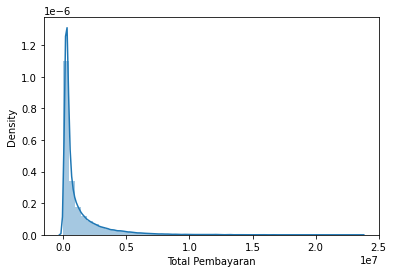

In [ ]:
sns.distplot(transactions_dataset['total_amount'])
plt.xlabel("Total Pembayaran")
plt.show()

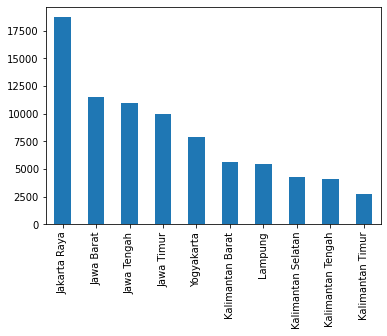

In [ ]:
customer_dataset['home_location'].value_counts()[:10].plot(kind='bar')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


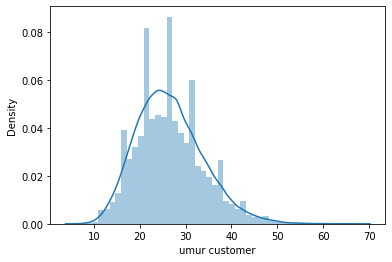

In [ ]:
customer_dataset['umur'] = 2022-customer_dataset['birthdate'].dt.year
sns.distplot(customer_dataset['umur'])
plt.xlabel("umur customer")
plt.show()

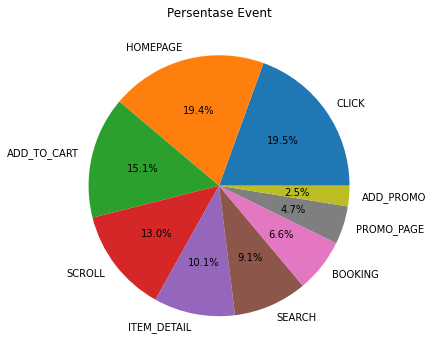

In [ ]:
plt.figure(figsize=(8,6))
plt.pie(click_stream_dataset["event_name"].value_counts(),
        autopct="%1.1f%%",
        labels=click_stream_dataset['event_name'].value_counts().index)
plt.title("Persentase Event")
plt.show()

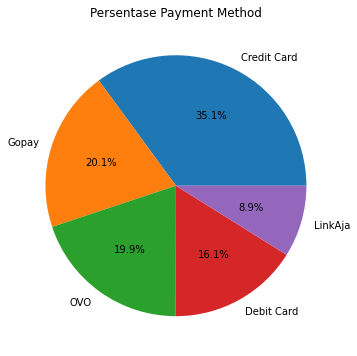

In [ ]:
plt.figure(figsize=(8,6))
plt.pie(transactions_dataset["payment_method"].value_counts(),
        autopct="%1.1f%%",
        labels=transactions_dataset['payment_method'].value_counts().index)
plt.title("Persentase Payment Method")
plt.show()

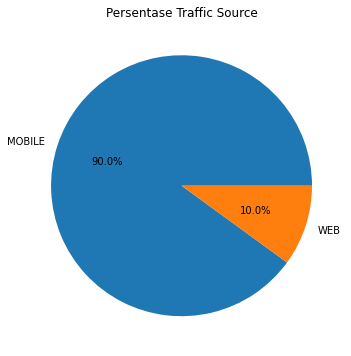

In [ ]:
plt.figure(figsize=(8,6))
plt.pie(click_stream_dataset["traffic_source"].value_counts(),
        autopct="%1.1f%%",
        labels=click_stream_dataset['traffic_source'].value_counts().index)
plt.title("Persentase Traffic Source")
plt.show()

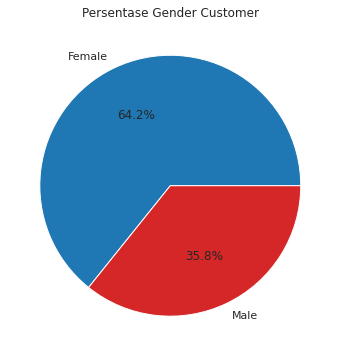

In [ ]:
x = ["Female", "Male"]
a = customer_dataset[customer_dataset["gender"] == "F"]["gender"].count()
b = customer_dataset[customer_dataset["gender"] == "M"]["gender"].count()
y = np.array([a, b])
plt.figure(figsize=(8,6))
bar_colors = ['tab:blue', 'tab:red']
plt.pie(y, labels = x, colors = bar_colors, autopct='%1.1f%%') 
plt.title("Persentase Gender Customer")
plt.show()

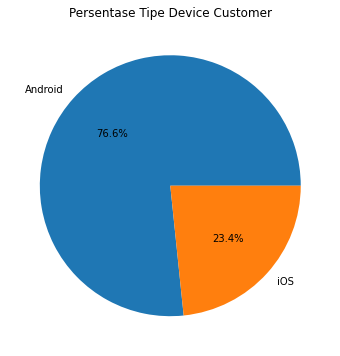

In [ ]:
plt.figure(figsize=(8,6))
plt.pie(customer_dataset['device_type'].value_counts(),
        autopct="%1.1f%%",
        labels=customer_dataset['device_type'].value_counts().index)
plt.title("Persentase Tipe Device Customer")
plt.show()

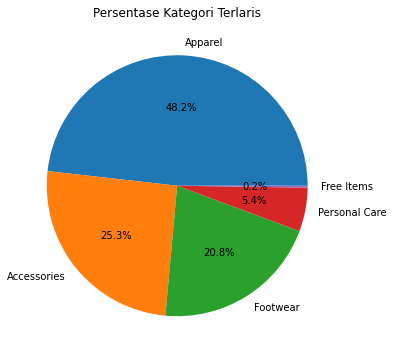

In [ ]:
customer_product=transactions_dataset.merge(product_dataset[['product_id','masterCategory','subCategory','articleType','season']],on='product_id',how='left')
customer_product=customer_product.merge(customer_dataset[['customer_id','gender']],on='customer_id',how='left')

plt.figure(figsize=(8,6))
plt.pie(customer_product['masterCategory'].value_counts()[:5],
        autopct="%1.1f%%",
        labels=customer_product['masterCategory'].value_counts()[:5].index)
plt.title("Persentase Kategori Terlaris")
plt.show()

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


Text(0.5, 1.0, 'Penjualan Pakaian Terlaris')

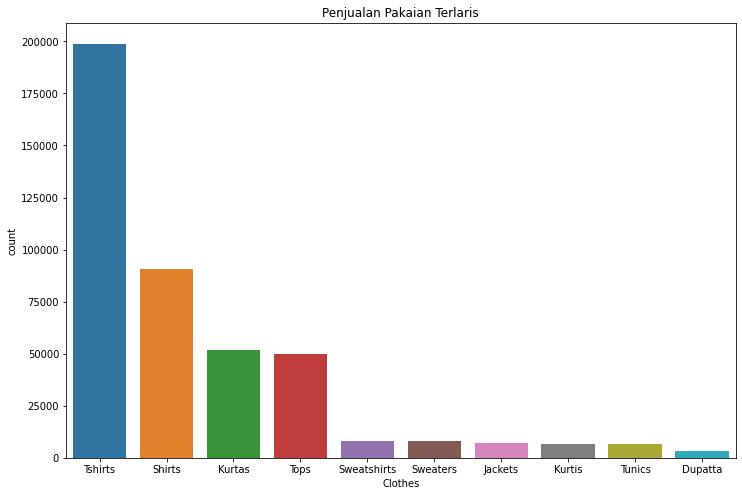

In [ ]:
# Jenis pakaian yang paling banyak diminati oleh customer

topwear = customer_product[customer_product['subCategory'] == 'Topwear']
topwear.rename(columns = {"articleType":"Clothes"},inplace=True)
plt.figure(figsize=(12,8))
sns.countplot(x = 'Clothes',
              data = topwear,
              order = topwear['Clothes'].value_counts()[:10].index)
plt.title('Penjualan Pakaian Terlaris')

In [ ]:
a = product_dataset[['masterCategory', 'subCategory', 'articleType']]
b = a.groupby(['masterCategory', 'subCategory', 'articleType'])['articleType'].count()
c = pd.DataFrame(b)
pd.set_option('display.max_rows', None)
c

articleType
masterCategory subCategory              articleType                           
Accessories    Accessories              Accessory Gift Set                  97
                                        Baby Dolls                           0
                                        Backpacks                            0
                                        Bangle                               0
                                        Basketballs                          0
                                        Bath Robe                            0
                                        Beauty Accessory                     0
                                        Belts                                0
                                        Blazers                              0
                                        Body Lotion                          0
                                        Body Wash and Scrub                  0
                                        Booties                              0
                                        Boxers                               0
                                        Bra                                  0
                                        Bracelet                             0
                                        Briefs                               0
                                        Camisoles                            0
                                        Capris                               0
                                        Caps                                 0
                                        Casual Shoes                         0
                                        Churidar                             0
                                        Clothing Set                         0
                                        Clutches                             0
                                        Compact                              0
                                        Concealer                            0
                                        Cufflinks                            0
                                        Cushion Covers                       0
                                        Deodorant                            0
                                        Dresses                              0
                                        Duffel Bag                           0
                                        Dupatta                              0
                                        Earrings                             0
                                        Eye Cream                            0
                                        Eyeshadow                            0
                                        Face Moisturisers                    0
                                        Face Scrub and Exfoliator            0
                                        Face Serum and Gel                   0
                                        Face Wash and Cleanser               0
                                        Flats                                0
                                        Flip Flops                           0
                                        Footballs                            0
                                        Formal Shoes                         0
                                        Foundation and Primer                0
                                        Fragrance Gift Set                   0
                                        Free Gifts                           0
                                        Gloves                               0
                                        Hair Accessory                       1
                                        Hair Colour                          0
                                        Handbags                             0
                                      

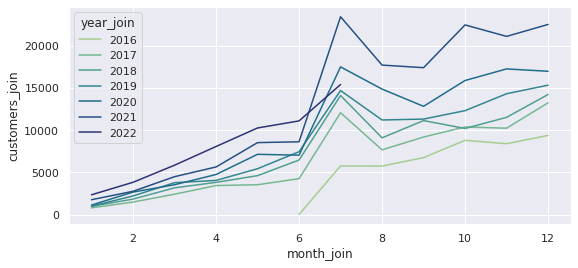

In [ ]:
date = customer_dataset.copy()
date['first_join_date'] = date['first_join_date'].astype('datetime64')
date['year_join'] = date['first_join_date'].dt.year # partisi berdasarkan year
date['month_join'] = date['first_join_date'].dt.month # partisi bedasarkan month

month = date.groupby(['year_join', 'month_join']).agg(
    customers_join = pd.NamedAgg(column = 'month_join', aggfunc = sum))  # membuat kolom customers_join
month.reset_index(inplace=True)

sns.set(rc={"figure.figsize":(9, 4)})
sns.lineplot(data=month, x="month_join", y="customers_join", hue="year_join", palette="crest")

Jumlah customers terdaftar: 100000
Jumlah customers yang pernah bertransaksi: 50705
Jumlah customers yang sukses bertransaksi: 50242


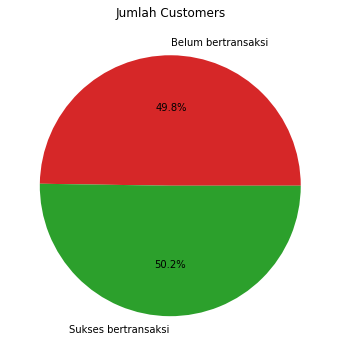

In [ ]:
# filter transactions yang memiliki payment_status = success
success = transactions_dataset.copy()
success = transactions_dataset[transactions_dataset['payment_status'] == 'Success']

a = customer_dataset['customer_id'].nunique()
b = success['customer_id'].nunique()
c = a-b

print('Jumlah customers terdaftar:', a)
print('Jumlah customers yang pernah bertransaksi:', transactions_dataset['customer_id'].nunique())
print('Jumlah customers yang sukses bertransaksi:', b)

x = ["Belum bertransaksi", "Sukses bertransaksi"]
y = np.array([c, b])
bar_colors = ['tab:red', 'tab:green']

plt.figure(figsize=(8,6))
plt.pie(y, labels = x, colors = bar_colors, autopct='%1.1f%%')
plt.title('Jumlah Customers')
plt.show() 

Jumlah Transaksi: 815964
1. Dengan promo: 460971
2. Tanpa promo: 354993


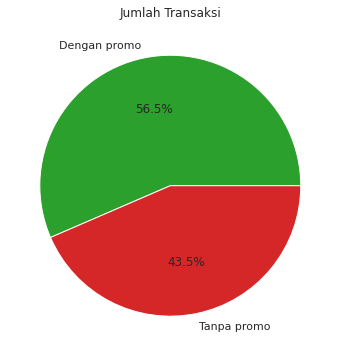

In [ ]:
# transactions by promo usage
x = success['created_at'].nunique()
y = success['promo_code'].value_counts().sum()
z = x-y

print('Jumlah Transaksi:', x)
print('1. Dengan promo:', y)
print('2. Tanpa promo:', z)

x = ["Dengan promo", "Tanpa promo"]
y = np.array([y, z])
bar_colors = ['tab:green', 'tab:red']

plt.figure(figsize=(8,6))
plt.pie(y, labels = x, colors = bar_colors, autopct='%1.1f%%')
plt.title('Jumlah Transaksi')
plt.show() 

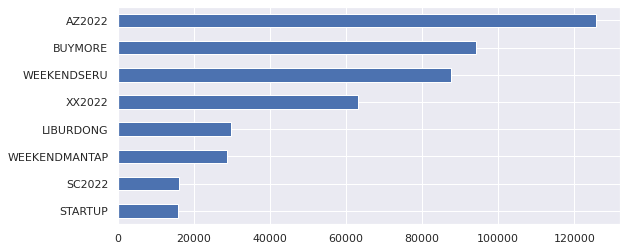

In [ ]:
# transactions by promo_code usage
success['promo_code'].value_counts().sort_values().plot(kind='barh')

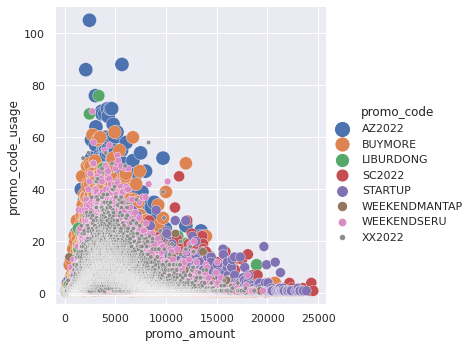

In [ ]:
# promo amount vs promo code vs promo usage
promo = success.groupby(['promo_code', 'promo_amount']).agg(
    promo_code_usage = pd.NamedAgg(column = 'promo_code', aggfunc = len))  # membuat kolom baru
promo.reset_index(inplace=True)

sns.relplot(
    data=promo, x="promo_amount", y="promo_code_usage", hue='promo_code', 
    size="promo_code", 
    sizes=(20, 200),
    kind="scatter")

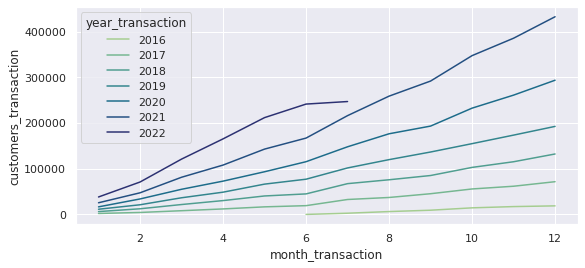

In [ ]:
# transactions by created_at
date = success.copy()
date['created_at'] = date['created_at'].astype('datetime64')
date['year_transaction'] = date['created_at'].dt.year # partisi berdasarkan year
date['month_transaction'] = date['created_at'].dt.month # partisi bedasarkan month

month = date.groupby(['year_transaction', 'month_transaction']).agg(
    customers_transaction = pd.NamedAgg(column = 'month_transaction', aggfunc = sum))  # membuat kolom customers_transaction
month.reset_index(inplace=True)

sns.set(rc={"figure.figsize":(9, 4)})
sns.lineplot(data=month, x="month_transaction", y="customers_transaction", hue="year_transaction", palette="crest")

count    50242.0
mean        24.0
std         43.0
min          1.0
25%          2.0
50%          8.0
75%         26.0
max        807.0
Name: customer_booking, dtype: float64


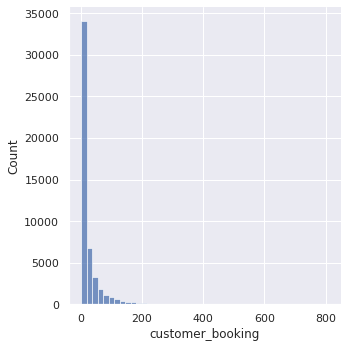

In [ ]:
# booking tiap customer
booking = success.groupby(['customer_id']).agg(
    customer_booking = pd.NamedAgg(column = 'booking_id', aggfunc = len))  # membuat kolom baru
booking.reset_index(inplace=True)

print(booking['customer_booking'].describe().round(0))
sns.displot(booking, x="customer_booking", binwidth=18)

count    1201035.0
mean        9195.0
std         9378.0
min            0.0
25%            0.0
50%        10000.0
75%        10000.0
max        50000.0
Name: shipment_fee, dtype: float64


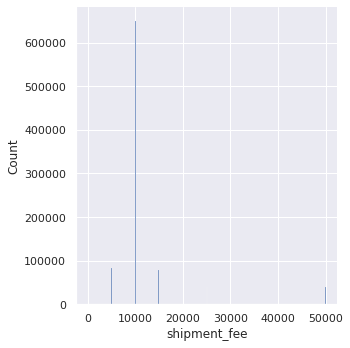

In [ ]:
# shipment fee
print(success['shipment_fee'].describe().round(0))
sns.displot(success, x="shipment_fee")

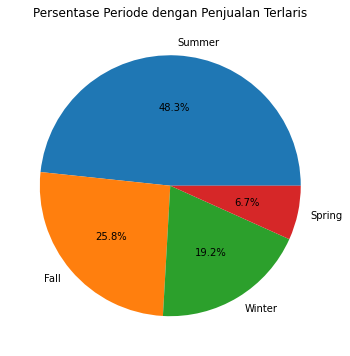

In [ ]:
success = transactions_dataset.copy()
success = transactions_dataset[transactions_dataset['payment_status'] == 'Success']

product_transactions = success.merge(product_dataset, how='left', on='product_id') # merge column transactions dan products
season = product_transactions.groupby('season')['quantity'].sum()
plt.figure(figsize=(8,6))
plt.pie(season.sort_values(ascending=False),
        autopct="%1.1f%%",
        labels=season.sort_values(ascending=False).index)
plt.title("Persentase Periode dengan Penjualan Terlaris")
plt.show()

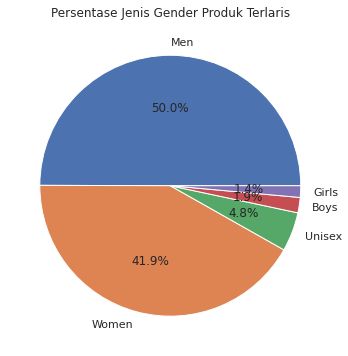

In [ ]:
gender = product_transactions.groupby('gender')['quantity'].sum()
plt.figure(figsize=(8,6))
plt.pie(gender.sort_values(ascending=False),
        autopct="%1.1f%%",
        labels=gender.sort_values(ascending=False).index)
plt.title("Persentase Jenis Gender Produk Terlaris")
plt.show()

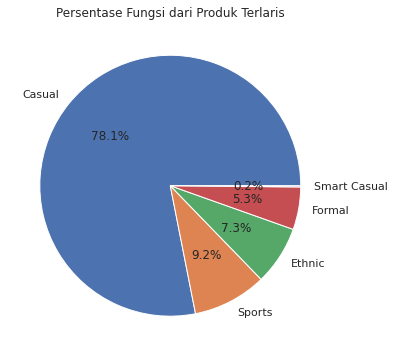

In [ ]:
# by usage

usage = product_transactions.groupby('usage')['quantity'].sum()
plt.figure(figsize=(8,6))
plt.pie(usage.sort_values(ascending=False)[:5],
        autopct="%1.1f%%",
        labels=usage.sort_values(ascending=False)[:5].index)
plt.title("Persentase Fungsi dari Produk Terlaris")
plt.show()

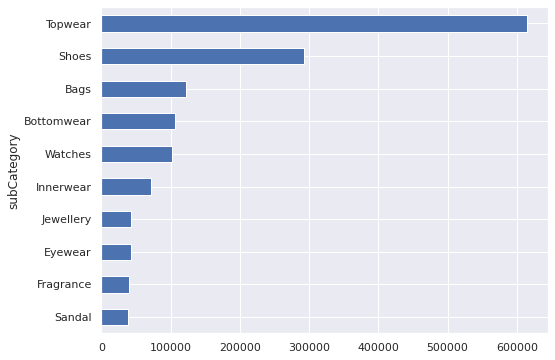

In [ ]:
# by subcategory

subCategory = product_transactions.groupby('subCategory')['quantity'].sum()
plt.figure(figsize=(8,6))
subCategory.sort_values(ascending=False)[:10].sort_values().plot(kind='barh')

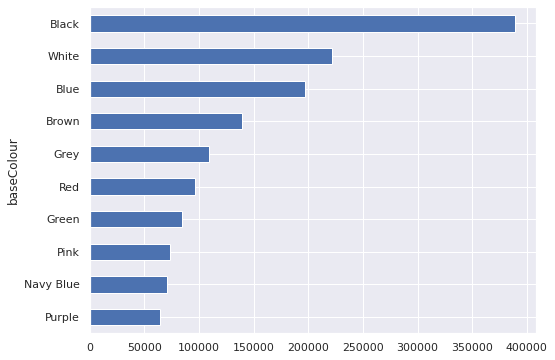

In [ ]:
# by baseColour

baseColour = product_transactions.groupby('baseColour')['quantity'].sum()
plt.figure(figsize=(8,6))
baseColour.sort_values(ascending=False)[:10].sort_values().plot(kind='barh')

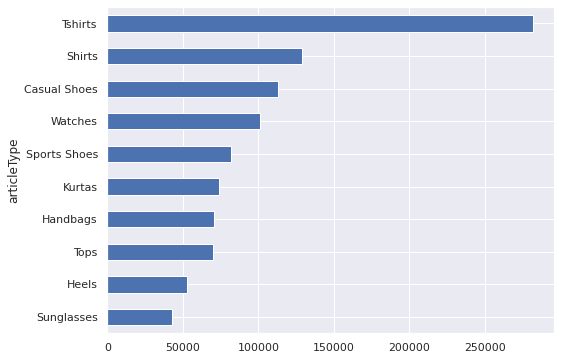

In [ ]:
# by articleType

articleType = product_transactions.groupby('articleType')['quantity'].sum()
plt.figure(figsize=(8,6))
articleType.sort_values(ascending=False)[:10].sort_values().plot(kind='barh')

In [ ]:
# top 10 products

total_product = product_transactions[['created_at', 'productDisplayName', 'articleType', 'quantity']].groupby(['productDisplayName', 'articleType']).agg(
    quantity = pd.NamedAgg(column = 'quantity', aggfunc=sum)
)
total_product.sort_values(by='quantity', ascending=False)[:10]

,,quantity
productDisplayName,articleType,
Lucera Women Silver Earrings,Earrings,3241
Lucera Women Silver Ring,Ring,2144
Lucera Women Silver Pendant,Pendant,2142
Catwalk Women Black Heels,Heels,2024
Q&Q Men Black Dial Watch,Watches,1798
Fastrack Men Black Dial Watch,Watches,1569
Fabindia Women Anusuya Silver Earrings,Earrings,1476
Maxima Men White Dial Watch,Watches,1367
FNF Multi Coloured Printed Sari,Sarees,1267


# **3. Feature Engineering**

## **3.1 Feature Dataset**

In [ ]:
#Slicing click stream by event_name

# homepage
homepage = click_stream_dataset[(click_stream_dataset['event_name'] == 'HOMEPAGE')]
homepage = homepage.groupby('session_id')['event_name'].count()
homepage = homepage.to_frame().rename(columns={"event_name": "homepage"}).reset_index()

# scroll
scroll = click_stream_dataset[(click_stream_dataset['event_name'] == 'SCROLL')]
scroll = scroll.groupby('session_id')['event_name'].count()
scroll = scroll.to_frame().rename(columns={"event_name": "scroll"}).reset_index()

# click
click = click_stream_dataset[(click_stream_dataset['event_name'] == 'CLICK')]
click = click.groupby('session_id')['event_name'].count()
click = click.to_frame().rename(columns={"event_name": "click"}).reset_index()

# item_detail
item_detail = click_stream_dataset[(click_stream_dataset['event_name'] == 'ITEM_DETAIL')]
item_detail = item_detail.groupby('session_id')['event_name'].count()
item_detail = item_detail.to_frame().rename(columns={"event_name": "item_detail"}).reset_index()

# promo_page
promo_page = click_stream_dataset[(click_stream_dataset['event_name'] == 'PROMO_PAGE')]
promo_page = promo_page.groupby('session_id')['event_name'].count()
promo_page = promo_page.to_frame().rename(columns={"event_name": "promo_page"}).reset_index()

# search
search = click_stream_dataset[(click_stream_dataset['event_name'] == 'SEARCH')]
search = search.groupby('session_id')['event_name'].count()
search = search.to_frame().rename(columns={"event_name": "search"}).reset_index()

# add_to_cart
add_to_cart = click_stream_dataset[(click_stream_dataset['event_name'] == 'ADD_TO_CART')]
add_to_cart = add_to_cart.groupby('session_id')['event_name'].count()
add_to_cart = add_to_cart.to_frame().rename(columns={"event_name": "add_to_cart"}).reset_index()

# add_promo
add_promo = click_stream_dataset[(click_stream_dataset['event_name'] == 'ADD_PROMO')]
add_promo = add_promo.groupby('session_id')['event_name'].count()
add_promo = add_promo.to_frame().rename(columns={"event_name": "add_promo"}).reset_index()

# Slicing click_stream_dataset by traffic_source

# web
web = click_stream_dataset[(click_stream_dataset['traffic_source'] == 'WEB')]
web = web.groupby('session_id')['traffic_source'].count()
web = web.to_frame().rename(columns={"traffic_source": "web"}).reset_index()

# mobile
mobile = click_stream_dataset[(click_stream_dataset['traffic_source'] == 'MOBILE')]
mobile = mobile.groupby('session_id')['traffic_source'].count()
mobile = mobile.to_frame().rename(columns={"traffic_source": "mobile"}).reset_index()

In [ ]:
# merge all table 

stream = click_stream_dataset[['session_id', 'event_time']].merge(homepage, on='session_id', how='left')
stream = stream.merge(scroll, on='session_id', how='left')
stream = stream.merge(click, on='session_id', how='left')
stream = stream.merge(item_detail, on='session_id', how='left')
stream = stream.merge(promo_page, on='session_id', how='left')
stream = stream.merge(search, on='session_id', how='left')
stream = stream.merge(add_to_cart, on='session_id', how='left')
stream = stream.merge(add_promo, on='session_id', how='left')
stream = stream.merge(web, on='session_id', how='left')
stream = stream.merge(mobile, on='session_id', how='left')

stream.head()

,session_id,event_time,homepage,scroll,click,item_detail,promo_page,search,add_to_cart,add_promo,web,mobile
0,fb0abf9e-fd1a-44dd-b5c0-2834d5a4b81c,2019-09-06 15:54:32.821085,1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
1,fb0abf9e-fd1a-44dd-b5c0-2834d5a4b81c,2019-09-06 16:03:57.821085,1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
2,7d440441-e67a-4d36-b324-80ffd636d166,2019-09-01 12:05:10.322763,2,1.0,NaN,3.0,NaN,1.0,1.0,NaN,NaN,9.0
3,7d440441-e67a-4d36-b324-80ffd636d166,2019-09-01 12:06:33.322763,2,1.0,NaN,3.0,NaN,1.0,1.0,NaN,NaN,9.0
4,7d440441-e67a-4d36-b324-80ffd636d166,2019-09-01 12:15:29.425431,2,1.0,NaN,3.0,NaN,1.0,1.0,NaN,NaN,9.0


In [ ]:
success = transactions_dataset.copy()

df_master = success.merge(stream, on='session_id', how='left')
df_master.head()

In [ ]:
# Export Master Dataset

df_master.to_csv('master.csv', index=False)
files.download("master.csv")

In [ ]:
success = transactions_dataset[transactions_dataset['payment_status'] == 'Success'][['session_id', 'created_at', 'customer_id', 'booking_id', 'promo_amount', 'shipment_fee', 'total_amount', 'product_id', 'quantity', 'item_price']]

df_feature = success.merge(stream, on='session_id', how='left')
df_feature.head()

,session_id,created_at,customer_id,booking_id,promo_amount,shipment_fee,total_amount,product_id,quantity,item_price,event_time,homepage,scroll,click,item_detail,promo_page,search,add_to_cart,add_promo,web,mobile
0,3abaa6ce-e320-4e51-9469-d9f3fa328e86,2018-07-29 15:22:01.458193,5868,186e2bee-0637-4710-8981-50c2d737bc42,1415,10000,199832,54728,1,191247,2018-07-29 14:41:48.913621,4.0,NaN,7.0,2.0,5.0,1.0,4.0,1.0,25.0,NaN
1,3abaa6ce-e320-4e51-9469-d9f3fa328e86,2018-07-29 15:22:01.458193,5868,186e2bee-0637-4710-8981-50c2d737bc42,1415,10000,199832,54728,1,191247,2018-07-29 14:43:45.913621,4.0,NaN,7.0,2.0,5.0,1.0,4.0,1.0,25.0,NaN
2,3abaa6ce-e320-4e51-9469-d9f3fa328e86,2018-07-29 15:22:01.458193,5868,186e2bee-0637-4710-8981-50c2d737bc42,1415,10000,199832,54728,1,191247,2018-07-29 14:45:20.913621,4.0,NaN,7.0,2.0,5.0,1.0,4.0,1.0,25.0,NaN
3,3abaa6ce-e320-4e51-9469-d9f3fa328e86,2018-07-29 15:22:01.458193,5868,186e2bee-0637-4710-8981-50c2d737bc42,1415,10000,199832,54728,1,191247,2018-07-29 15:22:01.458193,4.0,NaN,7.0,2.0,5.0,1.0,4.0,1.0,25.0,NaN
4,3abaa6ce-e320-4e51-9469-d9f3fa328e86,2018-07-29 15:22:01.458193,5868,186e2bee-0637-4710-8981-50c2d737bc42,1415,10000,199832,54728,1,191247,2018-07-29 14:43:19.913621,4.0,NaN,7.0,2.0,5.0,1.0,4.0,1.0,25.0,NaN


In [ ]:
# data aggregate

df_agg = df_feature.groupby(['customer_id']).agg(
                            total_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=sum),
                            min_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=min),
                            max_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=max),
                            avg_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc='mean'),

                            total_amount = pd.NamedAgg(column = 'total_amount', aggfunc=sum),
                            min_amount = pd.NamedAgg(column = 'total_amount', aggfunc=min),
                            max_amount = pd.NamedAgg(column = 'total_amount', aggfunc=max),
                            avg_amount = pd.NamedAgg(column = 'total_amount', aggfunc='mean'),

                            total_quantity = pd.NamedAgg(column = 'quantity', aggfunc=sum),
                            min_quantity = pd.NamedAgg(column = 'quantity', aggfunc=min),
                            max_quantity = pd.NamedAgg(column = 'quantity', aggfunc=max),
                            avg_quantity = pd.NamedAgg(column = 'quantity', aggfunc='mean'),

                            min_item_price = pd.NamedAgg(column = 'item_price', aggfunc=min),
                            max_item_price = pd.NamedAgg(column = 'item_price', aggfunc=max),
                            avg_item_price = pd.NamedAgg(column = 'item_price', aggfunc='mean'),
                            
                            freguency_trx = pd.NamedAgg(column = 'booking_id', aggfunc='nunique'),
                            total_unique_product = pd.NamedAgg(column = 'product_id', aggfunc='nunique'),
                            first_transaction = pd.NamedAgg(column = 'created_at', aggfunc=min),
                            last_transaction = pd.NamedAgg(column = 'created_at', aggfunc=max),
                            total_promo_amount = pd.NamedAgg(column = 'promo_amount', aggfunc=sum),
                            total_promo_code = pd.NamedAgg(column = 'promo_amount', aggfunc='nunique'),

                            avg_homepage = pd.NamedAgg(column = 'homepage', aggfunc='mean'),
                            avg_scroll = pd.NamedAgg(column = 'scroll', aggfunc='mean'),
                            avg_click = pd.NamedAgg(column = 'click', aggfunc='mean'),
                            item_detail = pd.NamedAgg(column = 'item_detail', aggfunc='mean'),
                            avg_promo_page = pd.NamedAgg(column = 'promo_page', aggfunc='mean'),
                            avg_search = pd.NamedAgg(column = 'search', aggfunc='mean'),
                            avg_add_to_cart = pd.NamedAgg(column = 'add_to_cart', aggfunc='mean'),
                            avg_add_promo = pd.NamedAgg(column = 'add_promo', aggfunc='mean'),

                            avg_web = pd.NamedAgg(column = 'web', aggfunc='mean'),
                            avg_mobile = pd.NamedAgg(column = 'mobile', aggfunc='mean')

                            ).reset_index()

In [ ]:
df_agg.head()

In [ ]:
!cp feature.csv "/content/gdrive/My Drive/Mockup Dataset/"

In [ ]:
# Export Data Feature

df_feature.to_csv('feature.csv', index=False)
files.download("feature.csv")

In [ ]:
# Split Data

df_1 = df_feature.iloc[:4000000,:]
df_2 = df_feature.iloc[4000000:8000000,:]
df_3 = df_feature.iloc[8000000:12000000,:]
df_4 = df_feature.iloc[12000000:16000000,:]
df_5 = df_feature.iloc[16000000:,:]

In [ ]:
# Data Frame to csv

df_1.to_csv('df_1.csv', index=False)
df_2.to_csv('df_2.csv', index=False)
df_3.to_csv('df_3.csv', index=False)
df_4.to_csv('df_4.csv', index=False)
df_5.to_csv('df_5.csv', index=False)

In [ ]:
# Download File

files.download("df_1.csv")
files.download("df_2.csv")
files.download("df_3.csv")
files.download("df_4.csv")
files.download("df_5.csv")

In [ ]:
# Read Dataset

df_feature = pd.read_csv('gdrive/My Drive/Mockup Dataset/feature.csv')

In [ ]:
df_feature.head()

## **3.2 Churn Label**

#### Customer Churn

Pergeseran atau pengurangan pelanggan adalah salah satu masalah paling penting untuk bisnis apa pun yang secara langsung menjual atau melayani pelanggan Baik itu penyedia layanan Telecom, bisnis eCommerce atau SaaS, penting untuk melacak dan menganalisis berapa banyak pelanggan yang meninggalkan platform dan berapa banyak yang bertahan dan alasan di balik mereka. Mengetahui perilaku pelanggan dapat sangat meningkatkan proses pengambilan keputusan dan selanjutnya dapat membantu mengurangi churn untuk meningkatkan profitabilitas.

In [ ]:
# Data actual
print(min(df_feature['created_at']))
print(max(df_feature['created_at']))

2016-06-30 23:18:44.792905
2022-07-31 23:59:19.821469


In [ ]:
# create func for label churn
def label(df):
    if (df['yearmonth_x'] == 0) | (df['yearmonth_y'] == 0):
        return 1 #1 adalah customer label churn
    elif (df['yearmonth_x'] != 0) & (df['yearmonth_y'] != 0):
        return 0 #0 adalah customer level tidak churn
    else:
        return " "

def qlabel(df):
    if (df['quarter_x'] == 0) | (df['quarter_y'] == 0):
        return 1 #1 adalah customer label churn
    elif (df['quarter_x'] != 0) & (df['quarter_y'] != 0):
        return 0 #0 adalah customer level tidak churn
    else:
        return " "

def slabel(df):
    if (df['semester_x'] == 0) | (df['semester_y'] == 0):
        return 1 #1 adalah customer label churn
    elif (df['semester_x'] != 0) & (df['semester_y'] != 0):
        return 0 #0 adalah customer level tidak churn
    else:
        return " "

In [ ]:
df_feature.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19888031 entries, 0 to 19888030
Data columns (total 21 columns):
 #   Column        Dtype  
---  ------        -----  
 0   session_id    object 
 1   created_at    object 
 2   customer_id   int64  
 3   booking_id    object 
 4   promo_amount  int64  
 5   shipment_fee  int64  
 6   total_amount  int64  
 7   product_id    int64  
 8   quantity      int64  
 9   item_price    int64  
 10  event_time    object 
 11  homepage      float64
 12  scroll        float64
 13  click         float64
 14  item_detail   float64
 15  promo_page    float64
 16  search        float64
 17  add_to_cart   float64
 18  add_promo     float64
 19  web           float64
 20  mobile        float64
dtypes: float64(10), int64(7), object(4)
memory usage: 3.1+ GB


In [ ]:
# Change data type of feature 'created-at'

df_feature['created_at'] = df_feature['created_at'].astype('datetime64')

### **3.3.1 Monthly**

In [ ]:
# Get yearmonth

df_feature['yearmonth'] = df_feature['created_at'].dt.strftime('%Y-%m')

In [ ]:
# Check min max of month
print(min(df_feature['yearmonth']))
print(max(df_feature['yearmonth']))

2016-06
2022-07


In [ ]:
# data aggregate

df_agg = df_feature.groupby(['yearmonth','customer_id']).agg(
                            total_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=sum),
                            min_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=min),
                            max_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=max),
                            avg_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc='mean'),

                            total_amount = pd.NamedAgg(column = 'total_amount', aggfunc=sum),
                            min_amount = pd.NamedAgg(column = 'total_amount', aggfunc=min),
                            max_amount = pd.NamedAgg(column = 'total_amount', aggfunc=max),
                            avg_amount = pd.NamedAgg(column = 'total_amount', aggfunc='mean'),

                            total_quantity = pd.NamedAgg(column = 'quantity', aggfunc=sum),
                            min_quantity = pd.NamedAgg(column = 'quantity', aggfunc=min),
                            max_quantity = pd.NamedAgg(column = 'quantity', aggfunc=max),
                            avg_quantity = pd.NamedAgg(column = 'quantity', aggfunc='mean'),

                            min_item_price = pd.NamedAgg(column = 'item_price', aggfunc=min),
                            max_item_price = pd.NamedAgg(column = 'item_price', aggfunc=max),
                            avg_item_price = pd.NamedAgg(column = 'item_price', aggfunc='mean'),
                            
                            freguency_trx = pd.NamedAgg(column = 'booking_id', aggfunc='nunique'),
                            total_unique_product = pd.NamedAgg(column = 'product_id', aggfunc='nunique'),
                            first_transaction = pd.NamedAgg(column = 'created_at', aggfunc=min),
                            last_transaction = pd.NamedAgg(column = 'created_at', aggfunc=max),
                            total_promo_amount = pd.NamedAgg(column = 'promo_amount', aggfunc=sum),
                            total_promo_code = pd.NamedAgg(column = 'promo_amount', aggfunc='nunique'),

                            avg_homepage = pd.NamedAgg(column = 'homepage', aggfunc='mean'),
                            avg_scroll = pd.NamedAgg(column = 'scroll', aggfunc='mean'),
                            avg_click = pd.NamedAgg(column = 'click', aggfunc='mean'),
                            item_detail = pd.NamedAgg(column = 'item_detail', aggfunc='mean'),
                            avg_promo_page = pd.NamedAgg(column = 'promo_page', aggfunc='mean'),
                            avg_search = pd.NamedAgg(column = 'search', aggfunc='mean'),
                            avg_add_to_cart = pd.NamedAgg(column = 'add_to_cart', aggfunc='mean'),
                            avg_add_promo = pd.NamedAgg(column = 'add_promo', aggfunc='mean'),

                            avg_web = pd.NamedAgg(column = 'web', aggfunc='mean'),
                            avg_mobile = pd.NamedAgg(column = 'mobile', aggfunc='mean')

                            ).reset_index()

In [ ]:
# 2016

month7_16 = df_agg[df_agg['yearmonth'] == '2016-07']
month8_16 = df_agg[df_agg['yearmonth'] == '2016-08']
month9_16 = df_agg[df_agg['yearmonth'] == '2016-09']
month10_16 = df_agg[df_agg['yearmonth'] == '2016-10']
month11_16 = df_agg[df_agg['yearmonth'] == '2016-11']
month12_16 = df_agg[df_agg['yearmonth'] == '2016-12']

# 2017

month1_17 = df_agg[df_agg['yearmonth'] == '2017-01']
month2_17 = df_agg[df_agg['yearmonth'] == '2017-02']
month3_17 = df_agg[df_agg['yearmonth'] == '2017-03']
month4_17 = df_agg[df_agg['yearmonth'] == '2017-04']
month5_17 = df_agg[df_agg['yearmonth'] == '2017-05']
month6_17 = df_agg[df_agg['yearmonth'] == '2017-06']
month7_17 = df_agg[df_agg['yearmonth'] == '2017-07']
month8_17 = df_agg[df_agg['yearmonth'] == '2017-08']
month9_17 = df_agg[df_agg['yearmonth'] == '2017-09']
month10_17 = df_agg[df_agg['yearmonth'] == '2017-10']
month11_17 = df_agg[df_agg['yearmonth'] == '2017-11']
month12_17 = df_agg[df_agg['yearmonth'] == '2017-12']

# 2018

month1_18 = df_agg[df_agg['yearmonth'] == '2018-01']
month2_18 = df_agg[df_agg['yearmonth'] == '2018-02']
month3_18 = df_agg[df_agg['yearmonth'] == '2018-03']
month4_18 = df_agg[df_agg['yearmonth'] == '2018-04']
month5_18 = df_agg[df_agg['yearmonth'] == '2018-05']
month6_18 = df_agg[df_agg['yearmonth'] == '2018-06']
month7_18 = df_agg[df_agg['yearmonth'] == '2018-07']
month8_18 = df_agg[df_agg['yearmonth'] == '2018-08']
month9_18 = df_agg[df_agg['yearmonth'] == '2018-09']
month10_18 = df_agg[df_agg['yearmonth'] == '2018-10']
month11_18 = df_agg[df_agg['yearmonth'] == '2018-11']
month12_18 = df_agg[df_agg['yearmonth'] == '2018-12']

# 2019

month1_19 = df_agg[df_agg['yearmonth'] == '2019-01']
month2_19 = df_agg[df_agg['yearmonth'] == '2019-02']
month3_19 = df_agg[df_agg['yearmonth'] == '2019-03']
month4_19 = df_agg[df_agg['yearmonth'] == '2019-04']
month5_19 = df_agg[df_agg['yearmonth'] == '2019-05']
month6_19 = df_agg[df_agg['yearmonth'] == '2019-06']
month7_19 = df_agg[df_agg['yearmonth'] == '2019-07']
month8_19 = df_agg[df_agg['yearmonth'] == '2019-08']
month9_19 = df_agg[df_agg['yearmonth'] == '2019-09']
month10_19 = df_agg[df_agg['yearmonth'] == '2019-10']
month11_19 = df_agg[df_agg['yearmonth'] == '2019-11']
month12_19 = df_agg[df_agg['yearmonth'] == '2019-12']

# 2020

month1_20 = df_agg[df_agg['yearmonth'] == '2020-01']
month2_20 = df_agg[df_agg['yearmonth'] == '2020-02']
month3_20 = df_agg[df_agg['yearmonth'] == '2020-03']
month4_20 = df_agg[df_agg['yearmonth'] == '2020-04']
month5_20 = df_agg[df_agg['yearmonth'] == '2020-05']
month6_20 = df_agg[df_agg['yearmonth'] == '2020-06']
month7_20 = df_agg[df_agg['yearmonth'] == '2020-07']
month8_20 = df_agg[df_agg['yearmonth'] == '2020-08']
month9_20 = df_agg[df_agg['yearmonth'] == '2020-09']
month10_20 = df_agg[df_agg['yearmonth'] == '2020-10']
month11_20 = df_agg[df_agg['yearmonth'] == '2020-11']
month12_20 = df_agg[df_agg['yearmonth'] == '2020-12']

# 2021

month1_21 = df_agg[df_agg['yearmonth'] == '2021-01']
month2_21 = df_agg[df_agg['yearmonth'] == '2021-02']
month3_21 = df_agg[df_agg['yearmonth'] == '2021-03']
month4_21 = df_agg[df_agg['yearmonth'] == '2021-04']
month5_21 = df_agg[df_agg['yearmonth'] == '2021-05']
month6_21 = df_agg[df_agg['yearmonth'] == '2021-06']
month7_21 = df_agg[df_agg['yearmonth'] == '2021-07']
month8_21 = df_agg[df_agg['yearmonth'] == '2021-08']
month9_21 = df_agg[df_agg['yearmonth'] == '2021-09']
month10_21 = df_agg[df_agg['yearmonth'] == '2021-10']
month11_21 = df_agg[df_agg['yearmonth'] == '2021-11']
month12_21 = df_agg[df_agg['yearmonth'] == '2021-12']

# 2022

month1_22 = df_agg[df_agg['yearmonth'] == '2022-01']
month2_22 = df_agg[df_agg['yearmonth'] == '2022-02']
month3_22 = df_agg[df_agg['yearmonth'] == '2022-03']
month4_22 = df_agg[df_agg['yearmonth'] == '2022-04']
month5_22 = df_agg[df_agg['yearmonth'] == '2022-05']
month6_22 = df_agg[df_agg['yearmonth'] == '2022-06']
month7_22 = df_agg[df_agg['yearmonth'] == '2022-07']

In [ ]:
# Merge to get churn label

# 2016

month7_16.merge(month8_16[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn78_16 = month7_16.merge(month8_16[['customer_id','yearmonth']], on='customer_id', how='outer')
churn78_16.fillna(0, inplace = True)
churn78_16['churn'] = churn78_16.apply(label, axis =1)

month8_16.merge(month9_16[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn89_16 = month8_16.merge(month9_16[['customer_id','yearmonth']], on='customer_id', how='outer')
churn89_16.fillna(0, inplace = True)
churn89_16['churn'] = churn89_16.apply(label, axis =1)

month9_16.merge(month10_16[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn910_16 = month9_16.merge(month10_16[['customer_id','yearmonth']], on='customer_id', how='outer')
churn910_16.fillna(0, inplace = True)
churn910_16['churn'] = churn910_16.apply(label, axis =1)

month10_16.merge(month11_16[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn1011_16 = month10_16.merge(month11_16[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1011_16.fillna(0, inplace = True)
churn1011_16['churn'] = churn1011_16.apply(label, axis =1)

month11_16.merge(month12_16[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn1112_16 = month11_16.merge(month12_16[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1112_16.fillna(0, inplace = True)
churn1112_16['churn'] = churn1112_16.apply(label, axis =1)

month12_16.merge(month1_17[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn121_1617 = month12_16.merge(month1_17[['customer_id','yearmonth']], on='customer_id', how='outer')
churn121_1617.fillna(0, inplace = True)
churn121_1617['churn'] = churn121_1617.apply(label, axis =1)

# 2017

month1_17.merge(month2_17[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn12_17 = month1_17.merge(month2_17[['customer_id','yearmonth']], on='customer_id', how='outer')
churn12_17.fillna(0, inplace = True)
churn12_17['churn'] = churn12_17.apply(label, axis =1)

month2_17.merge(month3_17[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn23_17 = month2_17.merge(month3_17[['customer_id','yearmonth']], on='customer_id', how='outer')
churn23_17.fillna(0, inplace = True)
churn23_17['churn'] = churn23_17.apply(label, axis =1)

month3_17.merge(month4_17[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn34_17 = month3_17.merge(month4_17[['customer_id','yearmonth']], on='customer_id', how='outer')
churn34_17.fillna(0, inplace = True)
churn34_17['churn'] = churn34_17.apply(label, axis =1)

month4_17.merge(month5_17[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn45_17 = month4_17.merge(month5_17[['customer_id','yearmonth']], on='customer_id', how='outer')
churn45_17.fillna(0, inplace = True)
churn45_17['churn'] = churn45_17.apply(label, axis =1)

month5_17.merge(month6_17[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn56_17 = month5_17.merge(month6_17[['customer_id','yearmonth']], on='customer_id', how='outer')
churn56_17.fillna(0, inplace = True)
churn56_17['churn'] = churn56_17.apply(label, axis =1)

month6_17.merge(month7_17[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn67_17 = month6_17.merge(month7_17[['customer_id','yearmonth']], on='customer_id', how='outer')
churn67_17.fillna(0, inplace = True)
churn67_17['churn'] = churn67_17.apply(label, axis =1)

month7_17.merge(month8_17[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn78_17 = month7_17.merge(month8_17[['customer_id','yearmonth']], on='customer_id', how='outer')
churn78_17.fillna(0, inplace = True)
churn78_17['churn'] = churn78_17.apply(label, axis =1)

month8_17.merge(month9_17[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn89_17 = month8_17.merge(month9_17[['customer_id','yearmonth']], on='customer_id', how='outer')
churn89_17.fillna(0, inplace = True)
churn89_17['churn'] = churn89_17.apply(label, axis =1)

month9_17.merge(month10_17[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn910_17 = month9_17.merge(month10_17[['customer_id','yearmonth']], on='customer_id', how='outer')
churn910_17.fillna(0, inplace = True)
churn910_17['churn'] = churn910_17.apply(label, axis =1)

month10_17.merge(month11_17[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn1011_17 = month10_17.merge(month11_17[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1011_17.fillna(0, inplace = True)
churn1011_17['churn'] = churn1011_17.apply(label, axis =1)

month11_17.merge(month12_17[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn1112_17 = month11_17.merge(month12_17[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1112_17.fillna(0, inplace = True)
churn1112_17['churn'] = churn1112_17.apply(label, axis =1)

month12_17.merge(month1_18[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn121_1718 = month12_17.merge(month1_18[['customer_id','yearmonth']], on='customer_id', how='outer')
churn121_1718.fillna(0, inplace = True)
churn121_1718['churn'] = churn121_1718.apply(label, axis =1)

#2018

month1_18.merge(month2_18[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn12_18 = month1_18.merge(month2_18[['customer_id','yearmonth']], on='customer_id', how='outer')
churn12_18.fillna(0, inplace = True)
churn12_18['churn'] = churn12_18.apply(label, axis =1)

month2_18.merge(month3_18[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn23_18 = month2_18.merge(month3_18[['customer_id','yearmonth']], on='customer_id', how='outer')
churn23_18.fillna(0, inplace = True)
churn23_18['churn'] = churn23_18.apply(label, axis =1)

month3_18.merge(month4_18[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn34_18 = month3_18.merge(month4_18[['customer_id','yearmonth']], on='customer_id', how='outer')
churn34_18.fillna(0, inplace = True)
churn34_18['churn'] = churn34_18.apply(label, axis =1)

month4_18.merge(month5_18[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn45_18 = month4_18.merge(month5_18[['customer_id','yearmonth']], on='customer_id', how='outer')
churn45_18.fillna(0, inplace = True)
churn45_18['churn'] = churn45_18.apply(label, axis =1)

month5_18.merge(month6_18[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn56_18 = month5_18.merge(month6_18[['customer_id','yearmonth']], on='customer_id', how='outer')
churn56_18.fillna(0, inplace = True)
churn56_18['churn'] = churn56_18.apply(label, axis =1)

month6_18.merge(month7_18[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn67_18 = month6_18.merge(month7_18[['customer_id','yearmonth']], on='customer_id', how='outer')
churn67_18.fillna(0, inplace = True)
churn67_18['churn'] = churn67_18.apply(label, axis =1)

month7_18.merge(month8_18[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn78_18 = month7_18.merge(month8_18[['customer_id','yearmonth']], on='customer_id', how='outer')
churn78_18.fillna(0, inplace = True)
churn78_18['churn'] = churn78_18.apply(label, axis =1)

month8_18.merge(month9_18[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn89_18 = month8_18.merge(month9_18[['customer_id','yearmonth']], on='customer_id', how='outer')
churn89_18.fillna(0, inplace = True)
churn89_18['churn'] = churn89_18.apply(label, axis =1)

month9_18.merge(month10_18[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn910_18 = month9_18.merge(month10_18[['customer_id','yearmonth']], on='customer_id', how='outer')
churn910_18.fillna(0, inplace = True)
churn910_18['churn'] = churn910_18.apply(label, axis =1)

month10_18.merge(month11_18[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn1011_18 = month10_18.merge(month11_18[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1011_18.fillna(0, inplace = True)
churn1011_18['churn'] = churn1011_18.apply(label, axis =1)

month11_18.merge(month12_18[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn1112_18 = month11_18.merge(month12_18[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1112_18.fillna(0, inplace = True)
churn1112_18['churn'] = churn1112_18.apply(label, axis =1)

month12_18.merge(month1_19[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn121_1819 = month12_18.merge(month1_19[['customer_id','yearmonth']], on='customer_id', how='outer')
churn121_1819.fillna(0, inplace = True)
churn121_1819['churn'] = churn121_1819.apply(label, axis =1)

# 2019

month1_19.merge(month2_19[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn12_19 = month1_19.merge(month2_19[['customer_id','yearmonth']], on='customer_id', how='outer')
churn12_19.fillna(0, inplace = True)
churn12_19['churn'] = churn12_19.apply(label, axis =1)

month2_19.merge(month3_19[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn23_19 = month2_19.merge(month3_19[['customer_id','yearmonth']], on='customer_id', how='outer')
churn23_19.fillna(0, inplace = True)
churn23_19['churn'] = churn23_19.apply(label, axis =1)

month3_19.merge(month4_19[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn34_19 = month3_19.merge(month4_19[['customer_id','yearmonth']], on='customer_id', how='outer')
churn34_19.fillna(0, inplace = True)
churn34_19['churn'] = churn34_19.apply(label, axis =1)

month4_19.merge(month5_19[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn45_19 = month4_19.merge(month5_19[['customer_id','yearmonth']], on='customer_id', how='outer')
churn45_19.fillna(0, inplace = True)
churn45_19['churn'] = churn45_19.apply(label, axis =1)

month5_19.merge(month6_19[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn56_19 = month5_19.merge(month6_19[['customer_id','yearmonth']], on='customer_id', how='outer')
churn56_19.fillna(0, inplace = True)
churn56_19['churn'] = churn56_19.apply(label, axis =1)

month6_19.merge(month7_19[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn67_19 = month6_19.merge(month7_19[['customer_id','yearmonth']], on='customer_id', how='outer')
churn67_19.fillna(0, inplace = True)
churn67_19['churn'] = churn67_19.apply(label, axis =1)

month7_19.merge(month8_19[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn78_19 = month7_19.merge(month8_19[['customer_id','yearmonth']], on='customer_id', how='outer')
churn78_19.fillna(0, inplace = True)
churn78_19['churn'] = churn78_19.apply(label, axis =1)

month8_19.merge(month9_19[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn89_19 = month8_19.merge(month9_19[['customer_id','yearmonth']], on='customer_id', how='outer')
churn89_19.fillna(0, inplace = True)
churn89_19['churn'] = churn89_19.apply(label, axis =1)

month9_19.merge(month10_19[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn910_19 = month9_19.merge(month10_19[['customer_id','yearmonth']], on='customer_id', how='outer')
churn910_19.fillna(0, inplace = True)
churn910_19['churn'] = churn910_19.apply(label, axis =1)

month10_19.merge(month11_19[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn1011_19 = month10_19.merge(month11_19[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1011_19.fillna(0, inplace = True)
churn1011_19['churn'] = churn1011_19.apply(label, axis =1)

month11_19.merge(month12_19[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn1112_19 = month11_19.merge(month12_19[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1112_19.fillna(0, inplace = True)
churn1112_19['churn'] = churn1112_19.apply(label, axis =1)

month12_19.merge(month1_20[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn121_1920 = month12_19.merge(month1_20[['customer_id','yearmonth']], on='customer_id', how='outer')
churn121_1920.fillna(0, inplace = True)
churn121_1920['churn'] = churn121_1920.apply(label, axis =1)

# 2020

month1_20.merge(month2_20[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn12_20 = month1_20.merge(month2_20[['customer_id','yearmonth']], on='customer_id', how='outer')
churn12_20.fillna(0, inplace = True)
churn12_20['churn'] = churn12_20.apply(label, axis =1)

month2_20.merge(month3_20[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn23_20 = month2_20.merge(month3_20[['customer_id','yearmonth']], on='customer_id', how='outer')
churn23_20.fillna(0, inplace = True)
churn23_20['churn'] = churn23_20.apply(label, axis =1)

month3_20.merge(month4_20[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn34_20 = month3_20.merge(month4_20[['customer_id','yearmonth']], on='customer_id', how='outer')
churn34_20.fillna(0, inplace = True)
churn34_20['churn'] = churn34_20.apply(label, axis =1)

month4_20.merge(month5_20[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn45_20 = month4_20.merge(month5_20[['customer_id','yearmonth']], on='customer_id', how='outer')
churn45_20.fillna(0, inplace = True)
churn45_20['churn'] = churn45_20.apply(label, axis =1)

month5_20.merge(month6_20[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn56_20 = month5_20.merge(month6_20[['customer_id','yearmonth']], on='customer_id', how='outer')
churn56_20.fillna(0, inplace = True)
churn56_20['churn'] = churn56_20.apply(label, axis =1)

month6_20.merge(month7_20[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn67_20 = month6_20.merge(month7_20[['customer_id','yearmonth']], on='customer_id', how='outer')
churn67_20.fillna(0, inplace = True)
churn67_20['churn'] = churn67_20.apply(label, axis =1)

month7_20.merge(month8_20[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn78_20 = month7_20.merge(month8_20[['customer_id','yearmonth']], on='customer_id', how='outer')
churn78_20.fillna(0, inplace = True)
churn78_20['churn'] = churn78_20.apply(label, axis =1)

month8_20.merge(month9_20[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn89_20 = month8_20.merge(month9_20[['customer_id','yearmonth']], on='customer_id', how='outer')
churn89_20.fillna(0, inplace = True)
churn89_20['churn'] = churn89_20.apply(label, axis =1)

month9_20.merge(month10_20[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn910_20 = month9_20.merge(month10_20[['customer_id','yearmonth']], on='customer_id', how='outer')
churn910_20.fillna(0, inplace = True)
churn910_20['churn'] = churn910_20.apply(label, axis =1)

month10_20.merge(month11_20[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn1011_20 = month10_20.merge(month11_20[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1011_20.fillna(0, inplace = True)
churn1011_20['churn'] = churn1011_20.apply(label, axis =1)

month11_20.merge(month12_20[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn1112_20 = month11_20.merge(month12_20[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1112_20.fillna(0, inplace = True)
churn1112_20['churn'] = churn1112_20.apply(label, axis =1)

month12_20.merge(month1_21[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn121_2021 = month12_20.merge(month1_21[['customer_id','yearmonth']], on='customer_id', how='outer')
churn121_2021.fillna(0, inplace = True)
churn121_2021['churn'] = churn121_2021.apply(label, axis =1)

# 2021

month1_21.merge(month2_21[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn12_21 = month1_21.merge(month2_21[['customer_id','yearmonth']], on='customer_id', how='outer')
churn12_21.fillna(0, inplace = True)
churn12_21['churn'] = churn12_21.apply(label, axis =1)

month2_21.merge(month3_21[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn23_21 = month2_21.merge(month3_21[['customer_id','yearmonth']], on='customer_id', how='outer')
churn23_21.fillna(0, inplace = True)
churn23_21['churn'] = churn23_21.apply(label, axis =1)

month3_21.merge(month4_21[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn34_21 = month3_21.merge(month4_21[['customer_id','yearmonth']], on='customer_id', how='outer')
churn34_21.fillna(0, inplace = True)
churn34_21['churn'] = churn34_21.apply(label, axis =1)

month4_21.merge(month5_21[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn45_21 = month4_21.merge(month5_21[['customer_id','yearmonth']], on='customer_id', how='outer')
churn45_21.fillna(0, inplace = True)
churn45_21['churn'] = churn45_21.apply(label, axis =1)

month5_21.merge(month6_21[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn56_21 = month5_21.merge(month6_21[['customer_id','yearmonth']], on='customer_id', how='outer')
churn56_21.fillna(0, inplace = True)
churn56_21['churn'] = churn56_21.apply(label, axis =1)

month6_21.merge(month7_21[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn67_21 = month6_21.merge(month7_21[['customer_id','yearmonth']], on='customer_id', how='outer')
churn67_21.fillna(0, inplace = True)
churn67_21['churn'] = churn67_21.apply(label, axis =1)

month7_21.merge(month8_21[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn78_21 = month7_21.merge(month8_21[['customer_id','yearmonth']], on='customer_id', how='outer')
churn78_21.fillna(0, inplace = True)
churn78_21['churn'] = churn78_21.apply(label, axis =1)

month8_21.merge(month9_21[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn89_21 = month8_21.merge(month9_21[['customer_id','yearmonth']], on='customer_id', how='outer')
churn89_21.fillna(0, inplace = True)
churn89_21['churn'] = churn89_21.apply(label, axis =1)

month9_21.merge(month10_21[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn910_21 = month9_21.merge(month10_21[['customer_id','yearmonth']], on='customer_id', how='outer')
churn910_21.fillna(0, inplace = True)
churn910_21['churn'] = churn910_21.apply(label, axis =1)

month10_21.merge(month11_21[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn1011_21 = month10_20.merge(month11_21[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1011_21.fillna(0, inplace = True)
churn1011_21['churn'] = churn1011_21.apply(label, axis =1)

month11_21.merge(month12_21[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn1112_21 = month11_21.merge(month12_21[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1112_21.fillna(0, inplace = True)
churn1112_21['churn'] = churn1112_21.apply(label, axis =1)

month12_21.merge(month1_22[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn121_2122 = month12_21.merge(month1_22[['customer_id','yearmonth']], on='customer_id', how='outer')
churn121_2122.fillna(0, inplace = True)
churn121_2122['churn'] = churn121_2122.apply(label, axis =1)

# 2022

month1_22.merge(month2_22[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn12_22 = month1_22.merge(month2_22[['customer_id','yearmonth']], on='customer_id', how='outer')
churn12_22.fillna(0, inplace = True)
churn12_22['churn'] = churn12_22.apply(label, axis =1)

month2_22.merge(month3_22[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn23_22 = month2_22.merge(month3_22[['customer_id','yearmonth']], on='customer_id', how='outer')
churn23_22.fillna(0, inplace = True)
churn23_22['churn'] = churn23_22.apply(label, axis =1)

month3_22.merge(month4_22[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn34_22 = month3_22.merge(month4_22[['customer_id','yearmonth']], on='customer_id', how='outer')
churn34_22.fillna(0, inplace = True)
churn34_22['churn'] = churn34_22.apply(label, axis =1)

month4_22.merge(month5_22[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn45_22 = month4_22.merge(month5_22[['customer_id','yearmonth']], on='customer_id', how='outer')
churn45_22.fillna(0, inplace = True)
churn45_22['churn'] = churn45_22.apply(label, axis =1)

month5_22.merge(month6_22[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn56_22 = month5_22.merge(month6_22[['customer_id','yearmonth']], on='customer_id', how='outer')
churn56_22.fillna(0, inplace = True)
churn56_22['churn'] = churn56_22.apply(label, axis =1)

month6_22.merge(month7_22[['customer_id','yearmonth']], on='customer_id', how='outer').head()
churn67_22 = month6_22.merge(month7_22[['customer_id','yearmonth']], on='customer_id', how='outer')
churn67_22.fillna(0, inplace = True)
churn67_22['churn'] = churn67_22.apply(label, axis =1)

In [ ]:
# combine data

dataset2016_monthly = pd.concat([churn78_16, churn89_16, churn910_16, churn1011_16, churn1112_16, churn121_1617])
dataset2017_monthly = pd.concat([churn12_17, churn23_17, churn34_17, churn45_17, churn56_17, churn67_17, churn78_17, churn89_17, churn910_17, churn1011_17, churn1112_17, churn121_1718])
dataset2018_monthly = pd.concat([churn12_18, churn23_18, churn34_18, churn45_18, churn56_18, churn67_18, churn78_18, churn89_18, churn910_18, churn1011_18, churn1112_18, churn121_1819])
dataset2019_monthly = pd.concat([churn12_19, churn23_19, churn34_19, churn45_19, churn56_19, churn67_19, churn78_19, churn89_19, churn910_19, churn1011_19, churn1112_19, churn121_1920])
dataset2020_monthly = pd.concat([churn12_20, churn23_20, churn34_20, churn45_20, churn56_20, churn67_20, churn78_20, churn89_20, churn910_20, churn1011_20, churn1112_20, churn121_1920])
dataset2021_monthly = pd.concat([churn12_21, churn23_21, churn34_21, churn45_21, churn56_21, churn67_21, churn78_21, churn89_21, churn910_21, churn1011_21, churn1112_21, churn121_2122])
dataset2022_monthly = pd.concat([churn12_22, churn23_22, churn34_22, churn45_22, churn56_22, churn67_22])

In [ ]:
# combine all data
df_final_monthly = pd.concat([dataset2016_monthly,dataset2017_monthly,dataset2018_monthly,dataset2019_monthly,dataset2020_monthly,dataset2021_monthly,dataset2022_monthly])

In [ ]:
df_final_monthly.head()

,yearmonth_x,customer_id,total_shipment,min_shipment,max_shipment,avg_shipment,total_amount,min_amount,max_amount,avg_amount,total_quantity,min_quantity,max_quantity,avg_quantity,min_item_price,max_item_price,avg_item_price,freguency_trx,total_unique_product,first_transaction,last_transaction,total_promo_amount,total_promo_code,avg_homepage,avg_scroll,avg_click,item_detail,avg_promo_page,avg_search,avg_add_to_cart,avg_add_promo,avg_web,avg_mobile,yearmonth_y,churn
0,2016-07,221,0.0,0.0,0.0,0.0,2804616.0,467436.0,467436.0,467436.0,6.0,1.0,1.0,1.0,467436.0,467436.0,467436.0,1.0,1.0,2016-07-25 03:36:40.300322,2016-07-25 03:36:40.300322,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,3.0,0.0,0.0,6.0,0,1
1,2016-07,837,80000.0,10000.0,10000.0,10000.0,3037728.0,379716.0,379716.0,379716.0,16.0,2.0,2.0,2.0,186643.0,186643.0,186643.0,1.0,1.0,2016-07-30 09:02:56.027699,2016-07-30 09:02:56.027699,28560.0,1.0,1.0,1.0,3.0,0.0,0.0,0.0,1.0,1.0,0.0,8.0,0,1
2,2016-07,933,0.0,0.0,0.0,0.0,1665846.0,237978.0,237978.0,237978.0,7.0,1.0,1.0,1.0,243833.0,243833.0,243833.0,1.0,1.0,2016-07-02 14:48:55.495757,2016-07-02 14:48:55.495757,40985.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,7.0,0.0,0,1
3,2016-07,1022,0.0,0.0,0.0,0.0,979448.0,244862.0,244862.0,244862.0,4.0,1.0,1.0,1.0,244862.0,244862.0,244862.0,1.0,1.0,2016-07-25 00:26:59.702083,2016-07-25 00:26:59.702083,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0,0,1
4,2016-07,1718,25000.0,5000.0,5000.0,5000.0,1232605.0,246521.0,246521.0,246521.0,5.0,1.0,1.0,1.0,241521.0,241521.0,241521.0,1.0,1.0,2016-07-25 22:39:16.056665,2016-07-25 22:39:16.056665,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,5.0,0,1


### **3.3.2 Two Month**

In [ ]:
df_feature

,session_id,created_at,customer_id,booking_id,promo_amount,shipment_fee,total_amount,product_id,quantity,item_price,event_time,homepage,scroll,click,item_detail,promo_page,search,add_to_cart,add_promo,web,mobile,yearmonth
0,3abaa6ce-e320-4e51-9469-d9f3fa328e86,2018-07-29 15:22:01.458193,5868,186e2bee-0637-4710-8981-50c2d737bc42,1415,10000,199832,54728,1,191247,2018-07-29 14:41:48.913621,4.0,NaN,7.0,2.0,5.0,1.0,4.0,1.0,25.0,NaN,2018-07
1,3abaa6ce-e320-4e51-9469-d9f3fa328e86,2018-07-29 15:22:01.458193,5868,186e2bee-0637-4710-8981-50c2d737bc42,1415,10000,199832,54728,1,191247,2018-07-29 14:43:45.913621,4.0,NaN,7.0,2.0,5.0,1.0,4.0,1.0,25.0,NaN,2018-07
2,3abaa6ce-e320-4e51-9469-d9f3fa328e86,2018-07-29 15:22:01.458193,5868,186e2bee-0637-4710-8981-50c2d737bc42,1415,10000,199832,54728,1,191247,2018-07-29 14:45:20.913621,4.0,NaN,7.0,2.0,5.0,1.0,4.0,1.0,25.0,NaN,2018-07
3,3abaa6ce-e320-4e51-9469-d9f3fa328e86,2018-07-29 15:22:01.458193,5868,186e2bee-0637-4710-8981-50c2d737bc42,1415,10000,199832,54728,1,191247,2018-07-29 15:22:01.458193,4.0,NaN,7.0,2.0,5.0,1.0,4.0,1.0,25.0,NaN,2018-07
4,3abaa6ce-e320-4e51-9469-d9f3fa328e86,2018-07-29 15:22:01.458193,5868,186e2bee-0637-4710-8981-50c2d737bc42,1415,10000,199832,54728,1,191247,2018-07-29 14:43:19.913621,4.0,NaN,7.0,2.0,5.0,1.0,4.0,1.0,25.0,NaN,2018-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19888026,5e3183df-198b-40e0-b861-27ef694a832a,2019-12-19 12:47:14.701215,58180,b242e188-5f94-4448-a038-c5865842374b,4724,10000,365963,47433,1,360687,2019-12-19 12:47:14.701215,1.0,NaN,1.0,NaN,2.0,1.0,1.0,1.0,NaN,8.0,2019-12
19888027,5e3183df-198b-40e0-b861-27ef694a832a,2019-12-19 12:47:14.701215,58180,b242e188-5f94-4448-a038-c5865842374b,4724,10000,365963,47433,1,360687,2019-12-19 11:27:20.791167,1.0,NaN,1.0,NaN,2.0,1.0,1.0,1.0,NaN,8.0,2019-12
19888028,5e3183df-198b-40e0-b861-27ef694a832a,2019-12-19 12:47:14.701215,58180,b242e188-5f94-4448-a038-c5865842374b,4724,10000,365963,47433,1,360687,2019-12-19 11:40:38.791167,1.0,NaN,1.0,NaN,2.0,1.0,1.0,1.0,NaN,8.0,2019-12
19888029,5e3183df-198b-40e0-b861-27ef694a832a,2019-12-19 12:47:14.701215,58180,b242e188-5f94-4448-a038-c5865842374b,4724,10000,365963,47433,1,360687,2019-12-19 11:53:29.791167,1.0,NaN,1.0,NaN,2.0,1.0,1.0,1.0,NaN,8.0,2019-12


In [ ]:
# Get yearmonth
df_feature['yearmonth'] = df_feature['created_at'].dt.strftime('%Y-%m')

In [ ]:
# Check min max of month
print(min(df_feature['yearmonth']))
print(max(df_feature['yearmonth']))

2016-06
2022-07


In [ ]:
# data aggregate

df_agg = df_feature.groupby(['yearmonth','customer_id']).agg(
                            total_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=sum),
                            min_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=min),
                            max_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=max),
                            avg_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc='mean'),

                            total_amount = pd.NamedAgg(column = 'total_amount', aggfunc=sum),
                            min_amount = pd.NamedAgg(column = 'total_amount', aggfunc=min),
                            max_amount = pd.NamedAgg(column = 'total_amount', aggfunc=max),
                            avg_amount = pd.NamedAgg(column = 'total_amount', aggfunc='mean'),

                            total_quantity = pd.NamedAgg(column = 'quantity', aggfunc=sum),
                            min_quantity = pd.NamedAgg(column = 'quantity', aggfunc=min),
                            max_quantity = pd.NamedAgg(column = 'quantity', aggfunc=max),
                            avg_quantity = pd.NamedAgg(column = 'quantity', aggfunc='mean'),

                            min_item_price = pd.NamedAgg(column = 'item_price', aggfunc=min),
                            max_item_price = pd.NamedAgg(column = 'item_price', aggfunc=max),
                            avg_item_price = pd.NamedAgg(column = 'item_price', aggfunc='mean'),
                            
                            freguency_trx = pd.NamedAgg(column = 'booking_id', aggfunc='nunique'),
                            total_unique_product = pd.NamedAgg(column = 'product_id', aggfunc='nunique'),
                            first_transaction = pd.NamedAgg(column = 'created_at', aggfunc=min),
                            last_transaction = pd.NamedAgg(column = 'created_at', aggfunc=max),
                            total_promo_amount = pd.NamedAgg(column = 'promo_amount', aggfunc=sum),
                            total_promo_code = pd.NamedAgg(column = 'promo_amount', aggfunc='nunique'),

                            avg_homepage = pd.NamedAgg(column = 'homepage', aggfunc='mean'),
                            avg_scroll = pd.NamedAgg(column = 'scroll', aggfunc='mean'),
                            avg_click = pd.NamedAgg(column = 'click', aggfunc='mean'),
                            item_detail = pd.NamedAgg(column = 'item_detail', aggfunc='mean'),
                            avg_promo_page = pd.NamedAgg(column = 'promo_page', aggfunc='mean'),
                            avg_search = pd.NamedAgg(column = 'search', aggfunc='mean'),
                            avg_add_to_cart = pd.NamedAgg(column = 'add_to_cart', aggfunc='mean'),
                            avg_add_promo = pd.NamedAgg(column = 'add_promo', aggfunc='mean'),

                            avg_web = pd.NamedAgg(column = 'web', aggfunc='mean'),
                            avg_mobile = pd.NamedAgg(column = 'mobile', aggfunc='mean')

                            ).reset_index()

In [ ]:
# Numerical Fitur 
# Tipe data yang berisi angka atau bilangan
num_col = ['avg_shipment', 'avg_amount', 'avg_quantity', 'avg_item_price', 'freguency_trx', 'total_promo_amount']

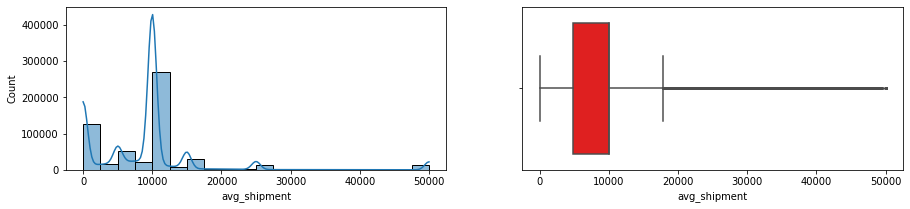

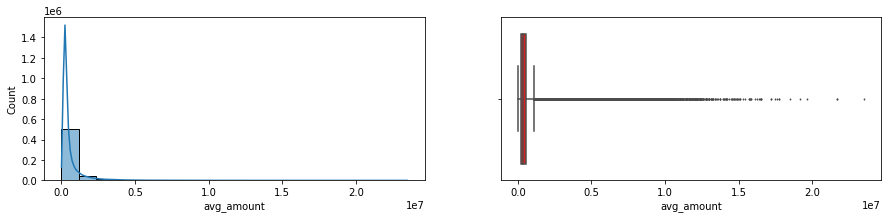

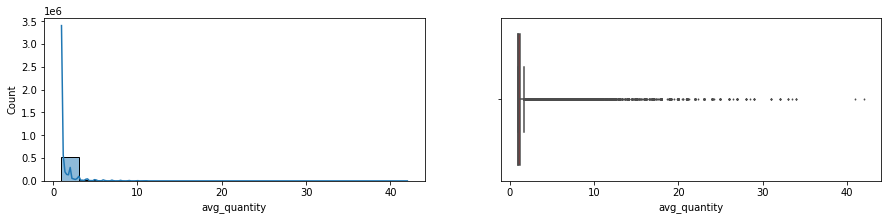

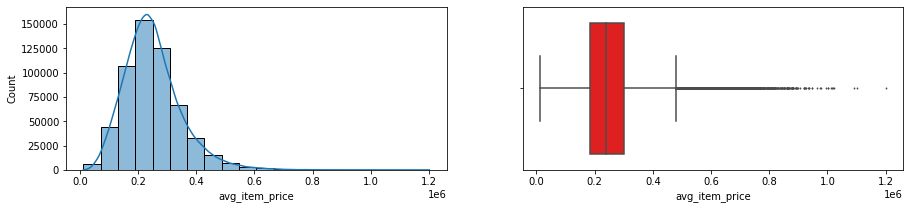

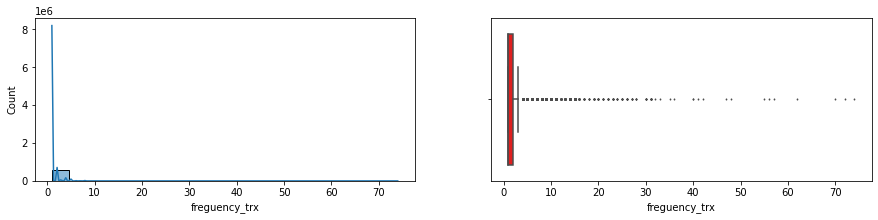

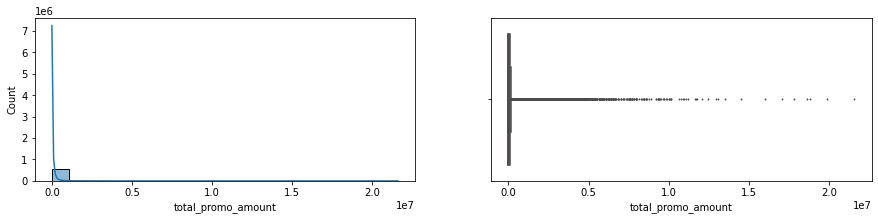

In [ ]:
# Distribusi Numerical Fitur
for i in num_col:
    fig, axs = plt.subplots(1,2,figsize=(15, 3))
    
    sns.histplot(df_agg[i], bins=20, kde=True, ax=axs[0]);
    sns.boxplot(df_agg[i], ax=axs[1], color='red', fliersize=1);

In [ ]:
# Handling Outliers
num_col_outliers = ['avg_shipment', 'avg_amount', 'avg_quantity', 'avg_item_price', 'freguency_trx', 'total_promo_amount']
for feature in num_col_outliers:
    q1 = df_agg[feature].quantile(0.25)
    q3 = df_agg[feature].quantile(0.75)
    IQR = q3 - q1
    lower_limit = q1 - (IQR*1.5)
    upper_limit = q3 + (IQR*1.5)
    df_agg.loc[df_agg[feature]<lower_limit, feature] = lower_limit
    df_agg.loc[df_agg[feature]>upper_limit, feature] = upper_limit

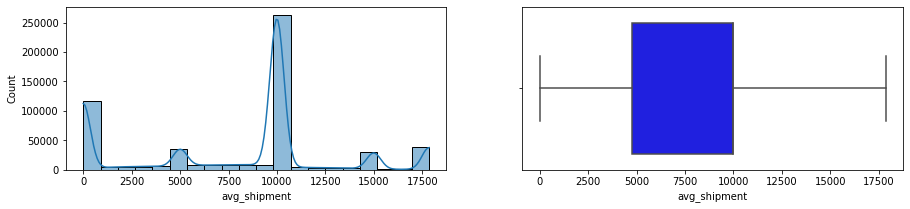

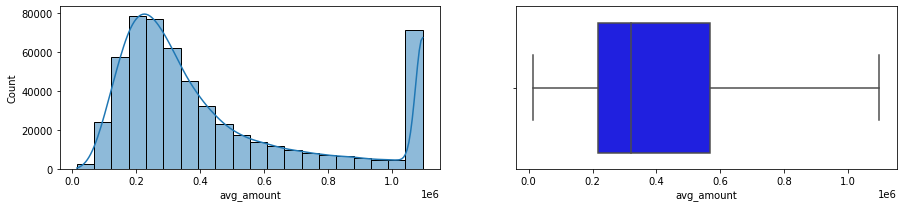

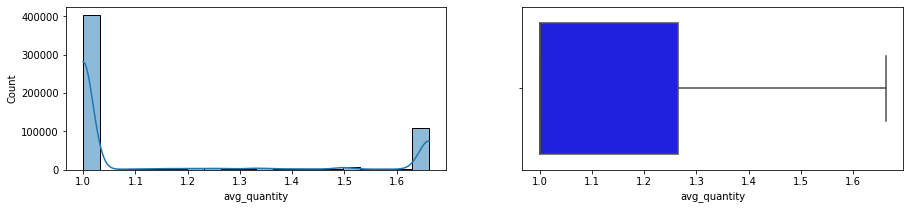

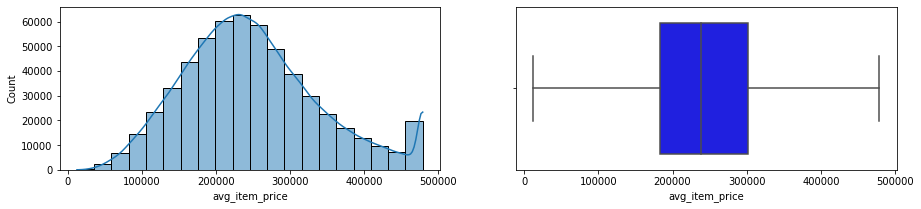

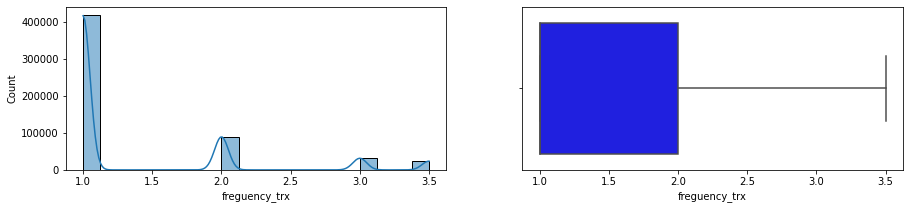

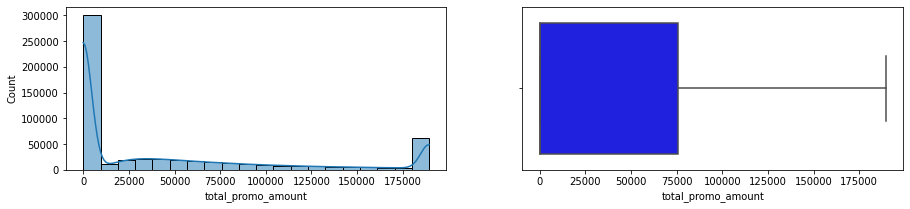

In [ ]:
num_col = ['avg_shipment', 'avg_amount', 'avg_quantity', 'avg_item_price', 'freguency_trx', 'total_promo_amount']

for i in num_col:
    fig, axs = plt.subplots(1,2,figsize=(15, 3))
    
    sns.histplot(df_agg[i], bins=20, kde=True, ax=axs[0]);
    sns.boxplot(df_agg[i], ax=axs[1], color='blue', fliersize=1);

In [ ]:
df_agg.head()

,yearmonth,customer_id,total_shipment,min_shipment,max_shipment,avg_shipment,total_amount,min_amount,max_amount,avg_amount,total_quantity,min_quantity,max_quantity,avg_quantity,min_item_price,max_item_price,avg_item_price,freguency_trx,total_unique_product,first_transaction,last_transaction,total_promo_amount,total_promo_code,avg_homepage,avg_scroll,avg_click,item_detail,avg_promo_page,avg_search,avg_add_to_cart,avg_add_promo,avg_web,avg_mobile
0,2016-06,74089,140000,10000,10000,10000.0,8971130,640795,640795,640795.0,42,3,3,3.0,210265,210265,210265.0,1,1,2016-06-30 23:18:44.792905,2016-06-30 23:18:44.792905,0,1,2.0,5.0,3.0,2.0,NaN,NaN,1.0,NaN,NaN,14.0
1,2016-07,221,0,0,0,0.0,2804616,467436,467436,467436.0,6,1,1,1.0,467436,467436,467436.0,1,1,2016-07-25 03:36:40.300322,2016-07-25 03:36:40.300322,0,1,1.0,NaN,1.0,NaN,NaN,NaN,3.0,NaN,NaN,6.0
2,2016-07,837,80000,10000,10000,10000.0,3037728,379716,379716,379716.0,16,2,2,2.0,186643,186643,186643.0,1,1,2016-07-30 09:02:56.027699,2016-07-30 09:02:56.027699,28560,1,1.0,1.0,3.0,NaN,NaN,NaN,1.0,1.0,NaN,8.0
3,2016-07,933,0,0,0,0.0,1665846,237978,237978,237978.0,7,1,1,1.0,243833,243833,243833.0,1,1,2016-07-02 14:48:55.495757,2016-07-02 14:48:55.495757,40985,1,1.0,NaN,1.0,1.0,NaN,1.0,1.0,1.0,7.0,NaN
4,2016-07,1022,0,0,0,0.0,979448,244862,244862,244862.0,4,1,1,1.0,244862,244862,244862.0,1,1,2016-07-25 00:26:59.702083,2016-07-25 00:26:59.702083,0,1,1.0,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,4.0


In [ ]:
# #2016

# month1_2016 = df_agg[df_agg['yearmonth'].isin(['2016-05','2016-06'])]
# month2_2016 = df_agg[df_agg['yearmonth'].isin(['2016-07','2016-08'])]
# month3_2016 = df_agg[df_agg['yearmonth'].isin(['2016-09','2016-10'])]
# month4_2016 = df_agg[df_agg['yearmonth'].isin(['2016-11','2016-12'])]

# #2017

# month1_2017 = df_agg[df_agg['yearmonth'].isin(['2017-01','2017-02'])]
# month2_2017 = df_agg[df_agg['yearmonth'].isin(['2017-03','2017-04'])]
# month3_2017 = df_agg[df_agg['yearmonth'].isin(['2017-05','2017-06'])]
# month4_2017 = df_agg[df_agg['yearmonth'].isin(['2017-07','2017-08'])]
# month5_2017 = df_agg[df_agg['yearmonth'].isin(['2017-09','2017-10'])]
# month6_2017 = df_agg[df_agg['yearmonth'].isin(['2017-11','2017-12'])]

# #2018

# month1_2018 = df_agg[df_agg['yearmonth'].isin(['2018-01','2018-02'])]
# month2_2018 = df_agg[df_agg['yearmonth'].isin(['2018-03','2018-04'])]
# month3_2018 = df_agg[df_agg['yearmonth'].isin(['2018-05','2018-06'])]
# month4_2018 = df_agg[df_agg['yearmonth'].isin(['2018-07','2018-08'])]
# month5_2018 = df_agg[df_agg['yearmonth'].isin(['2018-09','2018-10'])]
# month6_2018 = df_agg[df_agg['yearmonth'].isin(['2018-11','2018-12'])]

# # 2019

# month1_2019 = df_agg[df_agg['yearmonth'].isin(['2019-01','2019-02'])]
# month2_2019 = df_agg[df_agg['yearmonth'].isin(['2019-03','2019-04'])]
# month3_2019 = df_agg[df_agg['yearmonth'].isin(['2019-05','2019-06'])]
# month4_2019 = df_agg[df_agg['yearmonth'].isin(['2019-07','2019-08'])]
# month5_2019 = df_agg[df_agg['yearmonth'].isin(['2019-09','2019-10'])]
# month6_2019 = df_agg[df_agg['yearmonth'].isin(['2019-11','2019-12'])]

#2020

# month1_2020 = df_agg[df_agg['yearmonth'].isin(['2020-01','2020-02'])]
month2_2020 = df_agg[df_agg['yearmonth'].isin(['2020-03','2020-04'])]
month3_2020 = df_agg[df_agg['yearmonth'].isin(['2020-05','2020-06'])]
month4_2020 = df_agg[df_agg['yearmonth'].isin(['2020-07','2020-08'])]
month5_2020 = df_agg[df_agg['yearmonth'].isin(['2020-09','2020-10'])]
month6_2020 = df_agg[df_agg['yearmonth'].isin(['2020-11','2020-12'])]

#2021

month1_2021 = df_agg[df_agg['yearmonth'].isin(['2021-01','2021-02'])]
month2_2021 = df_agg[df_agg['yearmonth'].isin(['2021-03','2021-04'])]
month3_2021 = df_agg[df_agg['yearmonth'].isin(['2021-05','2021-06'])]
month4_2021 = df_agg[df_agg['yearmonth'].isin(['2021-07','2021-08'])]
month5_2021 = df_agg[df_agg['yearmonth'].isin(['2021-09','2021-10'])]
month6_2021 = df_agg[df_agg['yearmonth'].isin(['2021-11','2021-12'])]

#2022

month1_2022 = df_agg[df_agg['yearmonth'].isin(['2022-01','2022-02'])]
month2_2022 = df_agg[df_agg['yearmonth'].isin(['2022-03','2022-04'])]
month3_2022 = df_agg[df_agg['yearmonth'].isin(['2022-05','2022-06'])]
month4_2022 = df_agg[df_agg['yearmonth'].isin(['2022-07','2022-08'])]

In [ ]:
month2_2020.head()

,yearmonth,customer_id,total_shipment,min_shipment,max_shipment,avg_shipment,total_amount,min_amount,max_amount,avg_amount,total_quantity,min_quantity,max_quantity,avg_quantity,min_item_price,max_item_price,avg_item_price,freguency_trx,total_unique_product,first_transaction,last_transaction,total_promo_amount,total_promo_code,avg_homepage,avg_scroll,avg_click,item_detail,avg_promo_page,avg_search,avg_add_to_cart,avg_add_promo,avg_web,avg_mobile
179886,2020-03,3,20000,5000,5000,5000.0,836400,209100,209100,209100.0,4,1,1,1.000000,204100,204100,204100.000000,1,1,2020-03-08 03:11:44.844494,2020-03-08 03:11:44.844494,0,1,1.0,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,4.0
179887,2020-03,40,170000,10000,10000,10000.0,2424132,142596,142596,142596.0,17,1,1,1.000000,137079,137079,137079.000000,1,1,2020-03-29 17:55:20.804303,2020-03-29 17:55:20.804303,76211,1,1.0,3.0,3.0,2.0,1.0,4.0,1.0,1.0,NaN,17.0
179888,2020-03,41,2080000,10000,10000,10000.0,853713952,4104394,4104394,4104394.0,272,1,4,1.307692,121981,347998,250182.461538,1,13,2020-03-23 20:55:00.371538,2020-03-23 20:55:00.371538,0,1,2.0,NaN,NaN,NaN,NaN,NaN,13.0,NaN,NaN,16.0
179889,2020-03,47,120000,10000,10000,10000.0,6315888,526324,526324,526324.0,12,1,1,1.000000,141162,375162,258162.000000,1,2,2020-03-07 23:11:29.571019,2020-03-07 23:11:29.571019,0,1,1.0,1.0,NaN,NaN,NaN,1.0,2.0,NaN,NaN,6.0
179890,2020-03,71,40000,10000,10000,10000.0,2047728,511932,511932,511932.0,8,2,2,2.000000,250966,250966,250966.000000,1,1,2020-03-14 22:16:01.469630,2020-03-14 22:16:01.469630,0,1,1.0,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,4.0


In [ ]:
month3_2020.head()

,yearmonth,customer_id,total_shipment,min_shipment,max_shipment,avg_shipment,total_amount,min_amount,max_amount,avg_amount,total_quantity,min_quantity,max_quantity,avg_quantity,min_item_price,max_item_price,avg_item_price,freguency_trx,total_unique_product,first_transaction,last_transaction,total_promo_amount,total_promo_code,avg_homepage,avg_scroll,avg_click,item_detail,avg_promo_page,avg_search,avg_add_to_cart,avg_add_promo,avg_web,avg_mobile
197828,2020-05,3,0,0,0,0.0,7026216,174717,255840,234207.2,30,1,1,1.0,44731,211109,141410.133333,2,3,2020-05-03 04:51:59.844494,2020-05-31 05:45:52.844494,30328,2,3.2,1.0,2.466667,1.0,NaN,1.0,2.0,1.0,NaN,10.2
197829,2020-05,18,360000,10000,10000,10000.0,7897320,219370,219370,219370.0,36,1,1,1.0,209370,209370,209370.000000,1,1,2020-05-19 12:55:39.010289,2020-05-19 12:55:39.010289,0,1,8.0,6.0,7.000000,5.0,NaN,8.0,1.0,NaN,NaN,36.0
197830,2020-05,32,0,0,0,0.0,1634892,136241,136241,136241.0,12,1,1,1.0,136241,136241,136241.000000,1,1,2020-05-03 22:08:10.671725,2020-05-03 22:08:10.671725,0,1,1.0,1.0,NaN,4.0,NaN,NaN,5.0,NaN,NaN,12.0
197831,2020-05,57,0,0,0,0.0,1603464,267244,267244,267244.0,6,1,1,1.0,267244,267244,267244.000000,1,1,2020-05-22 13:19:36.219543,2020-05-22 13:19:36.219543,0,1,1.0,1.0,1.000000,NaN,NaN,NaN,2.0,NaN,NaN,6.0
197832,2020-05,71,50000,10000,10000,10000.0,5746350,1149270,1149270,1149270.0,25,5,5,5.0,227854,227854,227854.000000,1,1,2020-05-04 22:48:33.469630,2020-05-04 22:48:33.469630,0,1,2.0,1.0,NaN,NaN,NaN,NaN,1.0,NaN,5.0,NaN


In [ ]:
# # 2016

# #month1
# churn1_16 = month1_2016.merge(month2_2016[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn1_16.fillna(0, inplace = True)
# churn1_16['churn'] = churn1_16.apply(label, axis =1)
# churn2_16 = month2_2016.merge(month3_2016[['customer_id','yearmonth']], on='customer_id', how='outer')

# #month2
# churn2_16 = month2_2016.merge(month3_2016[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn2_16.fillna(0, inplace = True)
# churn2_16['churn'] = churn2_16.apply(label, axis =1)

# #month3
# churn3_16 = month3_2016.merge(month4_2016[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn3_16.fillna(0, inplace = True)
# churn3_16['churn'] = churn3_16.apply(label, axis =1)

# #2017

# #month1
# churn1_17 = month4_2016.merge(month1_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn1_17.fillna(0, inplace = True)
# churn1_17['churn'] = churn1_17.apply(label, axis =1)

# #month2
# churn2_17 = month1_2017.merge(month2_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn2_17.fillna(0, inplace = True)
# churn2_17['churn'] = churn2_17.apply(label, axis =1)

# #month3
# churn3_17 = month2_2017.merge(month3_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn3_17.fillna(0, inplace = True)
# churn3_17['churn'] = churn3_17.apply(label, axis =1)

# #month4
# churn4_17 = month3_2017.merge(month4_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn4_17.fillna(0, inplace = True)
# churn4_17['churn'] = churn4_17.apply(label, axis =1)

# #month5
# churn5_17 = month4_2017.merge(month5_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn5_17.fillna(0, inplace = True)
# churn5_17['churn'] = churn5_17.apply(label, axis =1)

# #month6
# churn6_17 = month5_2017.merge(month6_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn6_17.fillna(0, inplace = True)
# churn6_17['churn'] = churn6_17.apply(label, axis =1)

# # 2018

# #month1
# churn1_18 = month6_2017.merge(month1_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn1_18.fillna(0, inplace = True)
# churn1_18['churn'] = churn1_18.apply(label, axis =1)

# #month2
# churn2_18 = month1_2018.merge(month2_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn2_18.fillna(0, inplace = True)
# churn2_18['churn'] = churn2_18.apply(label, axis =1)

# #month3
# churn3_18 = month2_2018.merge(month3_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn3_18.fillna(0, inplace = True)
# churn3_18['churn'] = churn3_18.apply(label, axis =1)

# #month4
# churn4_18 = month3_2018.merge(month4_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn4_18.fillna(0, inplace = True)
# churn4_18['churn'] = churn4_18.apply(label, axis =1)

# #month5
# churn5_18 = month4_2018.merge(month5_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn5_18.fillna(0, inplace = True)
# churn5_18['churn'] = churn5_18.apply(label, axis =1)

# #month6
# churn6_18 = month5_2018.merge(month6_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn6_18.fillna(0, inplace = True)
# churn6_18['churn'] = churn6_18.apply(label, axis =1)

# # 2019

# #month1
# churn1_19 = month6_2018.merge(month1_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn1_19.fillna(0, inplace = True)
# churn1_19['churn'] = churn1_19.apply(label, axis =1)

# #month2
# churn2_19 = month1_2019.merge(month2_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn2_19.fillna(0, inplace = True)
# churn2_19['churn'] = churn2_19.apply(label, axis =1)

# #month3
# churn3_19 = month2_2019.merge(month3_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn3_19.fillna(0, inplace = True)
# churn3_19['churn'] = churn3_19.apply(label, axis =1)

# #month4
# churn4_19 = month3_2019.merge(month4_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn4_19.fillna(0, inplace = True)
# churn4_19['churn'] = churn4_19.apply(label, axis =1)

# #month5
# churn5_19 = month4_2019.merge(month5_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn5_19.fillna(0, inplace = True)
# churn5_19['churn'] = churn5_19.apply(label, axis =1)

# #month6
# churn6_19 = month5_2019.merge(month6_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn6_19.fillna(0, inplace = True)
# churn6_19['churn'] = churn6_19.apply(label, axis =1)

# 2020

#month1
# churn1_20 = month6_2019.merge(month1_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn1_20.fillna(0, inplace = True)
# churn1_20['churn'] = churn1_20.apply(label, axis =1)

#month2
# churn2_20 = month1_2020.merge(month2_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn2_20.fillna(0, inplace = True)
# churn2_20['churn'] = churn2_20.apply(label, axis =1)

#month3
churn3_20 = month2_2020.merge(month3_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
churn3_20.fillna(0, inplace = True)
churn3_20['churn'] = churn3_20.apply(label, axis =1)

#month4
churn4_20 = month3_2020.merge(month4_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
churn4_20.fillna(0, inplace = True)
churn4_20['churn'] = churn4_20.apply(label, axis =1)

#month5
churn5_20 = month4_2020.merge(month5_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
churn5_20.fillna(0, inplace = True)
churn5_20['churn'] = churn5_20.apply(label, axis =1)

#month6
churn6_20 = month5_2020.merge(month6_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
churn6_20.fillna(0, inplace = True)
churn6_20['churn'] = churn6_20.apply(label, axis =1)

# 2021

#month1
churn1_21 = month6_2020.merge(month1_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1_21.fillna(0, inplace = True)
churn1_21['churn'] = churn1_21.apply(label, axis =1)

#month2
churn2_21 = month1_2021.merge(month2_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn2_21.fillna(0, inplace = True)
churn2_21['churn'] = churn2_21.apply(label, axis =1)

#month3
churn3_21 = month2_2021.merge(month3_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn3_21.fillna(0, inplace = True)
churn3_21['churn'] = churn3_21.apply(label, axis =1)

#month4
churn4_21 = month3_2021.merge(month4_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn4_21.fillna(0, inplace = True)
churn4_21['churn'] = churn4_21.apply(label, axis =1)

#month5
churn5_21 = month4_2021.merge(month5_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn5_21.fillna(0, inplace = True)
churn5_21['churn'] = churn5_21.apply(label, axis =1)

#month6
churn6_21 = month5_2021.merge(month6_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn6_21.fillna(0, inplace = True)
churn6_21['churn'] = churn6_21.apply(label, axis =1)

# 2022

#month1
churn1_22 = month6_2021.merge(month1_2022[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1_22.fillna(0, inplace = True)
churn1_22['churn'] = churn1_22.apply(label, axis =1)

#month2
churn2_22 = month1_2022.merge(month2_2022[['customer_id','yearmonth']], on='customer_id', how='outer')
churn2_22.fillna(0, inplace = True)
churn2_22['churn'] = churn2_22.apply(label, axis =1)

#month3
churn3_22 = month2_2022.merge(month3_2022[['customer_id','yearmonth']], on='customer_id', how='outer')
churn3_22.fillna(0, inplace = True)
churn3_22['churn'] = churn3_22.apply(label, axis =1)

#month4
churn4_22 = month3_2022.merge(month4_2022[['customer_id','yearmonth']], on='customer_id', how='outer')
churn4_22.fillna(0, inplace = True)
churn4_22['churn'] = churn4_22.apply(label, axis =1)

In [ ]:
churn3_20

,yearmonth_x,customer_id,total_shipment,min_shipment,max_shipment,avg_shipment,total_amount,min_amount,max_amount,avg_amount,total_quantity,min_quantity,max_quantity,avg_quantity,min_item_price,max_item_price,avg_item_price,freguency_trx,total_unique_product,first_transaction,last_transaction,total_promo_amount,total_promo_code,avg_homepage,avg_scroll,avg_click,item_detail,avg_promo_page,avg_search,avg_add_to_cart,avg_add_promo,avg_web,avg_mobile,yearmonth_y,churn
0,2020-03,3,20000.0,5000.0,5000.0,5000.0,836400.0,209100.0,209100.0,209100.0,4.0,1.0,1.0,1.0,204100.0,204100.0,204100.0,1.0,1.0,2020-03-08 03:11:44.844494,2020-03-08 03:11:44.844494,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0,2020-05,0
1,2020-03,3,20000.0,5000.0,5000.0,5000.0,836400.0,209100.0,209100.0,209100.0,4.0,1.0,1.0,1.0,204100.0,204100.0,204100.0,1.0,1.0,2020-03-08 03:11:44.844494,2020-03-08 03:11:44.844494,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0,2020-06,0
2,2020-04,3,120000.0,10000.0,10000.0,10000.0,3282612.0,273551.0,273551.0,273551.0,12.0,1.0,1.0,1.0,266194.0,266194.0,266194.0,1.0,1.0,2020-04-05 04:20:14.844494,2020-04-05 04:20:14.844494,31716.0,1.0,1.0,3.0,2.0,0.0,0.0,1.0,3.0,1.0,0.0,12.0,2020-05,0
3,2020-04,3,120000.0,10000.0,10000.0,10000.0,3282612.0,273551.0,273551.0,273551.0,12.0,1.0,1.0,1.0,266194.0,266194.0,266194.0,1.0,1.0,2020-04-05 04:20:14.844494,2020-04-05 04:20:14.844494,31716.0,1.0,1.0,3.0,2.0,0.0,0.0,1.0,3.0,1.0,0.0,12.0,2020-06,0
4,2020-03,40,170000.0,10000.0,10000.0,10000.0,2424132.0,142596.0,142596.0,142596.0,17.0,1.0,1.0,1.0,137079.0,137079.0,137079.0,1.0,1.0,2020-03-29 17:55:20.804303,2020-03-29 17:55:20.804303,76211.0,1.0,1.0,3.0,3.0,2.0,1.0,4.0,1.0,1.0,0.0,17.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31531,0,99718,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-06,1
31532,0,99826,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-06,1
31533,0,99831,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-06,1
31534,0,99985,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2020-06,1


In [ ]:
churn3_20[churn3_20['yearmonth_x']=='2020-03']

,yearmonth_x,customer_id,total_shipment,min_shipment,max_shipment,avg_shipment,total_amount,min_amount,max_amount,avg_amount,total_quantity,min_quantity,max_quantity,avg_quantity,min_item_price,max_item_price,avg_item_price,freguency_trx,total_unique_product,first_transaction,last_transaction,total_promo_amount,total_promo_code,avg_homepage,avg_scroll,avg_click,item_detail,avg_promo_page,avg_search,avg_add_to_cart,avg_add_promo,avg_web,avg_mobile,yearmonth_y,churn
0,2020-03,3,20000.0,5000.0,5000.0,5000.0,836400.0,209100.0,209100.0,209100.0,4.0,1.0,1.0,1.000000,204100.0,204100.0,204100.000000,1.0,1.0,2020-03-08 03:11:44.844494,2020-03-08 03:11:44.844494,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0,2020-05,0
1,2020-03,3,20000.0,5000.0,5000.0,5000.0,836400.0,209100.0,209100.0,209100.0,4.0,1.0,1.0,1.000000,204100.0,204100.0,204100.000000,1.0,1.0,2020-03-08 03:11:44.844494,2020-03-08 03:11:44.844494,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0,2020-06,0
4,2020-03,40,170000.0,10000.0,10000.0,10000.0,2424132.0,142596.0,142596.0,142596.0,17.0,1.0,1.0,1.000000,137079.0,137079.0,137079.000000,1.0,1.0,2020-03-29 17:55:20.804303,2020-03-29 17:55:20.804303,76211.0,1.0,1.0,3.0,3.0,2.0,1.0,4.0,1.0,1.0,0.0,17.0,0,1
5,2020-03,41,2080000.0,10000.0,10000.0,10000.0,853713952.0,4104394.0,4104394.0,4104394.0,272.0,1.0,4.0,1.307692,121981.0,347998.0,250182.461538,1.0,13.0,2020-03-23 20:55:00.371538,2020-03-23 20:55:00.371538,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,13.0,0.0,0.0,16.0,0,1
6,2020-03,47,120000.0,10000.0,10000.0,10000.0,6315888.0,526324.0,526324.0,526324.0,12.0,1.0,1.0,1.000000,141162.0,375162.0,258162.000000,1.0,2.0,2020-03-07 23:11:29.571019,2020-03-07 23:11:29.571019,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,6.0,2020-06,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22499,2020-03,99978,0.0,0.0,0.0,0.0,632754.0,105459.0,105459.0,105459.0,6.0,1.0,1.0,1.000000,105459.0,105459.0,105459.000000,1.0,1.0,2020-03-30 07:25:34.348117,2020-03-30 07:25:34.348117,0.0,1.0,3.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,6.0,2020-06,0
22500,2020-03,99986,100000.0,10000.0,10000.0,10000.0,8342440.0,834244.0,834244.0,834244.0,60.0,6.0,6.0,6.000000,137374.0,137374.0,137374.000000,1.0,1.0,2020-03-29 02:03:10.474977,2020-03-29 02:03:10.474977,0.0,1.0,2.0,1.0,4.0,1.0,0.0,0.0,1.0,0.0,0.0,10.0,2020-06,0
22502,2020-03,99987,0.0,0.0,0.0,0.0,2228928.0,278616.0,278616.0,278616.0,8.0,1.0,1.0,1.000000,281207.0,281207.0,281207.000000,1.0,1.0,2020-03-10 17:34:41.117715,2020-03-10 17:34:41.117715,20728.0,1.0,2.0,1.0,0.0,1.0,0.0,0.0,2.0,1.0,0.0,8.0,2020-05,0
22503,2020-03,99987,0.0,0.0,0.0,0.0,2228928.0,278616.0,278616.0,278616.0,8.0,1.0,1.0,1.000000,281207.0,281207.0,281207.000000,1.0,1.0,2020-03-10 17:34:41.117715,2020-03-10 17:34:41.117715,20728.0,1.0,2.0,1.0,0.0,1.0,0.0,0.0,2.0,1.0,0.0,8.0,2020-06,0


In [ ]:
# dataset2016_2month = pd.concat([churn1_16,churn2_16,churn3_16])
# dataset2017_2month = pd.concat([churn1_17,churn2_17,churn3_17,churn4_17,churn5_17,churn6_17])
# dataset2018_2month = pd.concat([churn1_18,churn2_18,churn3_18,churn4_18,churn5_18,churn6_18])
# dataset2019_2month = pd.concat([churn1_19,churn2_19,churn3_19,churn4_19,churn5_19,churn6_19])
# dataset2020_2month = pd.concat([churn1_20,churn2_20,churn3_20,churn4_20,churn5_20,churn6_20])
# dataset2021_2month = pd.concat([churn1_21,churn2_21,churn3_21,churn4_21,churn5_21,churn6_21])
# dataset2022_2month = pd.concat([churn1_22,churn2_22,churn3_22,churn4_22])

dataset2020_2month = pd.concat([churn3_20,churn4_20,churn5_20,churn6_20])
dataset2021_2month = pd.concat([churn1_21,churn2_21,churn3_21,churn4_21,churn5_21,churn6_21])
dataset2022_2month = pd.concat([churn1_22,churn2_22,churn3_22,churn4_22])

In [ ]:
# df_final_2month = pd.concat([dataset2016_2month,dataset2017_2month,dataset2018_2month,dataset2019_2month,dataset2020_2month,dataset2021_2month,dataset2022_2month])
df_final_2month = pd.concat([dataset2020_2month,dataset2021_2month,dataset2022_2month])

In [ ]:
df_final_2month

,yearmonth_x,customer_id,total_shipment,min_shipment,max_shipment,avg_shipment,total_amount,min_amount,max_amount,avg_amount,total_quantity,min_quantity,max_quantity,avg_quantity,min_item_price,max_item_price,avg_item_price,freguency_trx,total_unique_product,first_transaction,last_transaction,total_promo_amount,total_promo_code,avg_homepage,avg_scroll,avg_click,item_detail,avg_promo_page,avg_search,avg_add_to_cart,avg_add_promo,avg_web,avg_mobile,yearmonth_y,churn
0,2020-03,3,20000.0,5000.0,5000.0,5000.0,836400.0,209100.0,209100.0,209100.0,4.0,1.0,1.0,1.0,204100.0,204100.0,204100.0,1.0,1.0,2020-03-08 03:11:44.844494,2020-03-08 03:11:44.844494,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0,2020-05,0
1,2020-03,3,20000.0,5000.0,5000.0,5000.0,836400.0,209100.0,209100.0,209100.0,4.0,1.0,1.0,1.0,204100.0,204100.0,204100.0,1.0,1.0,2020-03-08 03:11:44.844494,2020-03-08 03:11:44.844494,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0,2020-06,0
2,2020-04,3,120000.0,10000.0,10000.0,10000.0,3282612.0,273551.0,273551.0,273551.0,12.0,1.0,1.0,1.0,266194.0,266194.0,266194.0,1.0,1.0,2020-04-05 04:20:14.844494,2020-04-05 04:20:14.844494,31716.0,1.0,1.0,3.0,2.0,0.0,0.0,1.0,3.0,1.0,0.0,12.0,2020-05,0
3,2020-04,3,120000.0,10000.0,10000.0,10000.0,3282612.0,273551.0,273551.0,273551.0,12.0,1.0,1.0,1.0,266194.0,266194.0,266194.0,1.0,1.0,2020-04-05 04:20:14.844494,2020-04-05 04:20:14.844494,31716.0,1.0,1.0,3.0,2.0,0.0,0.0,1.0,3.0,1.0,0.0,12.0,2020-06,0
4,2020-03,40,170000.0,10000.0,10000.0,10000.0,2424132.0,142596.0,142596.0,142596.0,17.0,1.0,1.0,1.0,137079.0,137079.0,137079.0,1.0,1.0,2020-03-29 17:55:20.804303,2020-03-29 17:55:20.804303,76211.0,1.0,1.0,3.0,3.0,2.0,1.0,4.0,1.0,1.0,0.0,17.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34902,0,99492,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-07,1
34903,0,99678,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-07,1
34904,0,99793,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-07,1
34905,0,99868,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-07,1


### **3.3.3 Three Month or Quarter**

In [ ]:
# Get yearmonth

df_feature['yearmonth'] = df_feature['created_at'].dt.strftime('%Y-%m')

In [ ]:
# Get yearmonth and creat quarter

df_feature['quarter'] = df_feature['yearmonth'].astype('period[Q]')

In [ ]:
# Check min max of month
print(min(df_feature['yearmonth']))
print(max(df_feature['yearmonth']))

In [ ]:
# data aggregate

df_agg = df_feature.groupby(['quarter','customer_id']).agg(
                            total_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=sum),
                            min_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=min),
                            max_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=max),
                            avg_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc='mean'),

                            total_amount = pd.NamedAgg(column = 'total_amount', aggfunc=sum),
                            min_amount = pd.NamedAgg(column = 'total_amount', aggfunc=min),
                            max_amount = pd.NamedAgg(column = 'total_amount', aggfunc=max),
                            avg_amount = pd.NamedAgg(column = 'total_amount', aggfunc='mean'),

                            total_quantity = pd.NamedAgg(column = 'quantity', aggfunc=sum),
                            min_quantity = pd.NamedAgg(column = 'quantity', aggfunc=min),
                            max_quantity = pd.NamedAgg(column = 'quantity', aggfunc=max),
                            avg_quantity = pd.NamedAgg(column = 'quantity', aggfunc='mean'),

                            min_item_price = pd.NamedAgg(column = 'item_price', aggfunc=min),
                            max_item_price = pd.NamedAgg(column = 'item_price', aggfunc=max),
                            avg_item_price = pd.NamedAgg(column = 'item_price', aggfunc='mean'),
                            
                            freguency_trx = pd.NamedAgg(column = 'booking_id', aggfunc='nunique'),
                            total_unique_product = pd.NamedAgg(column = 'product_id', aggfunc='nunique'),
                            first_transaction = pd.NamedAgg(column = 'created_at', aggfunc=min),
                            last_transaction = pd.NamedAgg(column = 'created_at', aggfunc=max),
                            total_promo_amount = pd.NamedAgg(column = 'promo_amount', aggfunc=sum),
                            total_promo_code = pd.NamedAgg(column = 'promo_amount', aggfunc='nunique'),

                            avg_homepage = pd.NamedAgg(column = 'homepage', aggfunc='mean'),
                            avg_scroll = pd.NamedAgg(column = 'scroll', aggfunc='mean'),
                            avg_click = pd.NamedAgg(column = 'click', aggfunc='mean'),
                            item_detail = pd.NamedAgg(column = 'item_detail', aggfunc='mean'),
                            avg_promo_page = pd.NamedAgg(column = 'promo_page', aggfunc='mean'),
                            avg_search = pd.NamedAgg(column = 'search', aggfunc='mean'),
                            avg_add_to_cart = pd.NamedAgg(column = 'add_to_cart', aggfunc='mean'),
                            avg_add_promo = pd.NamedAgg(column = 'add_promo', aggfunc='mean'),

                            avg_web = pd.NamedAgg(column = 'web', aggfunc='mean'),
                            avg_mobile = pd.NamedAgg(column = 'mobile', aggfunc='mean')

                            ).reset_index()

In [ ]:
# Filter period

# 2016

qtr3_16 = df_agg[df_agg['quarter'] == '2016Q3']
qtr4_16 = df_agg[df_agg['quarter'] == '2016Q4']

# 2017

qtr1_17 = df_agg[df_agg['quarter'] == '2017Q1']
qtr2_17 = df_agg[df_agg['quarter'] == '2017Q2']
qtr3_17 = df_agg[df_agg['quarter'] == '2017Q3']
qtr4_17 = df_agg[df_agg['quarter'] == '2017Q4']

#2018

qtr1_18 = df_agg[df_agg['quarter'] == '2018Q1']
qtr2_18 = df_agg[df_agg['quarter'] == '2018Q2']
qtr3_18 = df_agg[df_agg['quarter'] == '2018Q3']
qtr4_18 = df_agg[df_agg['quarter'] == '2018Q4']

# 2019

qtr1_19 = df_agg[df_agg['quarter'] == '2019Q1']
qtr2_19 = df_agg[df_agg['quarter'] == '2019Q2']
qtr3_19 = df_agg[df_agg['quarter'] == '2019Q3']
qtr4_19 = df_agg[df_agg['quarter'] == '2019Q4']

# 2020

qtr1_20 = df_agg[df_agg['quarter'] == '2020Q1']
qtr2_20 = df_agg[df_agg['quarter'] == '2020Q2']
qtr3_20 = df_agg[df_agg['quarter'] == '2020Q3']
qtr4_20 = df_agg[df_agg['quarter'] == '2020Q4']

# 2021

qtr1_21 = df_agg[df_agg['quarter'] == '2021Q1']
qtr2_21 = df_agg[df_agg['quarter'] == '2021Q2']
qtr3_21 = df_agg[df_agg['quarter'] == '2021Q3']
qtr4_21 = df_agg[df_agg['quarter'] == '2021Q4']

# 2022

qtr1_22 = df_agg[df_agg['quarter'] == '2022Q1']
qtr2_22 = df_agg[df_agg['quarter'] == '2022Q2']
qtr3_22 = df_agg[df_agg['quarter'] == '2022Q3']

In [ ]:
# 2016

# quarter3_2016
qchurn1_16 = qtr3_16.merge(qtr4_16[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn1_16.fillna(0, inplace = True)

# get churn label
qchurn1_16['churn'] = qchurn1_16.apply(qlabel, axis = 1)

# 2017

# quarter1_2017 
qchurn1_17 = qtr4_16.merge(qtr1_17[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn1_17.fillna(0, inplace = True)
qchurn1_17['churn'] = qchurn1_17.apply(qlabel, axis = 1)     # get churn label

# quarter2_2017 
qchurn2_17 = qtr1_17.merge(qtr2_17[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn2_17.fillna(0, inplace = True)
qchurn2_17['churn'] = qchurn2_17.apply(qlabel, axis = 1)     # get churn label

# quarter3_2017 
qchurn3_17 = qtr2_17.merge(qtr3_17[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn3_17.fillna(0, inplace = True)
qchurn3_17['churn'] = qchurn3_17.apply(qlabel, axis = 1)     # get churn label

# quarter4_2017 
qchurn4_17 = qtr3_17.merge(qtr4_17[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn4_17.fillna(0, inplace = True)
qchurn4_17['churn'] = qchurn4_17.apply(qlabel, axis = 1)     # get churn label

# 2018

# quarter1_2018 
qchurn1_18 = qtr4_17.merge(qtr1_18[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn1_18.fillna(0, inplace = True)
qchurn1_18['churn'] = qchurn1_18.apply(qlabel, axis = 1)     # get churn label

# quarter2_2018 
qchurn2_18 = qtr1_18.merge(qtr2_18[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn2_18.fillna(0, inplace = True)
qchurn2_18['churn'] = qchurn2_18.apply(qlabel, axis = 1)     # get churn label

# quarter3_2018 
qchurn3_18 = qtr2_18.merge(qtr3_18[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn3_18.fillna(0, inplace = True)
qchurn3_18['churn'] = qchurn3_18.apply(qlabel, axis = 1)     # get churn label

# quarter4_2018 
qchurn4_18 = qtr3_18.merge(qtr4_18[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn4_18.fillna(0, inplace = True)
qchurn4_18['churn'] = qchurn4_18.apply(qlabel, axis = 1)     # get churn label

# 2019

# quarter1_2019 
qchurn1_19 = qtr4_18.merge(qtr1_19[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn1_19.fillna(0, inplace = True)
qchurn1_19['churn'] = qchurn1_19.apply(qlabel, axis = 1)     # get churn qlabel

# quarter2_2019 
qchurn2_19 = qtr1_19.merge(qtr2_19[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn2_19.fillna(0, inplace = True)
qchurn2_19['churn'] = qchurn2_19.apply(qlabel, axis = 1)     # get churn qlabel

# quarter3_2019 
qchurn3_19 = qtr2_19.merge(qtr3_19[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn3_19.fillna(0, inplace = True)
qchurn3_19['churn'] = qchurn3_19.apply(qlabel, axis = 1)     # get churn qlabel

# quarter4_2019 
qchurn4_19 = qtr3_19.merge(qtr4_19[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn4_19.fillna(0, inplace = True)
qchurn4_19['churn'] = qchurn4_19.apply(qlabel, axis = 1)     # get churn qlabel

# 2020

# quarter1_2020
qchurn1_20 = qtr4_19.merge(qtr1_20[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn1_20.fillna(0, inplace = True)
qchurn1_20['churn'] = qchurn1_20.apply(qlabel, axis = 1)     # get churn qlabel

# quarter2_2020 
qchurn2_20 = qtr1_20.merge(qtr2_20[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn2_20.fillna(0, inplace = True)
qchurn2_20['churn'] = qchurn2_20.apply(qlabel, axis = 1)     # get churn qlabel

# quarter3_2020 
qchurn3_20 = qtr2_20.merge(qtr3_20[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn3_20.fillna(0, inplace = True)
qchurn3_20['churn'] = qchurn3_20.apply(qlabel, axis = 1)     # get churn qlabel

# quarter4_2020 
qchurn4_20 = qtr3_20.merge(qtr4_20[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn4_20.fillna(0, inplace = True)
qchurn4_20['churn'] = qchurn4_20.apply(qlabel, axis = 1)     # get churn label

# 2021

# quarter1_2021 
qchurn1_21 = qtr4_20.merge(qtr1_21[['customer_id', 'quarter']], on='customer_id', how='outer')q
qchurn1_21.fillna(0, inplace = True)
qchurn1_21['churn'] = qchurn1_21.apply(label, axis = 1)     # get churn label

# quarter2_2021 
qchurn2_21 = qtr1_21.merge(qtr2_21[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn2_21.fillna(0, inplace = True)
qchurn2_21['churn'] = qchurn2_21.apply(label, axis = 1)     # get churn label

# quarter3_2021 
qchurn3_21 = qtr2_21.merge(qtr3_21[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn3_21.fillna(0, inplace = True)
qchurn3_21['churn'] = qchurn3_21.apply(label, axis = 1)     # get churn label

# quarter4_2021 
qchurn4_21 = qtr3_21.merge(qtr4_21[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn4_21.fillna(0, inplace = True)
qchurn4_21['churn'] = qchurn4_21.apply(label, axis = 1)     # get churn label

# 2022

# quarter1_2022
qchurn1_22 = qtr4_21.merge(qtr1_22[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn1_22.fillna(0, inplace = True)
qchurn1_22['churn'] = qchurn1_22.apply(label, axis = 1)     # get churn label

# quarter2_2022 
qchurn2_22 = qtr1_22.merge(qtr2_22[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn2_22.fillna(0, inplace = True)
qchurn2_22['churn'] = qchurn2_22.apply(label, axis = 1)     # get churn label

# quarter3_2022 
qchurn3_22 = qtr2_22.merge(qtr3_22[['customer_id', 'quarter']], on='customer_id', how='outer')
qchurn3_22.fillna(0, inplace = True)
qchurn3_22['churn'] = qchurn3_22.apply(label, axis = 1)     # get churn label

In [ ]:
# combine data

dataset2016_quarter = qchurn1_16
dataset2017_quarter = pd.concat([qchurn1_17,qchurn2_17,qchurn3_17,qchurn4_17])
dataset2018_quarter = pd.concat([qchurn1_18,qchurn2_18,qchurn3_18,qchurn4_18])
dataset2019_quarter = pd.concat([qchurn1_19,qchurn2_19,qchurn3_19,qchurn4_19])
dataset2020_quarter = pd.concat([qchurn1_20,qchurn2_20,qchurn3_20,qchurn4_20])
dataset2021_quarter = pd.concat([qchurn1_21,qchurn2_21,qchurn3_21,qchurn4_21])
dataset2022_quarter = pd.concat([qchurn1_22,qchurn2_22,qchurn3_22])

In [ ]:
# combine all data

df_final_quarter = pd.concat([dataset2016_quarter,dataset2017_quarter,dataset2018_quarter,dataset2019_quarter,dataset2020_quarter,dataset2021_quarter,dataset2022_quarter])

### **3.3.4 Six Month or Semester**

In [ ]:
# get yearmonth and create semester

df_feature['semester']  = df_feature['created_at'].dt.year.astype(str) + 'S'+ np.where(df_feature['created_at'].dt.quarter.gt(2),2,1).astype(str)

In [ ]:
# Check min max of month

print(min(df_feature['yearmonth']))
print(max(df_feature['yearmonth']))

In [ ]:
# data aggregate

df_agg = df_feature.groupby(['semester','customer_id']).agg(
                            total_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=sum),
                            min_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=min),
                            max_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=max),
                            avg_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc='mean'),

                            total_amount = pd.NamedAgg(column = 'total_amount', aggfunc=sum),
                            min_amount = pd.NamedAgg(column = 'total_amount', aggfunc=min),
                            max_amount = pd.NamedAgg(column = 'total_amount', aggfunc=max),
                            avg_amount = pd.NamedAgg(column = 'total_amount', aggfunc='mean'),

                            total_quantity = pd.NamedAgg(column = 'quantity', aggfunc=sum),
                            min_quantity = pd.NamedAgg(column = 'quantity', aggfunc=min),
                            max_quantity = pd.NamedAgg(column = 'quantity', aggfunc=max),
                            avg_quantity = pd.NamedAgg(column = 'quantity', aggfunc='mean'),

                            min_item_price = pd.NamedAgg(column = 'item_price', aggfunc=min),
                            max_item_price = pd.NamedAgg(column = 'item_price', aggfunc=max),
                            avg_item_price = pd.NamedAgg(column = 'item_price', aggfunc='mean'),
                            
                            freguency_trx = pd.NamedAgg(column = 'booking_id', aggfunc='nunique'),
                            total_unique_product = pd.NamedAgg(column = 'product_id', aggfunc='nunique'),
                            first_transaction = pd.NamedAgg(column = 'created_at', aggfunc=min),
                            last_transaction = pd.NamedAgg(column = 'created_at', aggfunc=max),
                            total_promo_amount = pd.NamedAgg(column = 'promo_amount', aggfunc=sum),
                            total_promo_code = pd.NamedAgg(column = 'promo_amount', aggfunc='nunique'),

                            avg_homepage = pd.NamedAgg(column = 'homepage', aggfunc='mean'),
                            avg_scroll = pd.NamedAgg(column = 'scroll', aggfunc='mean'),
                            avg_click = pd.NamedAgg(column = 'click', aggfunc='mean'),
                            item_detail = pd.NamedAgg(column = 'item_detail', aggfunc='mean'),
                            avg_promo_page = pd.NamedAgg(column = 'promo_page', aggfunc='mean'),
                            avg_search = pd.NamedAgg(column = 'search', aggfunc='mean'),
                            avg_add_to_cart = pd.NamedAgg(column = 'add_to_cart', aggfunc='mean'),
                            avg_add_promo = pd.NamedAgg(column = 'add_promo', aggfunc='mean'),

                            avg_web = pd.NamedAgg(column = 'web', aggfunc='mean'),
                            avg_mobile = pd.NamedAgg(column = 'mobile', aggfunc='mean')

                            ).reset_index()

In [ ]:
# Filter period

# 2016

smt1_16 = df_agg[df_agg['semester'] == '2016S1']
smt2_16 = df_agg[df_agg['semester'] == '2016S2']

# 2017

smt1_17 = df_agg[df_agg['semester'] == '2017S1']
smt2_17 = df_agg[df_agg['semester'] == '2017S2']

# 2018

smt1_18 = df_agg[df_agg['semester'] == '2018S1']
smt2_18 = df_agg[df_agg['semester'] == '2018S2']

# 2019

smt1_19 = df_agg[df_agg['semester'] == '2019S1']
smt2_19 = df_agg[df_agg['semester'] == '2019S2']

# 2020

smt1_20 = df_agg[df_agg['semester'] == '2020S1']
smt2_20 = df_agg[df_agg['semester'] == '2020S2']

# 2021

smt1_21 = df_agg[df_agg['semester'] == '2021S1']
smt2_21 = df_agg[df_agg['semester'] == '2021S2']

# 2022

smt1_22 = df_agg[df_agg['semester'] == '2022S1']
smt2_22 = df_agg[df_agg['semester'] == '2022S2']

In [ ]:
# 2016

# semester2_2016
schurn1_16 = smt1_16.merge(smt2_16[['customer_id', 'semester']], on='customer_id', how='outer')
schurn1_16.fillna(0, inplace = True)

# get churn slabel
schurn1_16['churn'] = schurn1_16.apply(slabel, axis = 1)

# 2017

# semester1_2017 
schurn1_17 = smt2_16.merge(smt1_17[['customer_id', 'semester']], on='customer_id', how='outer')
schurn1_17.fillna(0, inplace = True)
schurn1_17['churn'] = schurn1_17.apply(slabel, axis = 1)

# semester2_2017 
schurn2_17 = smt1_17.merge(smt2_17[['customer_id', 'semester']], on='customer_id', how='outer')
schurn2_17.fillna(0, inplace = True)
schurn2_17['churn'] = schurn2_17.apply(slabel, axis = 1)

# 2018

# semester1_2018 
schurn1_18 = smt2_17.merge(smt1_18[['customer_id', 'semester']], on='customer_id', how='outer')
schurn1_18.fillna(0, inplace = True)
schurn1_18['churn'] = schurn1_18.apply(slabel, axis = 1)

# semester2_2018 
schurn2_18 = smt1_18.merge(smt2_18[['customer_id', 'semester']], on='customer_id', how='outer')
schurn2_18.fillna(0, inplace = True)
schurn2_18['churn'] = schurn2_18.apply(slabel, axis = 1)

# 2019

# semester1_2019 
schurn1_19 = smt2_18.merge(smt1_19[['customer_id', 'semester']], on='customer_id', how='outer')
schurn1_19.fillna(0, inplace = True)
schurn1_19['churn'] = schurn1_19.apply(slabel, axis = 1)

# semester2_2019 
schurn2_19 = smt1_19.merge(smt2_19[['customer_id', 'semester']], on='customer_id', how='outer')
schurn2_19.fillna(0, inplace = True)
schurn2_19['churn'] = schurn2_19.apply(slabel, axis = 1)

# 2020

# semester1_2020
schurn1_20 = smt2_19.merge(smt1_20[['customer_id', 'semester']], on='customer_id', how='outer')
schurn1_20.fillna(0, inplace = True)
schurn1_20['churn'] = schurn1_20.apply(slabel, axis = 1)

# semester2_2020
schurn2_20 = smt1_20.merge(smt2_20[['customer_id', 'semester']], on='customer_id', how='outer')
schurn2_20.fillna(0, inplace = True)
schurn2_20['churn'] = schurn2_20.apply(slabel, axis = 1)

# 2021

# semester1_2021
schurn1_21 = smt2_20.merge(smt1_21[['customer_id', 'semester']], on='customer_id', how='outer')
schurn1_21.fillna(0, inplace = True)
schurn1_21['churn'] = schurn1_21.apply(slabel, axis = 1)

# semester2_2021
schurn2_21 = smt1_21.merge(smt2_21[['customer_id', 'semester']], on='customer_id', how='outer')
schurn2_21.fillna(0, inplace = True)
schurn2_21['churn'] = schurn2_21.apply(slabel, axis = 1)

# 2022

# semester1_2022
schurn1_22 = smt2_21.merge(smt1_22[['customer_id', 'semester']], on='customer_id', how='outer')
schurn1_22.fillna(0, inplace = True)
schurn1_22['churn'] = schurn1_22.apply(slabel, axis = 1)

# semester2_2022
schurn2_22 = smt1_22.merge(smt2_22[['customer_id', 'semester']], on='customer_id', how='outer')
schurn2_22.fillna(0, inplace = True)
schurn2_22['churn'] = schurn2_22.apply(slabel, axis = 1)

In [ ]:
# combine data

dataset2016_semester = churn1_16
dataset2017_semester = pd.concat([schurn1_17,schurn2_17]).reset_index()
dataset2017_semester = dataset2017_semester.drop(['index'], axis=1)
dataset2018_semester = pd.concat([schurn1_18,schurn2_18]).reset_index()
dataset2018_semester = dataset2018_semester.drop(['index'], axis=1)
dataset2019_semester = pd.concat([schurn1_19,schurn2_19]).reset_index()
dataset2019_semester = dataset2019_semester.drop(['index'], axis=1)
dataset2020_semester = pd.concat([schurn1_20,schurn2_20]).reset_index()
dataset2020_semester = dataset2020_semester.drop(['index'], axis=1)
dataset2021_semester = pd.concat([schurn1_21,schurn2_21]).reset_index()
dataset2021_semester = dataset2021_semester.drop(['index'], axis=1)
dataset2022_semester = pd.concat([schurn1_22,schurn2_22]).reset_index()
dataset2022_semester = dataset2022_semester.drop(['index'], axis=1)

In [ ]:
# combine all data

df_final_semester = pd.concat([dataset2016_semester,dataset2017_semester,dataset2018_semester,dataset2019_semester,dataset2020_semester,dataset2021_semester,dataset2022_semester])

## **3.3 Data Cleaning**

In [ ]:
data_final = df_final_2month.copy()

In [ ]:
data_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 642402 entries, 0 to 34906
Data columns (total 19 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   yearmonth             642402 non-null  datetime64[ns]
 1   customer_id           642402 non-null  int64         
 2   avg_shipment          642402 non-null  float64       
 3   avg_amount            642402 non-null  float64       
 4   total_quantity        642402 non-null  float64       
 5   avg_quantity          642402 non-null  float64       
 6   avg_item_price        642402 non-null  float64       
 7   freguency_trx         642402 non-null  float64       
 8   total_unique_product  642402 non-null  float64       
 9   total_promo_amount    642402 non-null  float64       
 10  avg_homepage          642402 non-null  float64       
 11  avg_scroll            642402 non-null  float64       
 12  avg_click             642402 non-null  float64       
 13  

In [ ]:
data_final.rename(columns={'yearmonth_x': 'yearmonth'}, inplace=True)

In [ ]:
data_final.drop(['yearmonth_y'], axis=1, inplace=True)

In [ ]:
data_final.drop(['last_transaction', 'total_shipment', 'min_shipment', 'min_quantity', 'max_quantity', 'last_transaction', 'avg_web','avg_mobile', 'total_amount', 'total_promo_code', 'yearmonth_y','max_shipment', 'min_amount', 'max_amount', 'min_item_price', 'max_item_price', 'first_transaction'], axis=1, inplace=True)

In [ ]:
# Checking null value

data_final.isna().sum()

yearmonth_x             0
customer_id             0
total_shipment          0
min_shipment            0
max_shipment            0
avg_shipment            0
total_amount            0
min_amount              0
max_amount              0
avg_amount              0
total_quantity          0
min_quantity            0
max_quantity            0
avg_quantity            0
min_item_price          0
max_item_price          0
avg_item_price          0
freguency_trx           0
total_unique_product    0
first_transaction       0
last_transaction        0
total_promo_amount      0
total_promo_code        0
avg_homepage            0
avg_scroll              0
avg_click               0
item_detail             0
avg_promo_page          0
avg_search              0
avg_add_to_cart         0
avg_add_promo           0
avg_web                 0
avg_mobile              0
yearmonth_y             0
churn                   0
dtype: int64

In [ ]:
data_final.drop(data_final[data_final['yearmonth'] == '1970-01-01'].index, inplace=True)

In [ ]:
data_final['yearmonth'] = data_final['yearmonth'].astype('datetime64')

In [ ]:
data_final.shape

(642402, 30)

In [ ]:
# Split Data

df_final1 = df_feature.iloc[:100000,:]
df_final2 = df_feature.iloc[100000:200000,:]
df_final3 = df_feature.iloc[200000:300000,:]
df_final4 = df_feature.iloc[300000:400000,:]
df_final5 = df_feature.iloc[400000:500000,:]
df_final6 = df_feature.iloc[500000:500000,:]
df_final7 = df_feature.iloc[600000:700000,:]
df_final8 = df_feature.iloc[700000:800000,:]
df_final9 = df_feature.iloc[800000:900000,:]
df_final10 = df_feature.iloc[900000:,:]

In [ ]:
#save excel  to gdrive

df_final1.to_csv('gdrive/My Drive/Mockup Dataset/df_final1.csv', index=False)
df_final2.to_csv('gdrive/My Drive/Mockup Dataset/df_final2.csv', index=False)
df_final3.to_csv('gdrive/My Drive/Mockup Dataset/df_final3.csv', index=False)
df_final4.to_csv('gdrive/My Drive/Mockup Dataset/df_final4.csv', index=False)
df_final5.to_csv('gdrive/My Drive/Mockup Dataset/df_final5.csv', index=False)
df_final6.to_csv('gdrive/My Drive/Mockup Dataset/df_final6.csv', index=False)
df_final7.to_csv('gdrive/My Drive/Mockup Dataset/df_final7csv', index=False)
df_final8.to_csv('gdrive/My Drive/Mockup Dataset/df_final8.csv', index=False)
df_final9.to_csv('gdrive/My Drive/Mockup Dataset/df_final9.csv', index=False)
df_final10.to_csv('gdrive/My Drive/Mockup Dataset/df_final10.csv', index=False)

In [ ]:
data_final.to_csv("data_final.csv", index=False)

In [ ]:
files.download("data_final.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
data_final.head()

,yearmonth,customer_id,total_shipment,min_shipment,max_shipment,avg_shipment,total_amount,min_amount,max_amount,avg_amount,total_quantity,min_quantity,max_quantity,avg_quantity,min_item_price,max_item_price,avg_item_price,freguency_trx,total_unique_product,first_transaction,last_transaction,total_promo_amount,total_promo_code,avg_homepage,avg_scroll,avg_click,item_detail,avg_promo_page,avg_search,avg_add_to_cart,avg_add_promo,avg_web,avg_mobile,churn
0,2020-03-01,3,20000.0,5000.0,5000.0,5000.0,836400.0,209100.0,209100.0,209100.0,4.0,1.0,1.0,1.0,204100.0,204100.0,204100.0,1.0,1.0,2020-03-08 03:11:44.844494,2020-03-08 03:11:44.844494,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0,0
1,2020-03-01,3,20000.0,5000.0,5000.0,5000.0,836400.0,209100.0,209100.0,209100.0,4.0,1.0,1.0,1.0,204100.0,204100.0,204100.0,1.0,1.0,2020-03-08 03:11:44.844494,2020-03-08 03:11:44.844494,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0,0
2,2020-04-01,3,120000.0,10000.0,10000.0,10000.0,3282612.0,273551.0,273551.0,273551.0,12.0,1.0,1.0,1.0,266194.0,266194.0,266194.0,1.0,1.0,2020-04-05 04:20:14.844494,2020-04-05 04:20:14.844494,31716.0,1.0,1.0,3.0,2.0,0.0,0.0,1.0,3.0,1.0,0.0,12.0,0
3,2020-04-01,3,120000.0,10000.0,10000.0,10000.0,3282612.0,273551.0,273551.0,273551.0,12.0,1.0,1.0,1.0,266194.0,266194.0,266194.0,1.0,1.0,2020-04-05 04:20:14.844494,2020-04-05 04:20:14.844494,31716.0,1.0,1.0,3.0,2.0,0.0,0.0,1.0,3.0,1.0,0.0,12.0,0
4,2020-03-01,40,170000.0,10000.0,10000.0,10000.0,2424132.0,142596.0,142596.0,142596.0,17.0,1.0,1.0,1.0,137079.0,137079.0,137079.0,1.0,1.0,2020-03-29 17:55:20.804303,2020-03-29 17:55:20.804303,76211.0,1.0,1.0,3.0,3.0,2.0,1.0,4.0,1.0,1.0,0.0,17.0,1


## **3.4 Data Visualization**

In [ ]:
# Read Dataset

df_master_2month = pd.read_csv('gdrive/My Drive/Mockup Dataset/df_master_2month.csv')

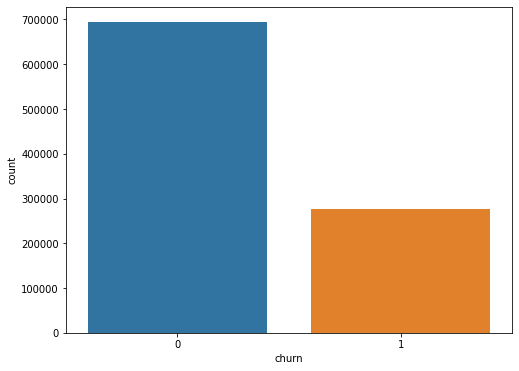

In [ ]:
# churn comparison
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(8,6))
sns.countplot(df_master_2month['churn'])

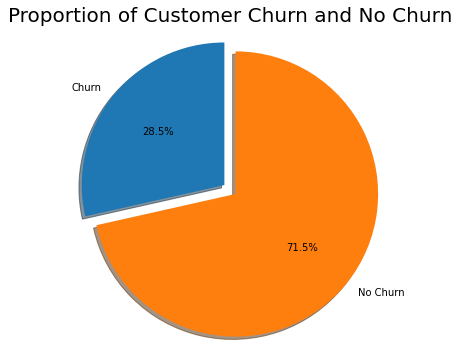

In [ ]:
labels = 'Churn', 'No Churn'
sizes = [df_master_2month.churn[df_master_2month['churn']==1].count(), 
         df_master_2month.churn[df_master_2month['churn']==0].count()]
explode = (0, 0.1)
fig1, ax1 = plt.subplots(figsize=(8, 6))
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')
plt.title("Proportion of Customer Churn and No Churn", size = 20)
plt.show()

In [ ]:
df_churn1 = df_master_2month[df_master_2month['churn']==1]

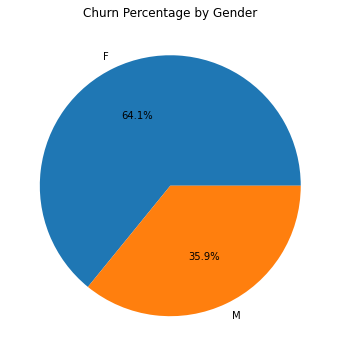

In [ ]:
plt.figure(figsize=(8,6))
plt.pie(df_churn1['gender'].value_counts(),
        autopct="%1.1f%%",
        labels=df_churn1['gender'].value_counts().index)
plt.title("Churn Percentage by Gender")
plt.show()

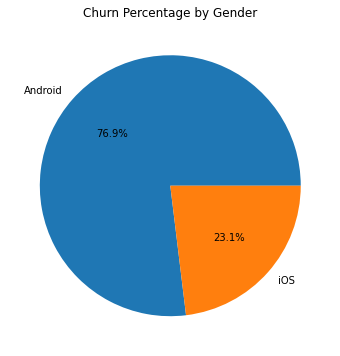

In [ ]:
plt.figure(figsize=(8,6))
plt.pie(df_churn1['device_type'].value_counts(),
        autopct="%1.1f%%",
        labels=df_churn1['device_type'].value_counts().index)
plt.title("Churn Percentage by Gender")
plt.show()

Text(0.5, 1.0, 'Most Churn by Province')

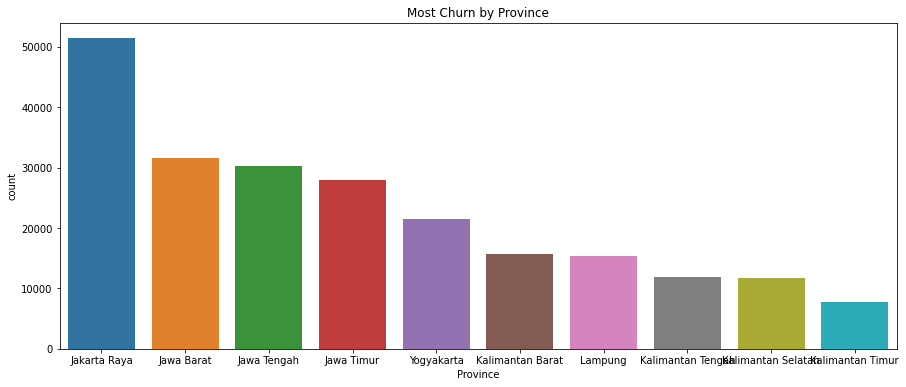

In [ ]:
plt.figure(figsize=(15,6))
sns.countplot(df_churn1['home_location'], 
              data = df_churn1['churn'],
              order = df_churn1['home_location'].value_counts()[:10].index)
plt.xlabel("Province")
plt.title('Most Churn by Province')

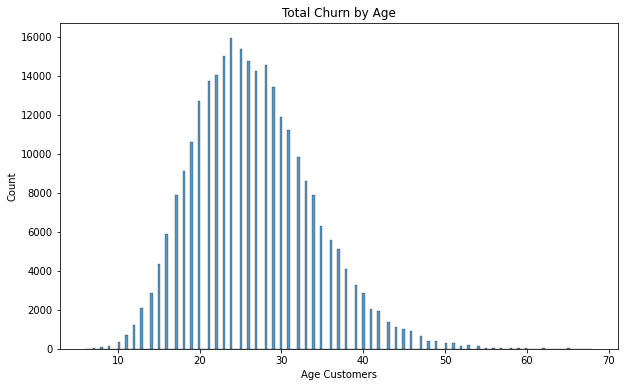

In [ ]:
plt.figure(figsize=(10,6))
sns.histplot(df_churn1['age'])
plt.xlabel("Age Customers")
plt.title('Total Churn by Age')
plt.show()

## **3.5 Imbalance**

Pada kolom churn menunjukkan bahwa terdapat data yang imbalance, maka perlu dilakukan teknik penyeimbang dataset, sebagai berikut :

- SMOTE
- Bordeline SMOTE
- ADASYN

Parameter Decision Tree akan diatur menjadi 8 neighbors untuk setiap teknik.

Smote

In [ ]:
smote = SMOTE(k_neighbors=8)

In [ ]:
X_train_smote, y_train_smote, = smote.fit_resample(X_train.astype('float'), y_train)

In [ ]:
print('Before SMOTE : ', Counter(y_train))
print('After SMOTE : ', Counter(y_train_smote))

Before SMOTE :  Counter({0: 377875, 1: 136046})
After SMOTE :  Counter({0: 377875, 1: 377875})


Borderline Smote

In [ ]:
b_smote = BorderlineSMOTE(k_neighbors=8)

In [ ]:
x_train_bsmote, y_train_bsmote = b_smote.fit_resample(X_train.astype('float'), y_train)

In [ ]:
print('Before BSMOTE : ', Counter(y_train))
print('After BSMOTE : ', Counter(y_train_bsmote))

Before BSMOTE :  Counter({0: 377875, 1: 136046})
After BSMOTE :  Counter({0: 377875, 1: 377875})


ADASYN

In [ ]:
ada = ADASYN(n_neighbors=8)

In [ ]:
x_train_ada, y_train_ada = ada.fit_resample(X_train.astype('float'), y_train)

In [ ]:
print('Before ADASYN : ', Counter(y_train))
print('After ADASYN : ', Counter(y_train_ada))

Before ADASYN :  Counter({0: 377875, 1: 136046})
After ADASYN :  Counter({0: 377875, 1: 374283})


Modeling

In [ ]:
model_unbalanced = RandomForestClassifier(max_depth=150, random_state=42)
model_smote = RandomForestClassifier(max_depth=150, random_state=42)

In [ ]:
model_bsmote = RandomForestClassifier(max_depth=150, random_state=42)

In [ ]:
model_ada = RandomForestClassifier(max_depth=150, random_state=42)

In [ ]:
model_unbalanced.fit(X_train, y_train)
model_smote.fit(X_train_smote, y_train_smote)

RandomForestClassifier(max_depth=150, random_state=42)

In [ ]:
model_bsmote.fit(x_train_bsmote, y_train_bsmote)

RandomForestClassifier(max_depth=150, random_state=42)

In [ ]:
model_ada.fit(x_train_ada, y_train_ada)

RandomForestClassifier(max_depth=150, random_state=42)

In [ ]:
y_unbalanced_pred = model_unbalanced.predict(X_test)
y_smote_pred = model_smote.predict(X_test)

In [ ]:
y_bsmote_pred = model_bsmote.predict(X_test)

In [ ]:
y_ada_pred = model_ada.predict(X_test)

In [ ]:
 # menggunakan y_test untuk mendapatkan hasil
print(classification_report(y_test, y_unbalanced_pred))
print("Accuracy of the Model:",accuracy_score(y_test, y_unbalanced_pred)*100,"%")

              precision    recall  f1-score   support

           0       0.86      0.97      0.92     94407
           1       0.89      0.57      0.70     34074

    accuracy                           0.87    128481
   macro avg       0.88      0.77      0.81    128481
weighted avg       0.87      0.87      0.86    128481

Accuracy of the Model: 86.76769327760525 %


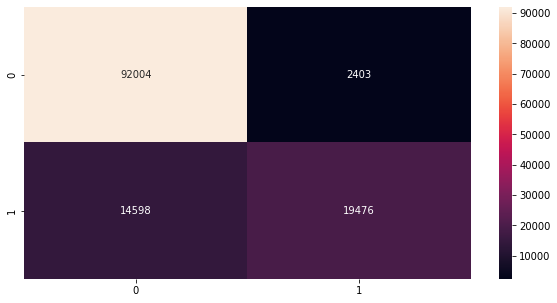

In [ ]:
plt.figure(figsize = (10,5))
cm1 = confusion_matrix(y_test, y_unbalanced_pred)
sns.heatmap(cm1, annot=True, fmt = 'g')

In [ ]:
 # menggunakan y_test untuk mendapatkan hasil
print(classification_report(y_test, y_smote_pred))
print("Accuracy of the Model:",accuracy_score(y_test, y_smote_pred)*100,"%")

              precision    recall  f1-score   support

           0       0.87      0.96      0.91     94407
           1       0.86      0.60      0.70     34074

    accuracy                           0.87    128481
   macro avg       0.86      0.78      0.81    128481
weighted avg       0.87      0.87      0.86    128481

Accuracy of the Model: 86.6665110016267 %


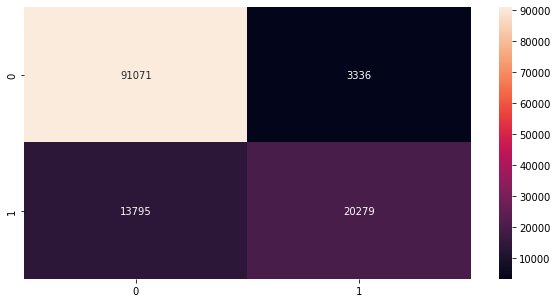

In [ ]:
plt.figure(figsize = (10,5))
cm2 = confusion_matrix(y_test, y_smote_pred)
sns.heatmap(cm2, annot=True, fmt = 'g')

In [ ]:
 # menggunakan y_test untuk mendapatkan hasil
print(classification_report(y_test, y_bsmote_pred))
print("Accuracy of the Model:",accuracy_score(y_test, y_bsmote_pred)*100,"%")

              precision    recall  f1-score   support

           0       0.87      0.96      0.91     94407
           1       0.85      0.60      0.71     34074

    accuracy                           0.87    128481
   macro avg       0.86      0.78      0.81    128481
weighted avg       0.86      0.87      0.86    128481

Accuracy of the Model: 86.62448144083561 %


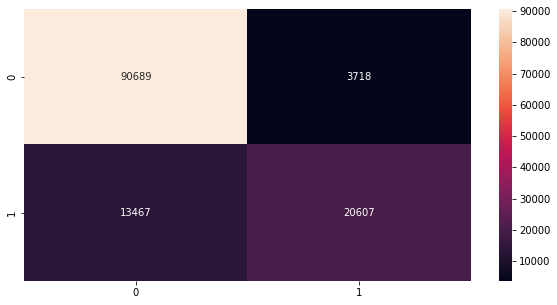

In [ ]:
plt.figure(figsize = (10,5))
cm3 = confusion_matrix(y_test, y_bsmote_pred)
sns.heatmap(cm3, annot=True, fmt = 'g')

In [ ]:
 # menggunakan y_test untuk mendapatkan hasil
print(classification_report(y_test, y_ada_pred))
print("Accuracy of the Model:",accuracy_score(y_test, y_ada_pred)*100,"%")

              precision    recall  f1-score   support

           0       0.87      0.96      0.91     94407
           1       0.85      0.60      0.71     34074

    accuracy                           0.87    128481
   macro avg       0.86      0.78      0.81    128481
weighted avg       0.86      0.87      0.86    128481

Accuracy of the Model: 86.64393957083149 %


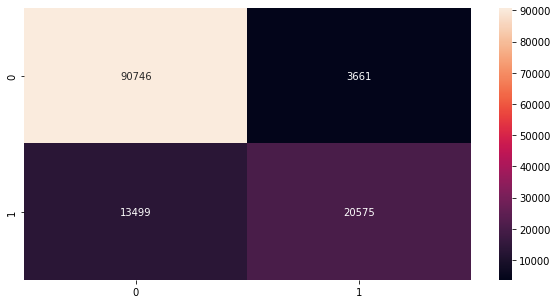

In [ ]:
plt.figure(figsize = (10,5))
cm4 = confusion_matrix(y_test, y_ada_pred)
sns.heatmap(cm4, annot=True, fmt = 'g')

In [ ]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score

hasil1 = [(accuracy_score(y_test, y_unbalanced_pred) * 100), (recall_score(y_test, y_unbalanced_pred,  pos_label=1) * 100), (precision_score(y_test, y_unbalanced_pred,  pos_label=1) * 100), (f1_score(y_test, y_unbalanced_pred,  pos_label=1) * 100)]
hasil2 = [(accuracy_score(y_test, y_smote_pred) * 100), (recall_score(y_test, y_smote_pred,  pos_label=1) * 100), (precision_score(y_test, y_smote_pred,  pos_label=1) * 100), (f1_score(y_test, y_smote_pred,  pos_label=1) * 100)]
hasil3 = [(accuracy_score(y_test, y_bsmote_pred) * 100), (recall_score(y_test, y_bsmote_pred,  pos_label=1) * 100), (precision_score(y_test, y_bsmote_pred,  pos_label=1) * 100), (f1_score(y_test, y_bsmote_pred,  pos_label=1) * 100)]
hasil4 = [(accuracy_score(y_test, y_ada_pred) * 100), (recall_score(y_test, y_ada_pred,  pos_label=1) * 100), (precision_score(y_test, y_ada_pred,  pos_label=1) * 100), (f1_score(y_test, y_ada_pred,  pos_label=1) * 100)]

dic = {'Unbalanced' : [str(round((hasil1[0]))) + '%', str(round((hasil1[1]))) + '%', str(round((hasil1[2]))) + '%', str(round((hasil1[3]))) + '%'], 
       'SMOTE' : [str(round((hasil2[0]))) + '%', str(round((hasil2[1]))) + '%', str(round((hasil2[2]))) + '%', str(round((hasil2[3]))) + '%'],
       'Borderline_SMOTE' : [str(round((hasil3[0]))) + '%', str(round((hasil3[1]))) + '%', str(round((hasil3[2]))) + '%', str(round((hasil3[3]))) + '%'],
       'ADASYN' : [str(round((hasil4[0]))) + '%', str(round((hasil4[1]))) + '%', str(round((hasil4[2]))) + '%', str(round((hasil4[3]))) + '%']}

df_hasil = pd.DataFrame(data = dic, index=['Accuracy', 'Recall', 'Precision', 'F1-Score'])
df_hasil

,Unbalanced,SMOTE,Borderline_SMOTE,ADASYN
Accuracy,87%,87%,87%,87%
Recall,57%,60%,60%,60%
Precision,89%,86%,85%,85%
F1-Score,70%,70%,71%,71%


## **3.6 Customer Segmentation**

In [ ]:
# Read Dataset

df_final = pd.read_csv('gdrive/My Drive/Mockup Dataset/df_final_2month.csv')

In [ ]:
df_final.drop(['Unnamed: 0', 'yearmonth_x', 'yearmonth_y'], axis=1, inplace=True) 

In [ ]:
df_final.columns

Index(['customer_id', 'total_shipment', 'min_shipment', 'max_shipment',
       'avg_shipment', 'total_amount', 'min_amount', 'max_amount',
       'avg_amount', 'total_quantity', 'min_quantity', 'max_quantity',
       'avg_quantity', 'min_item_price', 'max_item_price', 'avg_item_price',
       'freguency_trx', 'total_unique_product', 'first_transaction',
       'last_transaction', 'total_promo_amount', 'total_promo_code',
       'avg_homepage', 'avg_scroll', 'avg_click', 'item_detail',
       'avg_promo_page', 'avg_search', 'avg_add_to_cart', 'avg_add_promo',
       'avg_web', 'avg_mobile', 'churn', 'basket_size'],
      dtype='object')

In [ ]:
df_final['basket_size'] = round(df_final['total_quantity']/df_final['freguency_trx'])

In [ ]:
df_final[df_final['churn']==1]['basket_size'].mode()

0    4.0
dtype: float64

In [ ]:
df_final['basket_size'].mode()

0    4.0
dtype: float64

In [ ]:
# data aggregate

df_segment = df_final.groupby(['customer_id']).agg(
                            churn_rate   = pd.NamedAgg(column = 'churn', aggfunc=sum),
                            basket_size = pd.NamedAgg(column = 'basket_size', aggfunc='mean'),

                            total_shipment = pd.NamedAgg(column = 'total_shipment', aggfunc=sum),
                            min_shipment = pd.NamedAgg(column = 'min_shipment', aggfunc=min),
                            max_shipment = pd.NamedAgg(column = 'max_shipment', aggfunc=max),
                            avg_shipment = pd.NamedAgg(column = 'avg_shipment', aggfunc='mean'),

                            total_amount = pd.NamedAgg(column = 'total_amount', aggfunc=sum),
                            min_amount = pd.NamedAgg(column = 'min_amount', aggfunc=min),
                            max_amount = pd.NamedAgg(column = 'max_amount', aggfunc=max),
                            avg_amount = pd.NamedAgg(column = 'avg_amount', aggfunc='mean'),

                            total_quantity = pd.NamedAgg(column = 'total_quantity', aggfunc=sum),
                            min_quantity = pd.NamedAgg(column = 'min_quantity', aggfunc=min),
                            max_quantity = pd.NamedAgg(column = 'max_quantity', aggfunc=max),
                            avg_quantity = pd.NamedAgg(column = 'avg_quantity', aggfunc='mean'),

                            min_item_price = pd.NamedAgg(column = 'min_item_price', aggfunc=min),
                            max_item_price = pd.NamedAgg(column = 'max_item_price', aggfunc=max),
                            avg_item_price = pd.NamedAgg(column = 'avg_item_price', aggfunc='mean'),
                            
                            freguency_trx = pd.NamedAgg(column = 'freguency_trx', aggfunc=sum),
                            total_unique_product = pd.NamedAgg(column = 'total_unique_product', aggfunc=sum),
                            total_promo_amount = pd.NamedAgg(column = 'total_promo_amount', aggfunc=sum),
                            total_promo_code = pd.NamedAgg(column = 'total_promo_code', aggfunc=sum),

                            avg_homepage = pd.NamedAgg(column = 'avg_homepage', aggfunc='mean'),
                            avg_scroll = pd.NamedAgg(column = 'avg_scroll', aggfunc='mean'),
                            avg_click = pd.NamedAgg(column = 'avg_click', aggfunc='mean'),
                            item_detail = pd.NamedAgg(column = 'item_detail', aggfunc='mean'),
                            avg_promo_page = pd.NamedAgg(column = 'avg_promo_page', aggfunc='mean'),
                            avg_search = pd.NamedAgg(column = 'avg_search', aggfunc='mean'),
                            avg_add_to_cart = pd.NamedAgg(column = 'avg_add_to_cart', aggfunc='mean'),
                            avg_add_promo = pd.NamedAgg(column = 'avg_add_promo', aggfunc='mean'),

                            avg_web = pd.NamedAgg(column = 'avg_web', aggfunc='mean'),
                            avg_mobile = pd.NamedAgg(column = 'avg_mobile', aggfunc='mean')

                            ).reset_index()

In [ ]:
df_segment.isna().sum()

churn_rate                0
basket_size             998
total_shipment            0
min_shipment              0
max_shipment              0
avg_shipment              0
total_amount              0
min_amount                0
max_amount                0
avg_amount                0
total_quantity            0
min_quantity              0
max_quantity              0
avg_quantity              0
min_item_price            0
max_item_price            0
avg_item_price            0
freguency_trx             0
total_unique_product      0
total_promo_amount        0
total_promo_code          0
avg_homepage              0
avg_scroll                0
avg_click                 0
item_detail               0
avg_promo_page            0
avg_search                0
avg_add_to_cart           0
avg_add_promo             0
avg_web                   0
avg_mobile                0
dtype: int64

In [ ]:
df_segment.fillna(0, inplace=True)

In [ ]:
df_segment.drop(['customer_id'], axis=1, inplace=True) 

In [ ]:
#train the cluster
from sklearn.cluster import KMeans
X1 = df_segment.values
inertia = []
for n in range(1 , 6):
    algorithm = (KMeans(n_clusters = n ,init='k-means++', n_init = 10 ,max_iter=500, 
                        random_state= 111) )
    algorithm.fit(X1)
    inertia.append(algorithm.inertia_)

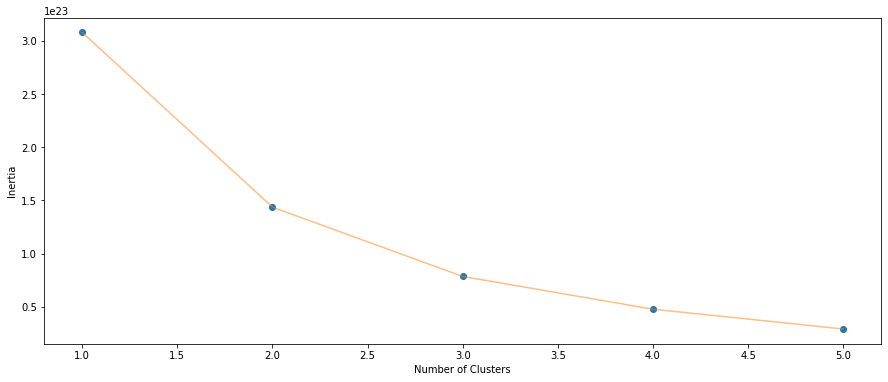

In [ ]:
#plot the elbow
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(1 , 6) , inertia , 'o')
plt.plot(np.arange(1 , 6) , inertia , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('Inertia')
plt.show()

In [ ]:
# train the model with the determined cluster

algorithm = (KMeans(n_clusters = 5 ,init='k-means++' ,max_iter=300, 
                        random_state= 111 ) )
algorithm.fit(X1)
labels1 = algorithm.labels_
centroids1 = algorithm.cluster_centers_

In [ ]:
df_segment['cluster'] = labels1

In [ ]:
df_segment.groupby('cluster').mean()

,churn_rate,basket_size,total_shipment,min_shipment,max_shipment,avg_shipment,total_amount,min_amount,max_amount,avg_amount,total_quantity,min_quantity,max_quantity,avg_quantity,min_item_price,max_item_price,avg_item_price,freguency_trx,total_unique_product,total_promo_amount,total_promo_code,avg_homepage,avg_scroll,avg_click,item_detail,avg_promo_page,avg_search,avg_add_to_cart,avg_add_promo,avg_web,avg_mobile
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,4.034958,27.340146,2.032959e+06,98.544875,19575.546918,6000.120873,1.909628e+08,16284.860368,1.322307e+06,3.447595e+05,318.520905,0.115089,3.667838,0.964256,10439.881821,387580.380276,163214.495483,11.135023,15.068047,4.805139e+05,10.026187,1.702633,0.999583,1.536580,0.861585,0.417275,0.698635,1.684695,0.245431,0.983643,7.887849
1,1.309392,109.958621,4.894862e+07,0.000000,42707.182320,8759.482711,2.402721e+10,47006.900552,9.623128e+06,1.190777e+06,8295.011050,0.569061,11.784530,1.439383,33097.546961,622746.060773,240991.366987,122.337017,226.464088,1.176526e+07,79.823204,3.718536,3.303124,4.603357,2.533409,1.263987,2.462506,3.502833,0.588137,4.423202,19.895892
2,1.238095,75.736584,3.660092e+07,4.668534,43562.091503,8956.325173,9.217455e+09,49171.573296,6.651060e+06,9.426344e+05,5980.702148,0.617180,11.581699,1.437168,35884.095238,616051.387488,241992.167696,118.939309,197.034547,8.796074e+06,79.840336,3.710774,3.263890,4.570900,2.525890,1.268444,2.427128,2.870562,0.605098,4.011265,19.396386
3,2.230769,302.780253,6.599077e+07,0.000000,31923.076923,8200.845555,7.380659e+10,39241.615385,1.588850e+07,1.482920e+06,10918.538462,0.461538,13.384615,1.411681,24063.923077,592751.000000,228172.922194,56.461538,150.307692,9.274823e+06,47.461538,3.459658,2.646079,3.699381,1.976252,0.870762,1.836430,3.833084,0.387553,2.130384,17.527536
4,1.732124,60.273760,1.918954e+07,1.314406,39158.780231,8688.783661,3.146989e+09,45714.613302,4.615497e+06,7.553119e+05,3083.338591,0.523922,9.751314,1.409441,34005.898002,579485.485542,236762.997642,75.255783,116.350946,4.529083e+06,56.332282,3.350517,2.701505,3.846885,2.108682,1.019458,1.982883,2.510104,0.501928,2.831598,16.740225


# **4. Machine Learning**

## **4.1 Model**

### **4.1.1 Baseline Model**

In [ ]:
# Read Dataset

df_final_2month = pd.read_csv('gdrive/My Drive/Mockup Dataset/df_final_2month.csv')

In [ ]:
df_final_2month.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 642402 entries, 0 to 34906
Data columns (total 35 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   yearmonth_x           642402 non-null  object 
 1   customer_id           642402 non-null  int64  
 2   total_shipment        642402 non-null  float64
 3   min_shipment          642402 non-null  float64
 4   max_shipment          642402 non-null  float64
 5   avg_shipment          642402 non-null  float64
 6   total_amount          642402 non-null  float64
 7   min_amount            642402 non-null  float64
 8   max_amount            642402 non-null  float64
 9   avg_amount            642402 non-null  float64
 10  total_quantity        642402 non-null  float64
 11  min_quantity          642402 non-null  float64
 12  max_quantity          642402 non-null  float64
 13  avg_quantity          642402 non-null  float64
 14  min_item_price        642402 non-null  float64
 15  m

In [ ]:
# Make a dataset for split data

df_split = df_final_2month.copy()
df_split.drop(['yearmonth_x', 'customer_id', 'first_transaction', 'last_transaction', 'yearmonth_y'], axis = 1, inplace = True)

In [ ]:
#split data into traning and testing

#y = target variabel
#x = variable predictor

#separate data from target variabel
y = df_split.pop('churn')
X = df_split

#split data
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size= 0.8, random_state=50)

In [ ]:
#decision Tree model
dt_model = DecisionTreeClassifier()
clf = dt_model.fit(X_train,y_train)
predictdt_y = dt_model.predict(X_test)
accuracy_dt = dt_model.score(X_test,y_test)
print("Decision Tree accuracy is :",accuracy_dt)

Decision Tree accuracy is : 0.8480397879842155


In [ ]:
print(classification_report(y_test, predictdt_y))

              precision    recall  f1-score   support

           0       0.88      0.91      0.90     94407
           1       0.74      0.67      0.70     34074

    accuracy                           0.85    128481
   macro avg       0.81      0.79      0.80    128481
weighted avg       0.84      0.85      0.85    128481



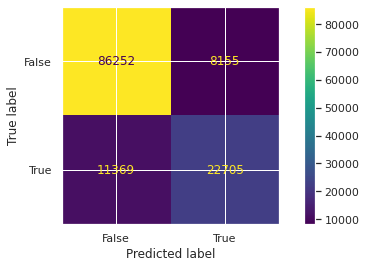

In [ ]:
actual = y_test
predicted = predictdt_y

confusion_matrix = metrics.confusion_matrix(actual, predicted)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

In [ ]:
# AUC score

auc = metrics.roc_auc_score(y_test,predictdt_y)
print(auc)

0.7899812667034972


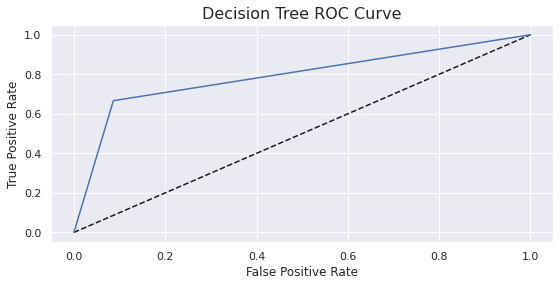

In [ ]:
#ROC
y_dtpred_prob = dt_model.predict_proba(X_test)[:,1]
fpr_dt, tpr_dt, thresholds = roc_curve(y_test, y_dtpred_prob)
plt.plot([0, 1], [0, 1], 'k--' )
plt.plot(fpr_dt, tpr_dt, label='Decision Tree',color = "b")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC Curve',fontsize=16)
plt.show();

In [ ]:
# Logistic Regression model
dt_model = LogisticRegression()
clf = dt_model.fit(X_train,y_train)
predictdt_y = dt_model.predict(X_test)
accuracy_dt = dt_model.score(X_test,y_test)
print("Logistic Regression accuracy is :",accuracy_dt)

Logistic Regression accuracy is : 0.8582669811100474


In [ ]:
print(classification_report(y_test, predictdt_y))

              precision    recall  f1-score   support

           0       0.85      0.98      0.91     94407
           1       0.92      0.51      0.66     34074

    accuracy                           0.86    128481
   macro avg       0.88      0.75      0.78    128481
weighted avg       0.87      0.86      0.84    128481



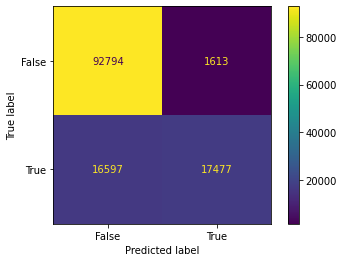

In [ ]:
actual = y_test
predicted = predictdt_y

confusion_matrix = metrics.confusion_matrix(actual, predicted)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

In [ ]:
# AUC score

auc = metrics.roc_auc_score(y_test,predictdt_y)
print(auc)

0.747913737041933


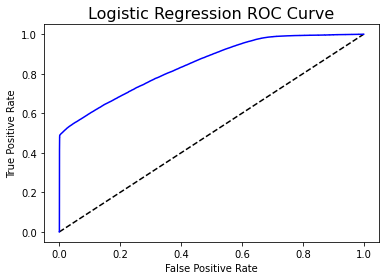

In [ ]:
#ROC
y_dtpred_prob = dt_model.predict_proba(X_test)[:,1]
fpr_dt, tpr_dt, thresholds = roc_curve(y_test, y_dtpred_prob)
plt.plot([0, 1], [0, 1], 'k--' )
plt.plot(fpr_dt, tpr_dt, label='Logistic Regression',color = "b")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression ROC Curve',fontsize=16)
plt.show();

In [ ]:
# Gaussian Naive Bayes

# Create a Gaussian Classifier
model = GaussianNB()

# Train the model using the training sets 
model.fit(X_train,y_train)

# Prediction on test set
y_pred = model.predict(X_test)

# Calculating the accuracy
acc_nb = round( metrics.accuracy_score(y_test, y_pred) * 100, 2 )
print( 'Accuracy of Gaussian Naive Bayes model : ', acc_nb )

Accuracy of Gaussian Naive Bayes model :  61.28


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.56      0.68     94407
           1       0.38      0.76      0.51     34074

    accuracy                           0.61    128481
   macro avg       0.63      0.66      0.60    128481
weighted avg       0.74      0.61      0.63    128481



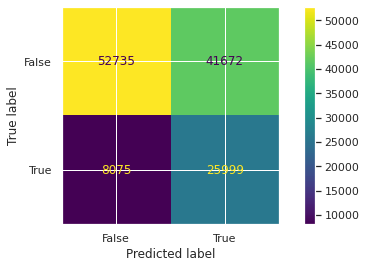

In [ ]:
actual = y_test
predicted = y_pred

confusion_matrix = metrics.confusion_matrix(actual, predicted)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

In [ ]:
# AUC score
auc = metrics.roc_auc_score(y_test,predictdt_y)
print(auc)

0.7899812667034972


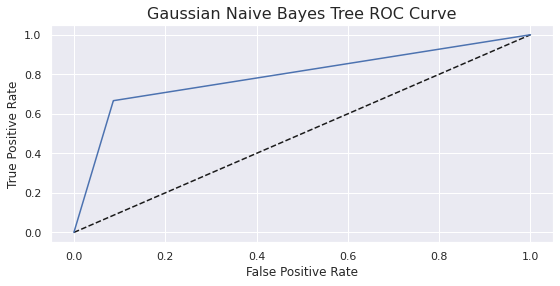

In [ ]:
#ROC
y_dtpred_prob = dt_model.predict_proba(X_test)[:,1]
fpr_gnb, tpr_gnb, thresholds = roc_curve(y_test, y_dtpred_prob)
plt.plot([0, 1], [0, 1], 'k--' )
plt.plot(fpr_gnb, tpr_gnb, label='Gaussian Naive Bayes',color = "b")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Gaussian Naive Bayes Tree ROC Curve',fontsize=16)
plt.show();

In [ ]:
#function for prediction
def prediction(x_train, y_train, x_test, y_test, clf, model_name='decision tree'):
  
    clf = clf
    clf.fit(x_train, y_train)
    y_test_pred = clf.predict(x_test)
    y_train_pred = clf.predict(x_train)


    result = dict()
    test_result = get_metrics(y_pred=y_test_pred, y_act=y_test, model_name=model_name)
    train_result = get_metrics(y_pred=y_train_pred, y_act=y_train, model_name=model_name)

    result['test'] = test_result
    result['train'] = train_result
    result['y_test'] = y_test
    result['y_test_pred'] = y_test_pred
    result['y_train'] = y_train
    result['y_train_pred'] = y_train_pred
    result['clf'] = clf
    result['x_train'] = x_train
    result['x_test'] = x_test

    del clf

    return result

In [ ]:
def get_metrics(y_pred, y_act, model_name):
    recall =  recall_score(y_act, y_pred)
    precision = precision_score(y_act, y_pred)
    roc_auc = roc_auc_score(y_act, y_pred)
    f1 = f1_score(y_act, y_pred)
    accuracy = accuracy_score(y_act, y_pred)

    metrics_result = dict(model_name=model_name, 
                        recall=recall, 
                        precision=precision, 
                        roc_auc=roc_auc, 
                        f1=f1,
                        accuracy=accuracy)
  
    return metrics_result

In [ ]:
model_1_result = prediction(X_train, y_train, X_test, y_test, xgb.XGBClassifier(random_state=42), model_name='xgboost')
model_2_result = prediction(X_train, y_train, X_test, y_test, LogisticRegression(), model_name='logistic regression')
model_3_result = prediction(X_train, y_train, X_test, y_test, RandomForestClassifier(random_state=42), model_name='random forest')
model_4_result = prediction(X_train, y_train, X_test, y_test, KNeighborsClassifier(), model_name='kNN')
model_5_result = prediction(X_train, y_train, X_test, y_test, DecisionTreeClassifier(), model_name='decision tree')

In [ ]:
baseline_train = pd.DataFrame([
              model_1_result['train'], 
              model_2_result['train'], 
              model_3_result['train'], 
              model_4_result['train'],
              model_5_result['train'],
              ])
baseline_train.sort_values(by=['accuracy'], ascending=False)

,model_name,recall,precision,roc_auc,f1,accuracy
4,decision tree,0.999552,1.000000,0.999776,0.999776,0.999881
2,random forest,0.999530,0.999926,0.999752,0.999728,0.999856
3,kNN,0.618416,0.903383,0.797302,0.734219,0.881478
0,xgboost,0.489746,0.999820,0.744857,0.657450,0.864901
1,logistic regression,0.490312,0.995820,0.744786,0.657092,0.864530


In [ ]:
baseline_model = pd.DataFrame([model_1_result['test'], 
              model_2_result['test'], 
              model_3_result['test'], 
              model_4_result['test'],
              model_5_result['test'],
              ])
baseline_model.sort_values(by=['accuracy'], ascending=False)

,model_name,recall,precision,roc_auc,f1,accuracy
0,xgboost,0.486881,0.999578,0.743404,0.654812,0.863863
1,logistic regression,0.487498,0.996102,0.743405,0.654621,0.863575
2,random forest,0.542613,0.887742,0.758924,0.673540,0.860501
4,decision tree,0.665816,0.736065,0.789823,0.699180,0.848055
3,kNN,0.540529,0.806498,0.746861,0.647256,0.843751


In [ ]:
baseline_train = pd.DataFrame([
              model_1_result['train'], 
              model_2_result['train'], 
              model_3_result['train'], 
              model_4_result['train'],
              model_5_result['train'],
              ])
baseline_train.sort_values(by=['accuracy'], ascending=False)

,model_name,recall,precision,roc_auc,f1,accuracy
4,decision tree,0.999552,1.000000,0.999776,0.999776,0.999776
2,random forest,0.999530,0.999926,0.999752,0.999728,0.999752
3,kNN,0.618416,0.903383,0.797302,0.734219,0.797302
0,xgboost,0.489746,0.999820,0.744857,0.657450,0.744857
1,logistic regression,0.490312,0.995820,0.744786,0.657092,0.744786


In [ ]:
baseline_model = pd.DataFrame([model_1_result['test'], 
              model_2_result['test'], 
              model_3_result['test'], 
              model_4_result['test'],
              model_5_result['test'],
              ])
baseline_model.sort_values(by=['accuracy'], ascending=False)

,model_name,recall,precision,roc_auc,f1,accuracy
4,decision tree,0.664407,0.736899,0.789394,0.698778,0.789394
2,random forest,0.542613,0.887742,0.758924,0.673540,0.758924
3,kNN,0.540529,0.806498,0.746861,0.647256,0.746861
1,logistic regression,0.487498,0.996102,0.743405,0.654621,0.743405
0,xgboost,0.486881,0.999578,0.743404,0.654812,0.743404


### **4.1.2 Hyperparameter Tunning**

In [ ]:
# Decision Tree

# Hyperparameter Optimization
parameters = {'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10, 50], 
              'min_samples_split': [2, 3, 50, 100],
              'min_samples_leaf': [1, 5, 8, 10]
             }

# Run the grid search
grid_obj = GridSearchCV(clf, parameters)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
clf = grid_obj.best_estimator_

# Train the model using the training sets 
clf.fit(X_train, y_train)

# Prediction on test set
y_pred = clf.predict(X_test)

# Calculating the accuracy
acc_dt = round( metrics.accuracy_score(y_test, y_pred) * 100, 2 )
print( 'Accuracy of Decision Tree model : ', acc_dt )

Accuracy of Decision Tree model :  86.39


In [ ]:
#decision Tree model
dt_model = DecisionTreeClassifier()
clf = dt_model.fit(X_train,y_train)
predictdt_y = dt_model.predict(X_test)
accuracy_dt = dt_model.score(X_test,y_test)
print("Decision Tree accuracy is :",accuracy_dt)

Decision Tree accuracy is : 0.8519781134953807


In [ ]:
# Decision Tree

# Hyperparameter Optimization
parameters = {'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10, 50], 
              'min_samples_split': [2, 3, 50, 100],
              'min_samples_leaf': [1, 5, 8, 10]
             }

# Run the grid search
grid_obj = GridSearchCV(clf, parameters)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
clf = grid_obj.best_estimator_

# Train the model using the training sets 
clf.fit(X_train, y_train)

# Prediction on test set
y_pred = clf.predict(X_test)

# Calculating the accuracy
acc_dt = round( metrics.accuracy_score(y_test, y_pred) * 100, 2 )
print( 'Accuracy of Decision Tree model : ', acc_dt )

Accuracy of Decision Tree model :  86.45


In [ ]:
print('Best algorithm:', grid_obj.best_estimator_.get_params())

Best algorithm: {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 10, 'max_features': 'auto', 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 8, 'min_samples_split': 100, 'min_weight_fraction_leaf': 0.0, 'random_state': None, 'splitter': 'best'}


In [ ]:
parameter = grid_obj.best_estimator_.get_params()
type(parameter)

dict

In [ ]:
pd.DataFrame.from_dict(parameter, orient='index')

,0
ccp_alpha,0.0
class_weight,None
criterion,entropy
max_depth,10
max_features,auto
max_leaf_nodes,None
min_impurity_decrease,0.0
min_samples_leaf,8
min_samples_split,100
min_weight_fraction_leaf,0.0


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.84      1.00      0.92     94407
           1       1.00      0.49      0.65     34074

    accuracy                           0.86    128481
   macro avg       0.92      0.74      0.79    128481
weighted avg       0.89      0.86      0.85    128481



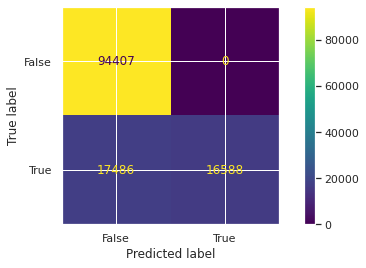

In [ ]:
actual = y_test
predicted = y_pred

confusion_matrix = metrics.confusion_matrix(actual, predicted)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

In [ ]:
# List Hyperparameters yang akan diuji

hyperparameters = parameters = {'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10, 50], 
              'min_samples_split': [2, 3, 50, 100],
              'min_samples_leaf': [1, 5, 8, 10]
             }

# Inisiasi model
dectree = DecisionTreeClassifier()(random_state=50) # Init Logres dengan Gridsearch, cross validation = 5
model = RandomizedSearchCV(dectree, hyperparameters, cv=5, random_state=50, scoring='recall')

# Fitting Model & Evaluation
dectree_hyper = prediction(X_train, y_train, X_test, y_test, model, model_name='DecisionTree_hyperparam')

In [ ]:
parameters = {'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10, 50], 
              'min_samples_split': [2, 3, 50, 100],
              'min_samples_leaf': [1, 5, 8, 10]
             }

In [ ]:
# Logistic Regression

# Create a Logistic regression classifier
logreg = LogisticRegression()

# Train the model using the training sets 
logreg.fit(X_train, y_train)

# Prediction on test data
y_pred = logreg.predict(X_test)

# Calculating the accuracy
acc_logreg = round( metrics.accuracy_score(y_test, y_pred) * 100, 2 )
print( 'Accuracy of Logistic Regression model : ', acc_logreg )

Accuracy of Logistic Regression model :  86.36


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.84      1.00      0.92     94407
           1       1.00      0.49      0.65     34074

    accuracy                           0.86    128481
   macro avg       0.92      0.74      0.78    128481
weighted avg       0.88      0.86      0.85    128481



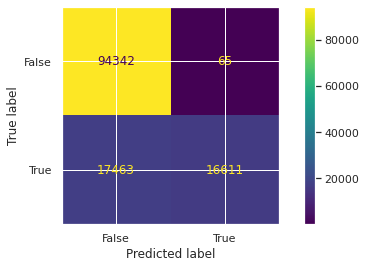

In [ ]:
actual = y_test
predicted = y_pred

confusion_matrix = metrics.confusion_matrix(actual, predicted)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

In [ ]:
# Random Forest Classifier

# Create a Random Forest Classifier
rf = RandomForestClassifier()

# Hyperparameter Optimization
parameters = {'n_estimators': [4, 6, 9, 10, 15], 
              'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10], 
              'min_samples_split': [2, 3, 5],
              'min_samples_leaf': [1, 5, 8]
             }

# Run the grid search
grid_obj = GridSearchCV(rf, parameters)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the rf to the best combination of parameters
rf = grid_obj.best_estimator_

# Train the model using the training sets 
rf.fit(X_train,y_train)

# Prediction on test data
y_pred = rf.predict(X_test)

# Calculating the accuracy
acc_rf = round( metrics.accuracy_score(y_test, y_pred) * 100 , 2 )
print( 'Accuracy of Random Forest model : ', acc_rf )

In [ ]:
print(classification_report(y_test, y_pred))

In [ ]:
actual = y_test
predicted = y_pred

confusion_matrix = metrics.confusion_matrix(actual, predicted)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

In [ ]:
#ROC

y_dtpred_prob = dt_model.predict_proba(X_test)[:,1]
fpr_rf, tpr_rf, thresholds = roc_curve(y_test, y_dtpred_prob)
plt.plot([0, 1], [0, 1], 'k--' )
plt.plot(fpr_rf, tpr_rf, label='Random Forest',color = "r")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest ROC Curve',fontsize=16)
plt.show();

In [ ]:
# Tuned Decision Tree

# Creating the hyperparameter grid
param_dist = {"max_depth": [3, None],
			"max_features": randint(1, 9),
			"min_samples_leaf": randint(1, 9),
			"criterion": ["gini", "entropy"]}

# Instantiating Decision Tree classifier
tree = DecisionTreeClassifier()

# Instantiating RandomizedSearchCV object
tree_cv = RandomizedSearchCV(tree, param_dist, cv = 5)

tree_cv.fit(X, y)

# Print the tuned parameters and score
print("Tuned Decision Tree Parameters: {}".format(tree_cv.best_params_))
print("Best score is {}".format(tree_cv.best_score_))

In [ ]:
print(classification_report(y_test, y_pred))

In [ ]:
# SVM Classifier

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# Create a Support Vector Classifier
svc = svm.SVC()

# Hyperparameter Optimization
parameters = [
  {'C': [1, 10, 100, 1000], 'kernel': ['linear']},
  {'C': [1, 10, 100, 1000], 'gamma': [0.001, 0.0001], 'kernel': ['rbf']},
]

# Run the grid search
grid_obj = GridSearchCV(svc, parameters)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the svc to the best combination of parameters
svc = grid_obj.best_estimator_

# Train the model using the training sets 
svc.fit(X_train,y_train)

# Prediction on test data
y_pred = svc.predict(X_test)

# Calculating the accuracy
acc_svm = round( metrics.accuracy_score(y_test, y_pred) * 100, 2 )
print( 'Accuracy of SVM model : ', acc_svm )

In [ ]:
print(classification_report(y_test, y_pred))

In [ ]:
actual = y_test
predicted = y_pred

confusion_matrix = metrics.confusion_matrix(actual, predicted)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

In [ ]:
# K - Nearest Neighbors

# Create a KNN Classifier
knn = KNeighborsClassifier()

# Hyperparameter Optimization
parameters = {'n_neighbors': [3, 4, 5, 10], 
              'weights': ['uniform', 'distance'],
              'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute'],
              'leaf_size' : [10, 20, 30, 50]
             }

# Run the grid search
grid_obj = GridSearchCV(knn, parameters)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the knn to the best combination of parameters
knn = grid_obj.best_estimator_

# Train the model using the training sets 
knn.fit(X_train,y_train)

# Prediction on test data
y_pred = knn.predict(X_test)

# Calculating the accuracy
acc_knn = round( metrics.accuracy_score(y_test, y_pred) * 100, 2 )
print( 'Accuracy of KNN model : ', acc_knn )

In [ ]:
print(classification_report(y_test, y_pred))

In [ ]:
actual = y_test
predicted = y_pred

confusion_matrix = metrics.confusion_matrix(actual, predicted)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

In [ ]:
def get_metrics(y_pred, y_act, model_name):
    recall =  recall_score(y_act, y_pred)
    precision = precision_score(y_act, y_pred)
    roc_auc = roc_auc_score(y_act, y_pred)
    f1 = f1_score(y_act, y_pred)
    accuracy = balanced_accuracy_score(y_act, y_pred)

    metrics_result = dict(model_name=model_name, 
                        recall=recall, 
                        precision=precision, 
                        roc_auc=roc_auc, 
                        f1=f1,
                        accuracy=accuracy)
  
    return metrics_result

In [ ]:
#function for feature importance
def show_feature_importance(model):
    feat_importances = pd.Series(model.feature_importances_, index=x.columns)
    ax = feat_importances.nlargest(25).plot(kind='barh', figsize=(10, 8))
    ax.invert_yaxis()

    plt.xlabel('score')
    plt.ylabel('feature')
    plt.title('feature importance score')

In [ ]:
#function for hyperparameter
def show_best_hyperparameter(model, hyperparameters):
    for key, value in hyperparameters.items() :
        print('Best '+key+':', model.get_params()[key])

In [ ]:
#function for prediction
def prediction(x_train, y_train, x_test, y_test, clf, model_name='decision tree'):
  
    clf = clf
    clf.fit(x_train, y_train)
    y_test_pred = clf.predict(x_test)
    y_train_pred = clf.predict(x_train)


    result = dict()
    test_result = get_metrics(y_pred=y_test_pred, y_act=y_test, model_name=model_name)
    train_result = get_metrics(y_pred=y_train_pred, y_act=y_train, model_name=model_name)

    result['test'] = test_result
    result['train'] = train_result
    result['y_test'] = y_test
    result['y_test_pred'] = y_test_pred
    result['y_train'] = y_train
    result['y_train_pred'] = y_train_pred
    result['clf'] = clf
    result['x_train'] = x_train
    result['x_test'] = x_test

    del clf

    return result

In [ ]:
#Menjadikan ke dalam bentuk dictionary
hyperparameters = {
                    'max_depth' : [int(x) for x in np.linspace(10, 110, num = 11)],
                    'min_child_weight' : [int(x) for x in np.linspace(1, 20, num = 11)],
                    'gamma' : [float(x) for x in np.linspace(0, 1, num = 11)],
                    'tree_method' : ['auto', 'exact', 'approx', 'hist'],

                    'colsample_bytree' : [float(x) for x in np.linspace(0, 1, num = 11)],
                    'eta' : [float(x) for x in np.linspace(0, 1, num = 100)],

                    'lambda' : [float(x) for x in np.linspace(0, 1, num = 11)],
                    'alpha' : [float(x) for x in np.linspace(0, 1, num = 11)]
                    }

# Init
xg = xgb.XGBClassifier(random_state=42)
xg_tuned = RandomizedSearchCV(xg, hyperparameters, cv=5, random_state=42, scoring='recall')

# Predict & Evaluation
xg_hyper = prediction(X_train, y_train, X_test, y_test, xg_tuned, model_name='xgboost_hyperparam')

In [ ]:
show_best_hyperparameter(xg_tuned.best_estimator_, hyperparameters)

In [ ]:
models = pd.DataFrame({
    'Model': ['Logistic Regression', 'Naive Bayes', 'Decision Tree', 'Random Forest', 'Support Vector Machines', 
              'K - Nearest Neighbors'],
    'Score': [acc_logreg, acc_nb, acc_dt, acc_rf, acc_svm, acc_knn]})
models.sort_values(by='Score', ascending=False)

In [ ]:
# List Hyperparameters yang akan diuji
penalty = ['l2']
C = [0.0001] # Inverse of regularization strength; smaller values specify stronger regularization.
hyperparameters = dict(penalty=penalty, C=C)

# Inisiasi model
logres = LogisticRegression(random_state=42) # Init Logres dengan Gridsearch, cross validation = 5
model = RandomizedSearchCV(logres, hyperparameters, cv=5, random_state=42, scoring='recall')

# Fitting Model & Evaluation
logres_hyper = prediction(X_train, y_train, X_test, y_test, model, model_name='logistic regression_hyperparam')

In [ ]:
# Creating the hyperparameter grid
hyperparameters = {'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10, 50], 
              'min_samples_split': [2, 3, 50, 100],
              'min_samples_leaf': [1, 5, 8, 10]
             }

# Instantiating Decision Tree classifier
tree = DecisionTreeClassifier()

# Instantiating RandomizedSearchCV object
model = RandomizedSearchCV(tree, hyperparameters, cv=5, random_state=42, scoring='recall')

dectree_hyper = prediction(X_train, y_train, X_test, y_test, model, model_name='decision tree_hyperparam')

In [ ]:
print(classification_report(y_test, y_pred))

In [ ]:
# Creating the hyperparameter grid
hyperparameters = {'n_neighbors': [3, 4, 5, 10], 
              'weights': ['uniform', 'distance'],
              'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute'],
              'leaf_size' : [10, 20, 30, 50]
             }

# Instantiating KNN classifier
knn = KNeighborsClassifier()

# Instantiating RandomizedSearchCV object
model = RandomizedSearchCV(knn, hyperparameters, cv=5, random_state=42, scoring='recall')

knn_hyper = prediction(X_train, y_train, X_test, y_test, model, model_name='knn_hyperparam')

In [ ]:
# Creating the hyperparameter grid
# hyperparameters={ 'objective':'reg:squarederror',
#          'max_depth': 6, 
#          'colsample_bylevel':0.5,
#          'learning_rate':0.01,
#          'random_state':20}

hyperparameters = {'max_depth':range(3,10,2),
 'min_child_weight':range(1,6,2)}

# Instantiating KNN classifier
xgbmodel = xgb.XGBClassifier(random_state=42)

# Instantiating RandomizedSearchCV object
model = RandomizedSearchCV(xgbmodel, hyperparameters, cv=5, random_state=42, scoring='recall')

xgb_hyper = prediction(X_train, y_train, X_test, y_test, model, model_name='xgboost_hyperparam')

In [ ]:
# Creating the hyperparameter grid
hyperparameters = {'n_estimators': [6, 9, 10], 
              'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 5, 10], 
              'min_samples_split': [2, 3, 5],
              'min_samples_leaf': [1, 5, 8]
             }

# Instantiating Random Forest classifier
rf = RandomForestClassifier()

# Instantiating RandomizedSearchCV object
model = RandomizedSearchCV(rf, hyperparameters, cv=5, random_state=42, scoring='recall')

rf_hyper = prediction(X_train, y_train, X_test, y_test, model, model_name='random forest_hyperparam')

In [ ]:
hyperparameter_model_train = pd.DataFrame([
              logres_hyper['train'], 
              dectree_hyper['train'], 
              knn_hyper['train'], 
              xgb_hyper['train'],
              rf_hyper['train'],
              ])
hyperparameter_model_train.sort_values(by=['accuracy'], ascending=False)

,model_name,recall,precision,roc_auc,f1,accuracy
2,knn_hyperparam,1.000000,1.000000,1.000000,1.000000,1.000000
1,decision tree_hyperparam,0.657535,0.875593,0.811950,0.751057,0.884611
3,xgboost_hyperparam,0.535562,0.957362,0.763487,0.686875,0.870739
4,random forest_hyperparam,0.491723,0.998791,0.745755,0.659006,0.865291
0,logistic regression_hyperparam,0.565301,0.798378,0.756952,0.661921,0.847134


In [ ]:
hyperparameter_model = pd.DataFrame([
              logres_hyper['test'], 
              dectree_hyper['test'], 
              knn_hyper['test'], 
              xgb_hyper['test'],
              rf_hyper['test'],
              ])
hyperparameter_model.sort_values(by=['accuracy'], ascending=False)

,model_name,recall,precision,roc_auc,f1,accuracy
3,xgboost_hyperparam,0.522657,0.944624,0.755799,0.672965,0.865280
4,random forest_hyperparam,0.488055,0.997900,0.743842,0.655512,0.863957
2,knn_hyperparam,0.590186,0.808767,0.769910,0.682400,0.854305
1,decision tree_hyperparam,0.598462,0.799122,0.772083,0.684387,0.853613
0,logistic regression_hyperparam,0.561777,0.800150,0.755567,0.660103,0.846569


In [ ]:
hyperparameter_model_train = pd.DataFrame([
              logres_hyper['train'], 
              dectree_hyper['train'], 
              knn_hyper['train'], 
              xgb_hyper['train'],
              rf_hyper['train'],
              ])
hyperparameter_model_train.sort_values(by=['accuracy'], ascending=False)

,model_name,recall,precision,roc_auc,f1,accuracy
2,knn_hyperparam,0.999552,1.000000,0.999776,0.999776,0.999776
1,decision tree_hyperparam,0.619026,0.884696,0.794990,0.728392,0.794990
3,xgboost_hyperparam,0.495090,0.999807,0.747528,0.662245,0.747528
4,random forest_hyperparam,0.489790,0.999955,0.744891,0.657519,0.744891
0,logistic regression_hyperparam,0.490312,0.995850,0.744788,0.657098,0.744788


In [ ]:
hyperparameter_model = pd.DataFrame([
              logres_hyper['test'], 
              dectree_hyper['test'], 
              knn_hyper['test'], 
              xgb_hyper['test'],
              rf_hyper['test'],
              ])
hyperparameter_model.sort_values(by=['accuracy'], ascending=False)

,model_name,recall,precision,roc_auc,f1,accuracy
2,knn_hyperparam,0.590245,0.790628,0.766915,0.675897,0.766915
1,decision tree_hyperparam,0.562423,0.808573,0.757183,0.663401,0.757183
3,xgboost_hyperparam,0.487997,0.997002,0.743734,0.655265,0.743734
4,random forest_hyperparam,0.486852,0.999940,0.743421,0.654863,0.743421
0,logistic regression_hyperparam,0.487498,0.996102,0.743405,0.654621,0.743405


### **4.1.3 Cross Validation**

In [ ]:
# cross validation for naive bayes
# Multiply by -1 since sklearn calculates *negative* MAE
scores = -1 * cross_val_score(model.fit(X_train,y_train), X, y,
                              cv=5,
                              scoring='neg_mean_absolute_error')

print("MAE scores:\n", scores)
print("Average MAE score (across experiments):")
print(scores.mean())

In [ ]:
#cross validation for logistic regression
# Multiply by -1 since sklearn calculates *negative* MAE
scores = -1 * cross_val_score(logreg.fit(X_train, y_train), X, y,
                              cv=5,
                              scoring='neg_mean_absolute_error')

print("MAE scores:\n", scores)
print("Average MAE score (across experiments):")
print(scores.mean())

In [ ]:
#cross validation for random forest
# Multiply by -1 since sklearn calculates *negative* MAE
scores = -1 * cross_val_score(rf.fit(X_train,y_train), X, y,
                              cv=5,
                              scoring='neg_mean_absolute_error')

print("MAE scores:\n", scores)
print("Average MAE score (across experiments):")
print(scores.mean())

In [ ]:
#cross validation for decision tree
# Multiply by -1 since sklearn calculates *negative* MAE
scores = -1 * cross_val_score(tree_cv, X, y,
                              cv=5,
                              scoring='neg_mean_absolute_error')

print("MAE scores:\n", scores)
print("Average MAE score (across experiments):")
print(scores.mean())

In [ ]:
#cross validation for svm
# Multiply by -1 since sklearn calculates *negative* MAE
scores = -1 * cross_val_score(svc.fit(X_train,y_train), X, y,
                              cv=5,
                              scoring='neg_mean_absolute_error')

print("MAE scores:\n", scores)
print("Average MAE score (across experiments):")
print(scores.mean())

In [ ]:
#cross validation for KNN
# Multiply by -1 since sklearn calculates *negative* MAE
scores = -1 * cross_val_score(knn.fit(X_train,y_train), X, y,
                              cv=5,
                              scoring='neg_mean_absolute_error')

print("MAE scores:\n", scores)
print("Average MAE score (across experiments):")
print(scores.mean())

## **4.2 Feature Importance**

In [ ]:
explainer = shap.Explainer(logres_hyper['clf'].predict, logres_hyper['x_test'])
shap_values_cat = explainer(logres_hyper['x_test'])

Permutation explainer: 128482it [55:14, 38.68it/s]                            


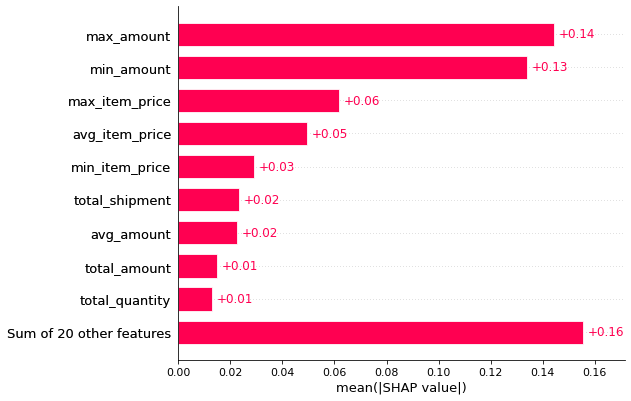

In [ ]:
shap.plots.bar(shap_values_cat)

In [ ]:
def get_score_after_permutation(model, X, y, curr_feat):
    """ return the score of model when curr_feat is permuted """

    X_permuted = X.copy()
    col_idx = list(X.columns).index(curr_feat)
    # permute one column
    X_permuted.iloc[:, col_idx] = np.random.permutation(
        X_permuted[curr_feat].values)

    permuted_score = model.score(X_permuted, y)
    return permuted_score


def get_feature_importance(model, X, y, curr_feat):
    """ compare the score when curr_feat is permuted """

    baseline_score_train = model.score(X, y)
    permuted_score_train = get_score_after_permutation(model, X, y, curr_feat)

    # feature importance is the difference between the two scores
    feature_importance = baseline_score_train - permuted_score_train
    return feature_importance


curr_feat = 'MedInc'

feature_importance = get_feature_importance(model, X_train, y_train, curr_feat)
print(f'feature importance of "{curr_feat}" on train set is '
      f'{feature_importance:.3}')

In [ ]:
n_repeats = 10

list_feature_importance = []
for n_round in range(n_repeats):
    list_feature_importance.append(
        get_feature_importance(model, X_train, y_train, curr_feat))

print(
    f'feature importance of "{curr_feat}" on train set is '
    f'{np.mean(list_feature_importance):.3} '
    f'± {np.std(list_feature_importance):.3}')

In [ ]:
def permutation_importance(model, X, y, n_repeats=10):
    """Calculate importance score for each feature."""

    importances = []
    for curr_feat in X.columns:
        list_feature_importance = []
        for n_round in range(n_repeats):
            list_feature_importance.append(
                get_feature_importance(model, X, y, curr_feat))

        importances.append(list_feature_importance)

    return {'importances_mean': np.mean(importances, axis=1),
            'importances_std': np.std(importances, axis=1),
            'importances': importances}

# This function could directly be access from sklearn
# from sklearn.inspection import permutation_importance

In [ ]:
def plot_feature_importances(perm_importance_result, feat_name):
    """ bar plot the feature importance """

    fig, ax = plt.subplots()

    indices = perm_importance_result['importances_mean'].argsort()
    plt.barh(range(len(indices)),
             perm_importance_result['importances_mean'][indices],
             xerr=perm_importance_result['importances_std'][indices])

    ax.set_yticks(range(len(indices)))
    _ = ax.set_yticklabels(feat_name[indices])

In [ ]:
perm_importance_result_train = permutation_importance(
    model, X_train, y_train, n_repeats=10)

plot_feature_importances(perm_importance_result_train, X_train.columns)

## **4.3 Feature Selection**

In [ ]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectFromModel

In [ ]:
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select a subset of features
	fs = SelectFromModel(RandomForestClassifier(n_estimators=1000), max_features=5)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# define the dataset
X, y = make_classification(n_samples=1000, n_features=10, n_informative=5, n_redundant=5, random_state=1)
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# fit the model
model = LogisticRegression(solver='liblinear')
model.fit(X_train_fs, y_train)
# evaluate the model
yhat = model.predict(X_test_fs)
# evaluate predictions
accuracy = accuracy_score(y_test, yhat)
print('Accuracy: %.2f' % (accuracy*100))

Accuracy: 84.55


In [ ]:
df_split.columns

Index(['yearmonth_x', 'customer_id', 'total_shipment', 'min_shipment',
       'max_shipment', 'avg_shipment', 'total_amount', 'min_amount',
       'max_amount', 'avg_amount', 'total_quantity', 'min_quantity',
       'max_quantity', 'avg_quantity', 'min_item_price', 'max_item_price',
       'avg_item_price', 'freguency_trx', 'total_unique_product',
       'first_transaction', 'last_transaction', 'total_promo_amount',
       'total_promo_code', 'avg_homepage', 'avg_scroll', 'avg_click',
       'item_detail', 'avg_promo_page', 'avg_search', 'avg_add_to_cart',
       'avg_add_promo', 'avg_web', 'avg_mobile', 'yearmonth_y', 'churn'],
      dtype='object')

In [ ]:
# Make a dataset for split data


df_split = df_final_2month.copy()
df_split.drop(['yearmonth_x', 'customer_id', 'first_transaction', 'last_transaction', 'yearmonth_y', 'min_shipment','max_shipment', 'avg_shipment','min_quantity',
       'max_quantity', 'avg_quantity','avg_item_price', 'freguency_trx', 'total_unique_product', 'avg_homepage', 'avg_scroll', 'avg_click',
       'item_detail', 'avg_promo_page', 'avg_search', 'avg_add_to_cart',
       'avg_add_promo', 'avg_web', 'avg_mobile','total_promo_code'], axis = 1, inplace = True)

In [ ]:
#split data into traning and testing

#y = target variabel
#x = variable predictor

#separate data from target variabel
y = df_split.pop('churn')
X = df_split

#split data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size= 0.8, random_state=50)

In [ ]:
# Logistic Regression

# Create a Logistic regression classifier
logreg = LogisticRegression()

# Train the model using the training sets 
logreg.fit(X_train, y_train)

# Prediction on test data
y_pred = logreg.predict(X_test)

# Calculating the accuracy
acc_logreg = round( metrics.accuracy_score(y_test, y_pred) * 100, 2 )
print( 'Accuracy of Logistic Regression model : ', acc_logreg )

Accuracy of Logistic Regression model :  86.36


### Akurasi yang didapatkan setelah feature selection sama dengan akurasi yang didapatkan sebelum feature selection. Penggunaan feature selection ini agar model dapat menganalisa data dengan memilih fitur yang berpengaruh (fitur optimal) dan mengesampingkan fitur yang tidak berpengaruh.

# **5. Conclusion**

### Model yang sudah best fit adalah Decision Tree dengan Hyperparameter Tunning , dengan score precission (test set) : 0,84  dan recall test (test set) : 1.00 .
### Model ini dapat kita gunakan sebagai model machine learning untuk menyelesaikan problem business kita.
### Dengan demikian, customer churn menurun.

# **6. Validation Test**

In [ ]:
# Read Dataset use Google Drive

transactions_test = pd.read_csv('gdrive/My Drive/Mockup Dataset/transactions_test.csv')

In [ ]:
transactions_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43214 entries, 0 to 43213
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   created_at              43214 non-null  object 
 1   customer_id             43214 non-null  int64  
 2   booking_id              43214 non-null  object 
 3   session_id              43214 non-null  object 
 4   product_metadata        43214 non-null  object 
 5   payment_method          28188 non-null  object 
 6   payment_status          43214 non-null  object 
 7   promo_amount            43214 non-null  int64  
 8   promo_code              16523 non-null  object 
 9   shipment_fee            19543 non-null  float64
 10  shipment_date_limit     19543 non-null  object 
 11  shipment_location_lat   19543 non-null  float64
 12  shipment_location_long  19543 non-null  float64
 13  total_amount            28047 non-null  float64
dtypes: float64(4), int64(2), object(8)
mem

In [ ]:
# Change data type to save memory

transactions_test[['payment_method', 'payment_status', 'promo_code']] = transactions_test[['payment_method', 'payment_status', 'promo_code']].astype('category')
transactions_test['shipment_date_limit'] = transactions_test['shipment_date_limit'].astype('datetime64')
transactions_test['created_at'] = transactions_test['created_at'].astype('datetime64')

In [ ]:
#change the data type of column 'product_metadata' to be literal 

tmp = transactions_test.iloc[:,4].astype('string')
tmp = tmp.map(lambda x: ast.literal_eval(x))
tmp = tmp.to_frame()
transactions_test['product_metadata'] = tmp['product_metadata']

# explode
transactions_test = transactions_test.explode('product_metadata')
transactions_test.shape

(63495, 14)

In [ ]:
type(transactions_test.iloc[2,4])

dict

In [ ]:
transactions_test.reset_index()

,index,created_at,customer_id,booking_id,session_id,product_metadata,payment_method,payment_status,promo_amount,promo_code,shipment_fee,shipment_date_limit,shipment_location_lat,shipment_location_long,total_amount
0,0,2017-02-01 23:06:50.716201,104555,97df3fe2-3efc-429a-aff6-ccecf5306c31,90acade1-9dbb-464b-82a9-f9332625d225,"{'product_id': 55170, 'quantity': 1, 'item_pri...",NaN,Success,3443,BUYMORE,0.0,2017-02-06 19:36:48.649046,-5.473218,105.608432,758102.0
1,0,2017-02-01 23:06:50.716201,104555,97df3fe2-3efc-429a-aff6-ccecf5306c31,90acade1-9dbb-464b-82a9-f9332625d225,"{'product_id': 46160, 'quantity': 3, 'item_pri...",NaN,Success,3443,BUYMORE,0.0,2017-02-06 19:36:48.649046,-5.473218,105.608432,758102.0
2,0,2017-02-01 23:06:50.716201,104555,97df3fe2-3efc-429a-aff6-ccecf5306c31,90acade1-9dbb-464b-82a9-f9332625d225,"{'product_id': 41608, 'quantity': 1, 'item_pri...",NaN,Success,3443,BUYMORE,0.0,2017-02-06 19:36:48.649046,-5.473218,105.608432,758102.0
3,1,2017-07-05 23:56:41.716201,104555,5a3f61bb-ccb8-45b5-8a65-8b78ad0536e9,318bff0d-1567-4942-80a6-48fbe9a5f472,"{'product_id': 43730, 'quantity': 1, 'item_pri...",NaN,Success,0,NaN,NaN,NaT,NaN,NaN,112361.0
4,2,2017-12-07 02:07:38.716201,104555,64a089aa-0cf0-4013-9880-47aae5569eb4,6424fcce-9e6e-4192-a843-a82aedb161ec,"{'product_id': 30943, 'quantity': 1, 'item_pri...",NaN,Success,1671,AZ2022,NaN,NaT,NaN,NaN,528715.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63490,43210,2022-06-09 02:51:37.465817,100703,5d39690e-1b6d-4347-b4bb-e74a663775ba,5230faaa-f40f-4999-b534-c30f22eb060c,"{'product_id': 12606, 'quantity': 1, 'item_pri...",NaN,Success,0,NaN,NaN,NaT,NaN,NaN,113670.0
63491,43211,2022-06-23 04:32:40.465817,100703,7b8e8f83-7d38-4205-8f59-790e773b4e6a,9ce66fd8-6676-4435-b8f4-c4d4052ddbb2,"{'product_id': 36776, 'quantity': 4, 'item_pri...",Gopay,Success,4295,AZ2022,NaN,NaT,NaN,NaN,2394236.0
63492,43211,2022-06-23 04:32:40.465817,100703,7b8e8f83-7d38-4205-8f59-790e773b4e6a,9ce66fd8-6676-4435-b8f4-c4d4052ddbb2,"{'product_id': 38016, 'quantity': 1, 'item_pri...",Gopay,Success,4295,AZ2022,NaN,NaT,NaN,NaN,2394236.0
63493,43212,2022-07-07 06:01:28.465817,100703,2a538bdc-00f4-4fef-9101-458d47647f32,b60e58f7-d287-4ef6-9305-54549ae5100d,"{'product_id': 14014, 'quantity': 1, 'item_pri...",NaN,Success,0,NaN,NaN,NaT,NaN,NaN,342130.0


In [ ]:
import json
tmp = pd.json_normalize(transactions_test.product_metadata)

In [ ]:
transactions_test = pd.concat([transactions_test.reset_index(), tmp], join = 'outer',axis = 1)

In [ ]:
transactions_test.head()

,index,created_at,customer_id,booking_id,session_id,product_metadata,payment_method,payment_status,promo_amount,promo_code,shipment_fee,shipment_date_limit,shipment_location_lat,shipment_location_long,total_amount,product_id,quantity,item_price
0,0,2017-02-01 23:06:50.716201,104555,97df3fe2-3efc-429a-aff6-ccecf5306c31,90acade1-9dbb-464b-82a9-f9332625d225,"{'product_id': 55170, 'quantity': 1, 'item_pri...",NaN,Success,3443,BUYMORE,0.0,2017-02-06 19:36:48.649046,-5.473218,105.608432,758102.0,55170,1,246915
1,0,2017-02-01 23:06:50.716201,104555,97df3fe2-3efc-429a-aff6-ccecf5306c31,90acade1-9dbb-464b-82a9-f9332625d225,"{'product_id': 46160, 'quantity': 3, 'item_pri...",NaN,Success,3443,BUYMORE,0.0,2017-02-06 19:36:48.649046,-5.473218,105.608432,758102.0,46160,3,123452
2,0,2017-02-01 23:06:50.716201,104555,97df3fe2-3efc-429a-aff6-ccecf5306c31,90acade1-9dbb-464b-82a9-f9332625d225,"{'product_id': 41608, 'quantity': 1, 'item_pri...",NaN,Success,3443,BUYMORE,0.0,2017-02-06 19:36:48.649046,-5.473218,105.608432,758102.0,41608,1,144274
3,1,2017-07-05 23:56:41.716201,104555,5a3f61bb-ccb8-45b5-8a65-8b78ad0536e9,318bff0d-1567-4942-80a6-48fbe9a5f472,"{'product_id': 43730, 'quantity': 1, 'item_pri...",NaN,Success,0,NaN,NaN,NaT,NaN,NaN,112361.0,43730,1,112361
4,2,2017-12-07 02:07:38.716201,104555,64a089aa-0cf0-4013-9880-47aae5569eb4,6424fcce-9e6e-4192-a843-a82aedb161ec,"{'product_id': 30943, 'quantity': 1, 'item_pri...",NaN,Success,1671,AZ2022,NaN,NaT,NaN,NaN,528715.0,30943,1,158473


In [ ]:
# create func for label churn
def label(df):
    if (df['yearmonth_x'] == 0) | (df['yearmonth_y'] == 0):
        return 1 #1 adalah customer label churn
    elif (df['yearmonth_x'] != 0) & (df['yearmonth_y'] != 0):
        return 0 #0 adalah customer level tidak churn
    else:
        return " "

In [ ]:
# Change data type of feature 'created-at'

transactions_test['created_at'] = transactions_test['created_at'].astype('datetime64')

In [ ]:
# Data actual
print(min(transactions_test['created_at']))
print(max(transactions_test['created_at']))

2016-06-30 22:17:59.184922
2022-07-31 23:57:53.817553


### **Churn Labelling Two Month**

In [ ]:
# Get yearmonth
transactions_test['yearmonth'] = transactions_test['created_at'].dt.strftime('%Y-%m')

In [ ]:
# Check min max of month
print(min(transactions_test['yearmonth']))
print(max(transactions_test['yearmonth']))

2016-06
2022-07


## **Merge Data Train and Data Test**

In [ ]:
# Read Dataset

data_train = pd.read_csv('gdrive/My Drive/Mockup Dataset/df_final_2month.csv')
data_test = pd.read_csv('gdrive/My Drive/Mockup Dataset/data_test.csv')

In [ ]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 642402 entries, 0 to 642401
Data columns (total 35 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   yearmonth_x           642402 non-null  object 
 1   customer_id           642402 non-null  int64  
 2   total_shipment        642402 non-null  float64
 3   min_shipment          642402 non-null  float64
 4   max_shipment          642402 non-null  float64
 5   avg_shipment          642402 non-null  float64
 6   total_amount          642402 non-null  float64
 7   min_amount            642402 non-null  float64
 8   max_amount            642402 non-null  float64
 9   avg_amount            642402 non-null  float64
 10  total_quantity        642402 non-null  float64
 11  min_quantity          642402 non-null  float64
 12  max_quantity          642402 non-null  float64
 13  avg_quantity          642402 non-null  float64
 14  min_item_price        642402 non-null  float64
 15  

In [ ]:
data_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31329 entries, 0 to 31328
Data columns (total 35 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   yearmonth_x           31329 non-null  object 
 1   customer_id           31329 non-null  int64  
 2   total_shipment        31329 non-null  float64
 3   min_shipment          31329 non-null  float64
 4   max_shipment          31329 non-null  float64
 5   avg_shipment          31329 non-null  float64
 6   total_amount          31329 non-null  float64
 7   min_amount            31329 non-null  float64
 8   max_amount            31329 non-null  float64
 9   avg_amount            31329 non-null  float64
 10  total_quantity        31329 non-null  float64
 11  min_quantity          31329 non-null  float64
 12  max_quantity          31329 non-null  float64
 13  avg_quantity          31329 non-null  float64
 14  min_item_price        31329 non-null  float64
 15  max_item_price     

In [ ]:
data_train.columns

Index(['Unnamed: 0', 'yearmonth_x', 'customer_id', 'total_shipment',
       'min_shipment', 'max_shipment', 'avg_shipment', 'total_amount',
       'min_amount', 'max_amount', 'avg_amount', 'total_quantity',
       'min_quantity', 'max_quantity', 'avg_quantity', 'min_item_price',
       'max_item_price', 'avg_item_price', 'freguency_trx',
       'total_unique_product', 'first_transaction', 'last_transaction',
       'total_promo_amount', 'total_promo_code', 'avg_homepage', 'avg_scroll',
       'avg_click', 'item_detail', 'avg_promo_page', 'avg_search',
       'avg_add_to_cart', 'avg_add_promo', 'avg_web', 'avg_mobile',
       'yearmonth_y', 'churn'],
      dtype='object')

In [ ]:
data_train.drop(['Unnamed: 0'], axis=1, inplace=True)

In [ ]:
data_train.head()

,yearmonth_x,customer_id,total_shipment,min_shipment,max_shipment,avg_shipment,total_amount,min_amount,max_amount,avg_amount,total_quantity,min_quantity,max_quantity,avg_quantity,min_item_price,max_item_price,avg_item_price,freguency_trx,total_unique_product,first_transaction,last_transaction,total_promo_amount,total_promo_code,avg_homepage,avg_scroll,avg_click,item_detail,avg_promo_page,avg_search,avg_add_to_cart,avg_add_promo,avg_web,avg_mobile,yearmonth_y,churn
0,2020-03,3,20000.0,5000.0,5000.0,5000.0,836400.0,209100.0,209100.0,209100.0,4.0,1.0,1.0,1.0,204100.0,204100.0,204100.0,1.0,1.0,2020-03-08 03:11:44.844494,2020-03-08 03:11:44.844494,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0,2020-05,0
1,2020-03,3,20000.0,5000.0,5000.0,5000.0,836400.0,209100.0,209100.0,209100.0,4.0,1.0,1.0,1.0,204100.0,204100.0,204100.0,1.0,1.0,2020-03-08 03:11:44.844494,2020-03-08 03:11:44.844494,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0,2020-06,0
2,2020-04,3,120000.0,10000.0,10000.0,10000.0,3282612.0,273551.0,273551.0,273551.0,12.0,1.0,1.0,1.0,266194.0,266194.0,266194.0,1.0,1.0,2020-04-05 04:20:14.844494,2020-04-05 04:20:14.844494,31716.0,1.0,1.0,3.0,2.0,0.0,0.0,1.0,3.0,1.0,0.0,12.0,2020-05,0
3,2020-04,3,120000.0,10000.0,10000.0,10000.0,3282612.0,273551.0,273551.0,273551.0,12.0,1.0,1.0,1.0,266194.0,266194.0,266194.0,1.0,1.0,2020-04-05 04:20:14.844494,2020-04-05 04:20:14.844494,31716.0,1.0,1.0,3.0,2.0,0.0,0.0,1.0,3.0,1.0,0.0,12.0,2020-06,0
4,2020-03,40,170000.0,10000.0,10000.0,10000.0,2424132.0,142596.0,142596.0,142596.0,17.0,1.0,1.0,1.0,137079.0,137079.0,137079.0,1.0,1.0,2020-03-29 17:55:20.804303,2020-03-29 17:55:20.804303,76211.0,1.0,1.0,3.0,3.0,2.0,1.0,4.0,1.0,1.0,0.0,17.0,0,1


In [ ]:
data_test.head()

,yearmonth_x,customer_id,total_shipment,min_shipment,max_shipment,avg_shipment,total_amount,min_amount,max_amount,avg_amount,total_quantity,min_quantity,max_quantity,avg_quantity,min_item_price,max_item_price,avg_item_price,freguency_trx,total_unique_product,first_transaction,last_transaction,total_promo_amount,total_promo_code,avg_homepage,avg_scroll,avg_click,item_detail,avg_promo_page,avg_search,avg_add_to_cart,avg_add_promo,avg_web,avg_mobile,yearmonth_y,churn
0,2020-03,100003,0.0,0.0,0.0,0.0,1098664.0,274666.0,274666.0,274666.000000,4.0,1.0,1.0,1.0,274666.0,274666.0,274666.000000,1.0,1.0,2020-03-21 16:57:44.442789,2020-03-21 16:57:44.442789,0.0,1.0,1.00000,0.0,0.000000,0.0,0.0,1.0,1.000000,0.0,0.0,4.000000,2020-05,0
1,2020-03,100003,0.0,0.0,0.0,0.0,1098664.0,274666.0,274666.0,274666.000000,4.0,1.0,1.0,1.0,274666.0,274666.0,274666.000000,1.0,1.0,2020-03-21 16:57:44.442789,2020-03-21 16:57:44.442789,0.0,1.0,1.00000,0.0,0.000000,0.0,0.0,1.0,1.000000,0.0,0.0,4.000000,2020-06,0
2,2020-04,100003,0.0,0.0,0.0,0.0,1075128.0,268782.0,268782.0,268782.000000,4.0,1.0,1.0,1.0,263782.0,263782.0,263782.000000,1.0,1.0,2020-04-22 17:51:54.442789,2020-04-22 17:51:54.442789,0.0,1.0,1.00000,1.0,0.000000,0.0,0.0,0.0,1.000000,0.0,0.0,3.000000,2020-05,0
3,2020-04,100003,0.0,0.0,0.0,0.0,1075128.0,268782.0,268782.0,268782.000000,4.0,1.0,1.0,1.0,263782.0,263782.0,263782.000000,1.0,1.0,2020-04-22 17:51:54.442789,2020-04-22 17:51:54.442789,0.0,1.0,1.00000,1.0,0.000000,0.0,0.0,0.0,1.000000,0.0,0.0,3.000000,2020-06,0
4,2020-03,100008,360000.0,15000.0,15000.0,15000.0,12309437.0,159815.0,386373.0,286265.976744,43.0,1.0,1.0,1.0,73408.0,301653.0,174150.302326,2.0,3.0,2020-03-10 12:30:10.066664,2020-03-27 12:49:31.066664,229758.0,2.0,1.44186,1.0,4.767442,1.0,1.0,1.0,4.325581,1.0,0.0,11.651163,2020-05,0


In [ ]:
# Handling Missing Values

data_train.isna().sum()

yearmonth_x             0
customer_id             0
total_shipment          0
min_shipment            0
max_shipment            0
avg_shipment            0
total_amount            0
min_amount              0
max_amount              0
avg_amount              0
total_quantity          0
min_quantity            0
max_quantity            0
avg_quantity            0
min_item_price          0
max_item_price          0
avg_item_price          0
freguency_trx           0
total_unique_product    0
first_transaction       0
last_transaction        0
total_promo_amount      0
total_promo_code        0
avg_homepage            0
avg_scroll              0
avg_click               0
item_detail             0
avg_promo_page          0
avg_search              0
avg_add_to_cart         0
avg_add_promo           0
avg_web                 0
avg_mobile              0
yearmonth_y             0
churn                   0
dtype: int64

In [ ]:
data_test.isna().sum()

yearmonth_x             0
customer_id             0
total_shipment          0
min_shipment            0
max_shipment            0
avg_shipment            0
total_amount            0
min_amount              0
max_amount              0
avg_amount              0
total_quantity          0
min_quantity            0
max_quantity            0
avg_quantity            0
min_item_price          0
max_item_price          0
avg_item_price          0
freguency_trx           0
total_unique_product    0
first_transaction       0
last_transaction        0
total_promo_amount      0
total_promo_code        0
avg_homepage            0
avg_scroll              0
avg_click               0
item_detail             0
avg_promo_page          0
avg_search              0
avg_add_to_cart         0
avg_add_promo           0
avg_web                 0
avg_mobile              0
yearmonth_y             0
churn                   0
dtype: int64

In [ ]:
# Check shape of dataset

print(data_train.shape)
print(data_test.shape)

(642402, 35)
(31329, 35)


In [ ]:
# Merge data

df_feature = pd.concat([data_train, data_test])

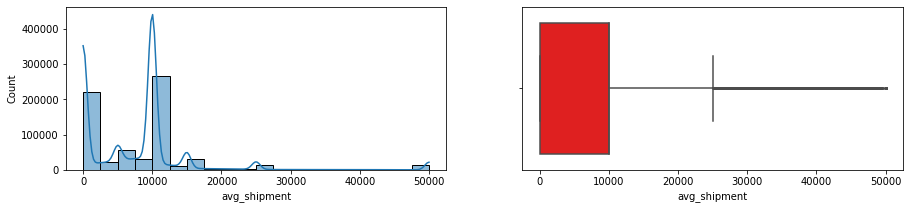

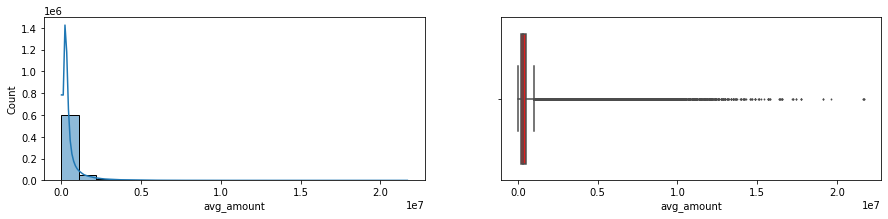

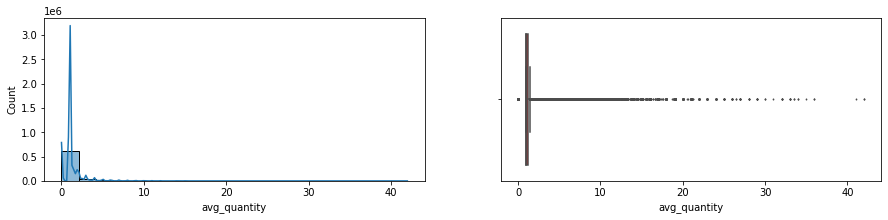

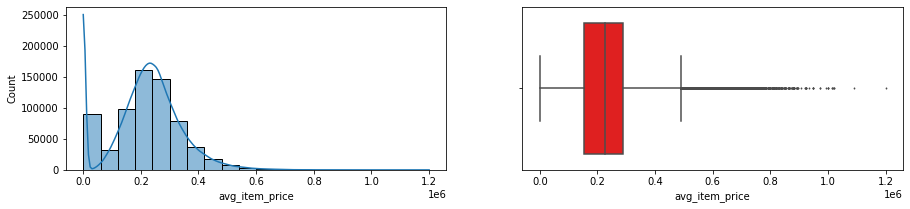

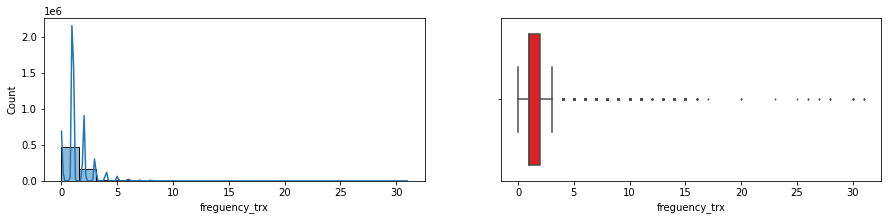

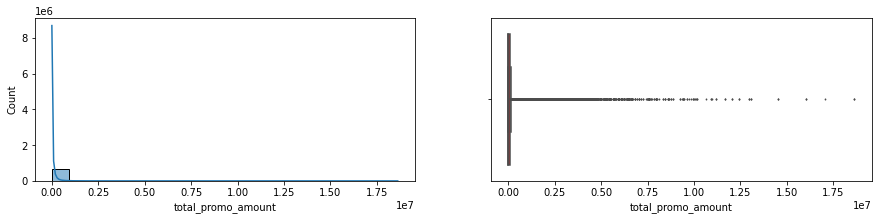

In [ ]:
# Check outlier

# Numerical Fitur 
# Tipe data yang berisi angka atau bilangan
num_col = ['avg_shipment', 'avg_amount', 'avg_quantity', 'avg_item_price', 'freguency_trx', 'total_promo_amount']

# Distribusi Numerical Fitur
for i in num_col:
    fig, axs = plt.subplots(1,2,figsize=(15, 3))
    
    sns.histplot(df_feature[i], bins=20, kde=True, ax=axs[0]);
    sns.boxplot(df_feature[i], ax=axs[1], color='red', fliersize=1);

In [ ]:
def distplot(feature, frame, color='r'):
    plt.figure(figsize=(8,3))
    plt.title("Distribution for {}".format(feature))
    ax = sns.distplot(frame[feature], color= color)

In [ ]:
# Check distribution

num_cols = df_final_2month.columns.to_list()
num_cols.remove('customer_id')
num_cols.remove('churn')
num_cols.remove('yearmonth_x')
num_cols.remove('yearmonth_y')
num_cols.remove('first_transaction')
num_cols.remove('last_transaction')
for feat in num_cols: distplot(feat, df_feature)

In [ ]:
# Make a backup

df_train = data_train.copy()
df_test = data_test.copy()

df_train = df_train.drop(['yearmonth_x', 'customer_id', 'yearmonth_y', 'first_transaction', 'last_transaction'], axis = 1, inplace = True)
df_test = df_test.drop(['yearmonth_x', 'customer_id', 'yearmonth_y', 'first_transaction', 'last_transaction'], axis = 1, inplace = True)

In [ ]:
data_train.drop(['yearmonth_x', 'customer_id', 'yearmonth_y', 'first_transaction', 'last_transaction'], axis = 1, inplace = True)
data_test.drop(['yearmonth_x', 'customer_id', 'yearmonth_y', 'first_transaction', 'last_transaction'], axis = 1, inplace = True)

In [ ]:
# Modelling without Normalization

# Data validation into split data

X_train = data_train.drop(['churn'],1)
y_train = data_train['churn']
X_test = data_test.drop(['churn'], 1)
y_test = data_test['churn']

In [ ]:
# Data normalize

scaler= StandardScaler()

X_train[num_cols] = scaler.fit_transform(X_train[num_cols])
X_test[num_cols] = scaler.transform(X_test[num_cols])

In [ ]:
# Baseline Model

#decision Tree model
dt_model = DecisionTreeClassifier()
clf = dt_model.fit(X_train,y_train)
predictdt_y = dt_model.predict(X_test)
accuracy_dt = dt_model.score(X_test,y_test)
print("Decision Tree accuracy is :",accuracy_dt)

Decision Tree accuracy is : 0.7237703086597083


In [ ]:
# Baseline Model

#decision Tree model
dt_model = DecisionTreeClassifier()
clf = dt_model.fit(X_train,y_train)
predictdt_y = dt_model.predict(X_test)
accuracy_dt = dt_model.score(X_test,y_test)
print("Decision Tree accuracy is :",accuracy_dt)

Decision Tree accuracy is : 0.721057167480609


In [ ]:
# Baseline Model

#decision Tree model
dt_model = DecisionTreeClassifier()
clf = dt_model.fit(X_train,y_train)
predictdt_y = dt_model.predict(X_test)
accuracy_dt = dt_model.score(X_test,y_test)
print("Decision Tree accuracy is :",accuracy_dt)

Decision Tree accuracy is : 0.7211529254045772


In [ ]:
# Decision Tree

# Hyperparameter Optimization
parameters = {'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10, 50], 
              'min_samples_split': [2, 3, 50, 100],
              'min_samples_leaf': [1, 5, 8, 10]
             }

# Run the grid search
grid_obj = GridSearchCV(clf, parameters)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
clf = grid_obj.best_estimator_

# Train the model using the training sets 
clf.fit(X_train, y_train)

# Prediction on test set
y_pred = clf.predict(X_test)

# Calculating the accuracy
acc_dt = round( metrics.accuracy_score(y_test, y_pred) * 100, 2 )
print( 'Accuracy of Decision Tree model : ', acc_dt )

Accuracy of Decision Tree model :  86.04


In [ ]:
parameter = grid_obj.best_estimator_.get_params()
pd.DataFrame.from_dict(parameter, orient='index')

,0
ccp_alpha,0.0
class_weight,None
criterion,entropy
max_depth,2
max_features,sqrt
max_leaf_nodes,None
min_impurity_decrease,0.0
min_samples_leaf,8
min_samples_split,50
min_weight_fraction_leaf,0.0


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.84      1.00      0.91     22746
           1       1.00      0.49      0.66      8583

    accuracy                           0.86     31329
   macro avg       0.92      0.75      0.79     31329
weighted avg       0.88      0.86      0.84     31329



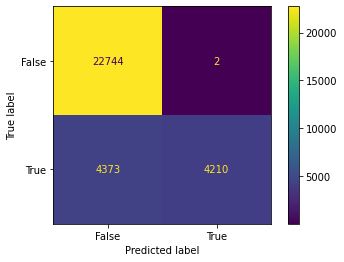

In [ ]:
actual = y_test
predicted = y_pred

confusion_matrix = metrics.confusion_matrix(actual, predicted)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

In [ ]:
# Creating the hyperparameter grid
hyperparameters = {'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10, 50], 
              'min_samples_split': [2, 3, 50, 100],
              'min_samples_leaf': [1, 5, 8, 10]
             }

# Instantiating Decision Tree classifier
tree = DecisionTreeClassifier()

# Instantiating RandomizedSearchCV object
model = RandomizedSearchCV(tree, hyperparameters, cv=5, random_state=42, scoring='recall')

dectree_hyper = prediction(X_train, y_train, X_test, y_test, model, model_name='decision tree_hyperparam')

In [ ]:
dectree_hyper['test']

{'model_name': 'decision tree_hyperparam',
 'recall': 0.7103576837935454,
 'precision': 0.4955701861334634,
 'roc_auc': 0.7187592516391449,
 'f1': 0.5838360624341665,
 'accuracy': 0.7225573749561109}

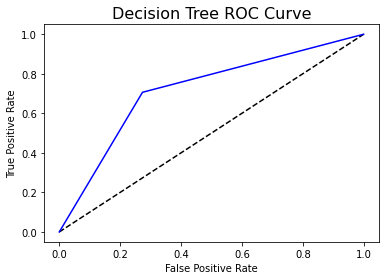

In [ ]:
#ROC
y_dtpred_prob = dt_model.predict_proba(X_test)[:,1]
fpr_dt, tpr_dt, thresholds = roc_curve(y_test, y_dtpred_prob)
plt.plot([0, 1], [0, 1], 'k--' )
plt.plot(fpr_dt, tpr_dt, label='Decision Tree',color = "b")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC Curve',fontsize=16)
plt.show();

In [ ]:
# AUC score

auc = metrics.roc_auc_score(y_test,predictdt_y)
print(auc)

0.7164565548634552


## **Feature Importance**

In [ ]:
transactions_test = transactions_test[transactions_test['payment_status'] == 'Success']

In [ ]:
# data aggregate

df_agg = transactions_test.groupby(['yearmonth','customer_id']).agg(
                            min_amount = pd.NamedAgg(column = 'total_amount', aggfunc=min),
                            max_amount = pd.NamedAgg(column = 'total_amount', aggfunc=max),
                            max_item_price = pd.NamedAgg(column = 'item_price', aggfunc=max),
                            avg_item_price = pd.NamedAgg(column = 'item_price', aggfunc='mean'),
                            min_item_price = pd.NamedAgg(column = 'item_price', aggfunc=min),
                            total_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=sum),
                            avg_amount = pd.NamedAgg(column = 'total_amount', aggfunc='mean'),

                            
                            min_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=min),
                            max_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=max),
                            avg_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc='mean'),
                            total_amount = pd.NamedAgg(column = 'total_amount', aggfunc=sum),
                            total_quantity = pd.NamedAgg(column = 'quantity', aggfunc=sum),
                            ).reset_index()

In [ ]:
# Numerical Fitur 
# Tipe data yang berisi angka atau bilangan
num_col = ['max_amount', 'min_amount', 'max_item_price', 'avg_item_price', 'min_item_price', 'total_shipment', 'avg_amount', 'total_amount', 'total_quantity']

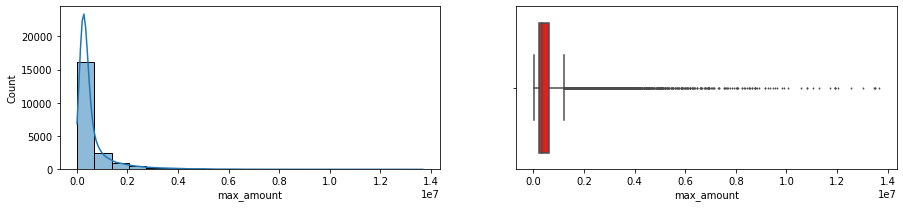

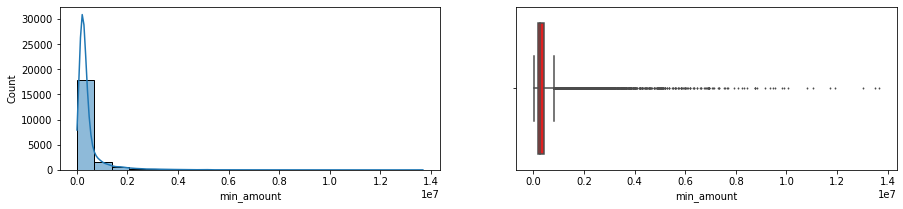

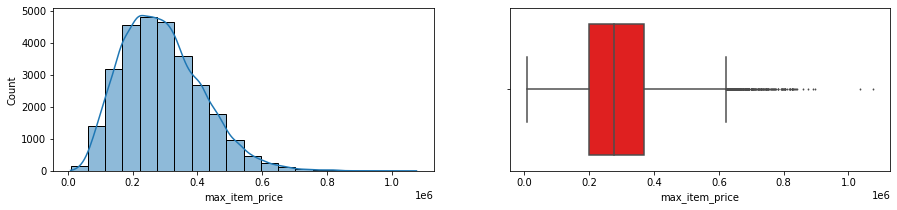

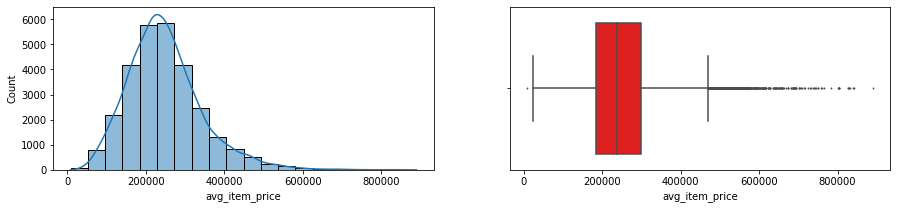

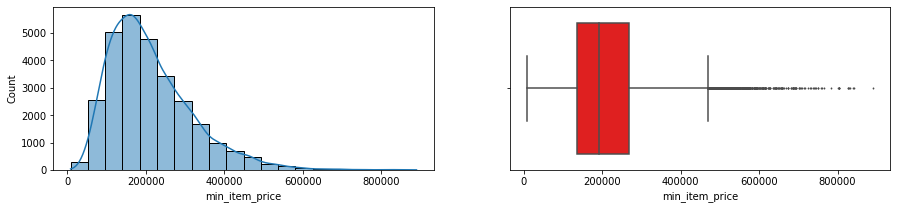

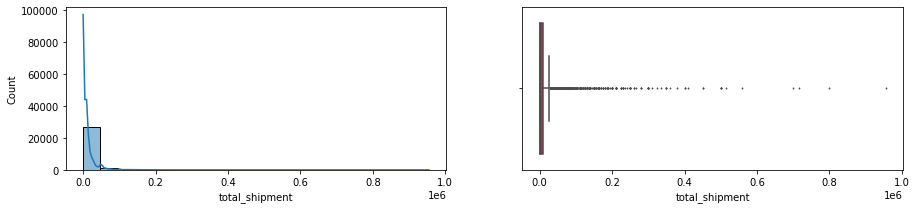

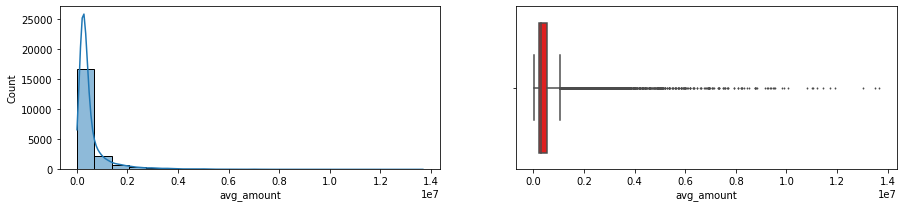

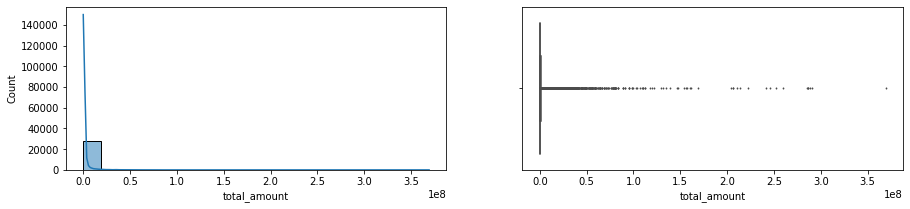

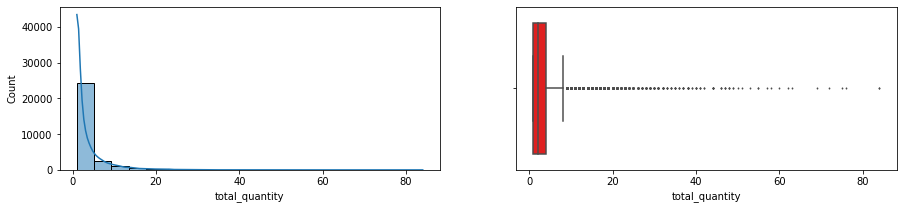

In [ ]:
# Distribusi Numerical Fitur
for i in num_col:
    fig, axs = plt.subplots(1,2,figsize=(15, 3))
    
    sns.histplot(df_agg[i], bins=20, kde=True, ax=axs[0]);
    sns.boxplot(df_agg[i], ax=axs[1], color='red', fliersize=1);

In [ ]:
# Handling Outliers
num_col_outliers = ['max_amount', 'min_amount', 'max_item_price', 'avg_item_price', 'min_item_price', 'total_shipment', 'avg_amount', 'total_amount', 'total_quantity']
for feature in num_col_outliers:
    q1 = df_agg[feature].quantile(0.25)
    q3 = df_agg[feature].quantile(0.75)
    IQR = q3 - q1
    lower_limit = q1 - (IQR*1.5)
    upper_limit = q3 + (IQR*1.5)
    df_agg.loc[df_agg[feature]<lower_limit, feature] = lower_limit
    df_agg.loc[df_agg[feature]>upper_limit, feature] = upper_limit

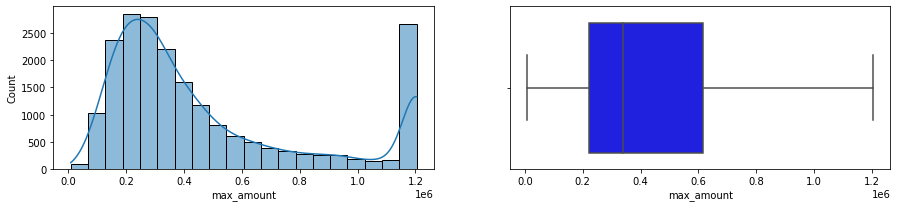

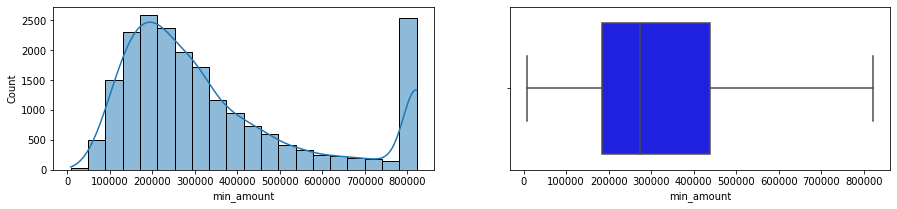

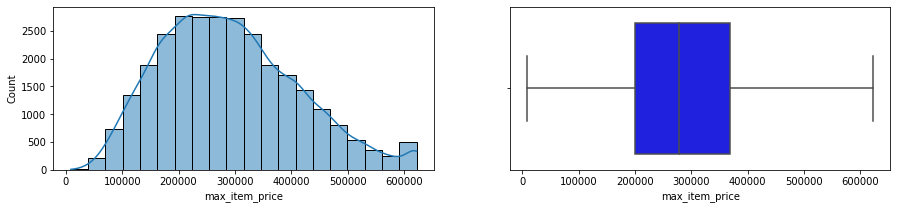

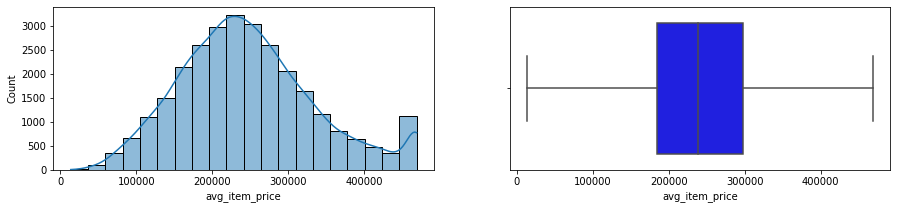

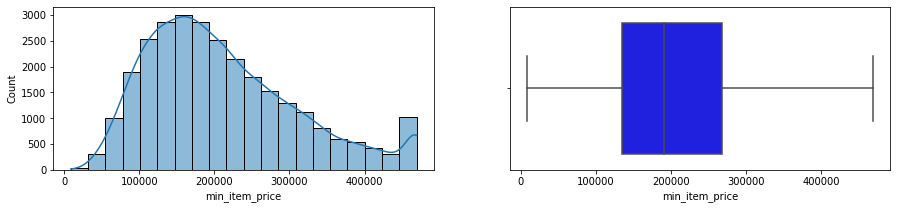

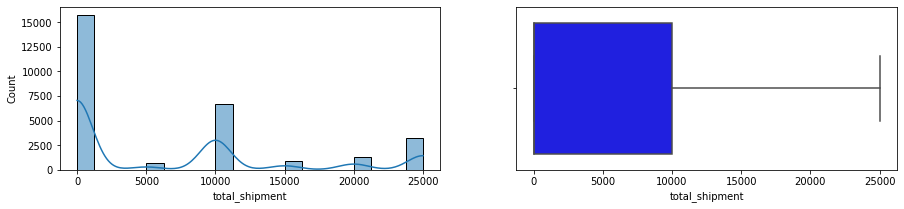

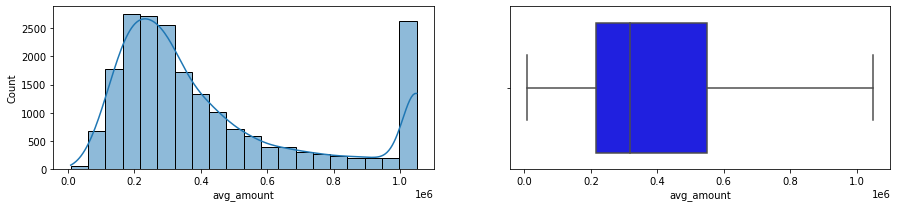

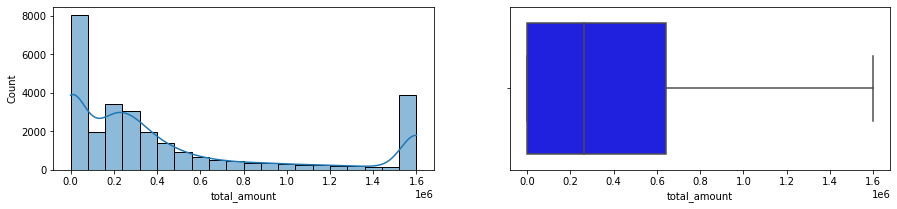

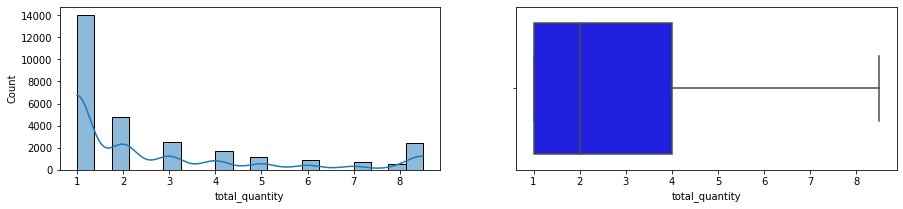

In [ ]:
num_col = ['max_amount', 'min_amount', 'max_item_price', 'avg_item_price', 'min_item_price', 'total_shipment', 'avg_amount', 'total_amount', 'total_quantity']

for i in num_col:
    fig, axs = plt.subplots(1,2,figsize=(15, 3))
    
    sns.histplot(df_agg[i], bins=20, kde=True, ax=axs[0]);
    sns.boxplot(df_agg[i], ax=axs[1], color='blue', fliersize=1);

In [ ]:
# #2016

# month1_2016 = df_agg[df_agg['yearmonth'].isin(['2016-05','2016-06'])]
# month2_2016 = df_agg[df_agg['yearmonth'].isin(['2016-07','2016-08'])]
# month3_2016 = df_agg[df_agg['yearmonth'].isin(['2016-09','2016-10'])]
# month4_2016 = df_agg[df_agg['yearmonth'].isin(['2016-11','2016-12'])]

# #2017

# month1_2017 = df_agg[df_agg['yearmonth'].isin(['2017-01','2017-02'])]
# month2_2017 = df_agg[df_agg['yearmonth'].isin(['2017-03','2017-04'])]
# month3_2017 = df_agg[df_agg['yearmonth'].isin(['2017-05','2017-06'])]
# month4_2017 = df_agg[df_agg['yearmonth'].isin(['2017-07','2017-08'])]
# month5_2017 = df_agg[df_agg['yearmonth'].isin(['2017-09','2017-10'])]
# month6_2017 = df_agg[df_agg['yearmonth'].isin(['2017-11','2017-12'])]

# #2018

# month1_2018 = df_agg[df_agg['yearmonth'].isin(['2018-01','2018-02'])]
# month2_2018 = df_agg[df_agg['yearmonth'].isin(['2018-03','2018-04'])]
# month3_2018 = df_agg[df_agg['yearmonth'].isin(['2018-05','2018-06'])]
# month4_2018 = df_agg[df_agg['yearmonth'].isin(['2018-07','2018-08'])]
# month5_2018 = df_agg[df_agg['yearmonth'].isin(['2018-09','2018-10'])]
# month6_2018 = df_agg[df_agg['yearmonth'].isin(['2018-11','2018-12'])]

# # 2019

# month1_2019 = df_agg[df_agg['yearmonth'].isin(['2019-01','2019-02'])]
# month2_2019 = df_agg[df_agg['yearmonth'].isin(['2019-03','2019-04'])]
# month3_2019 = df_agg[df_agg['yearmonth'].isin(['2019-05','2019-06'])]
# month4_2019 = df_agg[df_agg['yearmonth'].isin(['2019-07','2019-08'])]
# month5_2019 = df_agg[df_agg['yearmonth'].isin(['2019-09','2019-10'])]
# month6_2019 = df_agg[df_agg['yearmonth'].isin(['2019-11','2019-12'])]

#2020

month1_2020 = df_agg[df_agg['yearmonth'].isin(['2020-01','2020-02'])]
month2_2020 = df_agg[df_agg['yearmonth'].isin(['2020-03','2020-04'])]
month3_2020 = df_agg[df_agg['yearmonth'].isin(['2020-05','2020-06'])]
month4_2020 = df_agg[df_agg['yearmonth'].isin(['2020-07','2020-08'])]
month5_2020 = df_agg[df_agg['yearmonth'].isin(['2020-09','2020-10'])]
month6_2020 = df_agg[df_agg['yearmonth'].isin(['2020-11','2020-12'])]

#2021

month1_2021 = df_agg[df_agg['yearmonth'].isin(['2021-01','2021-02'])]
month2_2021 = df_agg[df_agg['yearmonth'].isin(['2021-03','2021-04'])]
month3_2021 = df_agg[df_agg['yearmonth'].isin(['2021-05','2021-06'])]
month4_2021 = df_agg[df_agg['yearmonth'].isin(['2021-07','2021-08'])]
month5_2021 = df_agg[df_agg['yearmonth'].isin(['2021-09','2021-10'])]
month6_2021 = df_agg[df_agg['yearmonth'].isin(['2021-11','2021-12'])]

#2022

month1_2022 = df_agg[df_agg['yearmonth'].isin(['2022-01','2022-02'])]
month2_2022 = df_agg[df_agg['yearmonth'].isin(['2022-03','2022-04'])]
month3_2022 = df_agg[df_agg['yearmonth'].isin(['2022-05','2022-06'])]
month4_2022 = df_agg[df_agg['yearmonth'].isin(['2022-07','2022-08'])]

In [ ]:
# # 2016

# #month1
# churn1_16 = month1_2016.merge(month2_2016[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn1_16.fillna(0, inplace = True)
# churn1_16['churn'] = churn1_16.apply(label, axis =1)
# churn2_16 = month2_2016.merge(month3_2016[['customer_id','yearmonth']], on='customer_id', how='outer')

# #month2
# churn2_16 = month2_2016.merge(month3_2016[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn2_16.fillna(0, inplace = True)
# churn2_16['churn'] = churn2_16.apply(label, axis =1)

# #month3
# churn3_16 = month3_2016.merge(month4_2016[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn3_16.fillna(0, inplace = True)
# churn3_16['churn'] = churn3_16.apply(label, axis =1)

# #2017

# #month1
# churn1_17 = month4_2016.merge(month1_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn1_17.fillna(0, inplace = True)
# churn1_17['churn'] = churn1_17.apply(label, axis =1)

# #month2
# churn2_17 = month1_2017.merge(month2_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn2_17.fillna(0, inplace = True)
# churn2_17['churn'] = churn2_17.apply(label, axis =1)

# #month3
# churn3_17 = month2_2017.merge(month3_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn3_17.fillna(0, inplace = True)
# churn3_17['churn'] = churn3_17.apply(label, axis =1)

# #month4
# churn4_17 = month3_2017.merge(month4_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn4_17.fillna(0, inplace = True)
# churn4_17['churn'] = churn4_17.apply(label, axis =1)

# #month5
# churn5_17 = month4_2017.merge(month5_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn5_17.fillna(0, inplace = True)
# churn5_17['churn'] = churn5_17.apply(label, axis =1)

# #month6
# churn6_17 = month5_2017.merge(month6_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn6_17.fillna(0, inplace = True)
# churn6_17['churn'] = churn6_17.apply(label, axis =1)

# # 2018

# #month1
# churn1_18 = month6_2017.merge(month1_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn1_18.fillna(0, inplace = True)
# churn1_18['churn'] = churn1_18.apply(label, axis =1)

# #month2
# churn2_18 = month1_2018.merge(month2_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn2_18.fillna(0, inplace = True)
# churn2_18['churn'] = churn2_18.apply(label, axis =1)

# #month3
# churn3_18 = month2_2018.merge(month3_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn3_18.fillna(0, inplace = True)
# churn3_18['churn'] = churn3_18.apply(label, axis =1)

# #month4
# churn4_18 = month3_2018.merge(month4_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn4_18.fillna(0, inplace = True)
# churn4_18['churn'] = churn4_18.apply(label, axis =1)

# #month5
# churn5_18 = month4_2018.merge(month5_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn5_18.fillna(0, inplace = True)
# churn5_18['churn'] = churn5_18.apply(label, axis =1)

# #month6
# churn6_18 = month5_2018.merge(month6_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn6_18.fillna(0, inplace = True)
# churn6_18['churn'] = churn6_18.apply(label, axis =1)

# # 2019

# #month1
# churn1_19 = month6_2018.merge(month1_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn1_19.fillna(0, inplace = True)
# churn1_19['churn'] = churn1_19.apply(label, axis =1)

# #month2
# churn2_19 = month1_2019.merge(month2_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn2_19.fillna(0, inplace = True)
# churn2_19['churn'] = churn2_19.apply(label, axis =1)

# #month3
# churn3_19 = month2_2019.merge(month3_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn3_19.fillna(0, inplace = True)
# churn3_19['churn'] = churn3_19.apply(label, axis =1)

# #month4
# churn4_19 = month3_2019.merge(month4_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn4_19.fillna(0, inplace = True)
# churn4_19['churn'] = churn4_19.apply(label, axis =1)

# #month5
# churn5_19 = month4_2019.merge(month5_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn5_19.fillna(0, inplace = True)
# churn5_19['churn'] = churn5_19.apply(label, axis =1)

# #month6
# churn6_19 = month5_2019.merge(month6_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn6_19.fillna(0, inplace = True)
# churn6_19['churn'] = churn6_19.apply(label, axis =1)

# 2020

#month1
# churn1_20 = month6_2019.merge(month1_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn1_20.fillna(0, inplace = True)
# churn1_20['churn'] = churn1_20.apply(label, axis =1)

#month2
# churn2_20 = month1_2020.merge(month2_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn2_20.fillna(0, inplace = True)
# churn2_20['churn'] = churn2_20.apply(label, axis =1)

#month3
churn3_20 = month2_2020.merge(month3_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
churn3_20.fillna(0, inplace = True)
churn3_20['churn'] = churn3_20.apply(label, axis =1)

#month4
churn4_20 = month3_2020.merge(month4_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
churn4_20.fillna(0, inplace = True)
churn4_20['churn'] = churn4_20.apply(label, axis =1)

#month5
churn5_20 = month4_2020.merge(month5_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
churn5_20.fillna(0, inplace = True)
churn5_20['churn'] = churn5_20.apply(label, axis =1)

#month6
churn6_20 = month5_2020.merge(month6_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
churn6_20.fillna(0, inplace = True)
churn6_20['churn'] = churn6_20.apply(label, axis =1)

# 2021

#month1
churn1_21 = month6_2020.merge(month1_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1_21.fillna(0, inplace = True)
churn1_21['churn'] = churn1_21.apply(label, axis =1)

#month2
churn2_21 = month1_2021.merge(month2_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn2_21.fillna(0, inplace = True)
churn2_21['churn'] = churn2_21.apply(label, axis =1)

#month3
churn3_21 = month2_2021.merge(month3_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn3_21.fillna(0, inplace = True)
churn3_21['churn'] = churn3_21.apply(label, axis =1)

#month4
churn4_21 = month3_2021.merge(month4_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn4_21.fillna(0, inplace = True)
churn4_21['churn'] = churn4_21.apply(label, axis =1)

#month5
churn5_21 = month4_2021.merge(month5_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn5_21.fillna(0, inplace = True)
churn5_21['churn'] = churn5_21.apply(label, axis =1)

#month6
churn6_21 = month5_2021.merge(month6_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn6_21.fillna(0, inplace = True)
churn6_21['churn'] = churn6_21.apply(label, axis =1)

# 2022

#month1
churn1_22 = month6_2021.merge(month1_2022[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1_22.fillna(0, inplace = True)
churn1_22['churn'] = churn1_22.apply(label, axis =1)

#month2
churn2_22 = month1_2022.merge(month2_2022[['customer_id','yearmonth']], on='customer_id', how='outer')
churn2_22.fillna(0, inplace = True)
churn2_22['churn'] = churn2_22.apply(label, axis =1)

#month3
churn3_22 = month2_2022.merge(month3_2022[['customer_id','yearmonth']], on='customer_id', how='outer')
churn3_22.fillna(0, inplace = True)
churn3_22['churn'] = churn3_22.apply(label, axis =1)

#month4
churn4_22 = month3_2022.merge(month4_2022[['customer_id','yearmonth']], on='customer_id', how='outer')
churn4_22.fillna(0, inplace = True)
churn4_22['churn'] = churn4_22.apply(label, axis =1)

In [ ]:
# dataset2016_2month = pd.concat([churn1_16,churn2_16,churn3_16])
# dataset2017_2month = pd.concat([churn1_17,churn2_17,churn3_17,churn4_17,churn5_17,churn6_17])
# dataset2018_2month = pd.concat([churn1_18,churn2_18,churn3_18,churn4_18,churn5_18,churn6_18])
# dataset2019_2month = pd.concat([churn1_19,churn2_19,churn3_19,churn4_19,churn5_19,churn6_19])
# dataset2020_2month = pd.concat([churn1_20,churn2_20,churn3_20,churn4_20,churn5_20,churn6_20])
# dataset2021_2month = pd.concat([churn1_21,churn2_21,churn3_21,churn4_21,churn5_21,churn6_21])
# dataset2022_2month = pd.concat([churn1_22,churn2_22,churn3_22,churn4_22])

dataset2020_2month = pd.concat([churn3_20,churn4_20,churn5_20,churn6_20])
dataset2021_2month = pd.concat([churn1_21,churn2_21,churn3_21,churn4_21,churn5_21,churn6_21])
dataset2022_2month = pd.concat([churn1_22,churn2_22,churn3_22,churn4_22])

In [ ]:
# df_final_2month = pd.concat([dataset2016_2month,dataset2017_2month,dataset2018_2month,dataset2019_2month,dataset2020_2month,dataset2021_2month,dataset2022_2month])
df_final_2month = pd.concat([dataset2020_2month,dataset2021_2month,dataset2022_2month])

Modelling

In [ ]:
# Make a dataset for split data

df_split = df_final_2month.copy()
df_split.drop(['yearmonth_x', 'customer_id', 'yearmonth_y'], axis = 1, inplace = True)

In [ ]:
#split data into traning and testing

#y = target variabel
#x = variable predictor

#separate data from target variabel
y = df_split.pop('churn')
X = df_split

#split data
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size= 0.8, random_state=50)

In [ ]:
# Baseline Model

#decision Tree model
dt_model = DecisionTreeClassifier()
clf = dt_model.fit(X_train,y_train)
predictdt_y = dt_model.predict(X_test)
accuracy_dt = dt_model.score(X_test,y_test)
print("Decision Tree accuracy is :",accuracy_dt)

Decision Tree accuracy is : 0.8466040351147389


In [ ]:
# Baseline Model
# Use Handling Outlier

#decision Tree model
dt_model = DecisionTreeClassifier()
clf = dt_model.fit(X_train,y_train)
predictdt_y = dt_model.predict(X_test)
accuracy_dt = dt_model.score(X_test,y_test)
print("Decision Tree accuracy is :",accuracy_dt)

Decision Tree accuracy is : 0.8452179269983059


In [ ]:
# Baseline Model
# Success Transaction

#decision Tree model
dt_model = DecisionTreeClassifier()
clf = dt_model.fit(X_train,y_train)
predictdt_y = dt_model.predict(X_test)
accuracy_dt = dt_model.score(X_test,y_test)
print("Decision Tree accuracy is :",accuracy_dt)

Decision Tree accuracy is : 0.8370571337376317


In [ ]:
# Decision Tree

# Hyperparameter Optimization
parameters = {'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10, 50], 
              'min_samples_split': [2, 3, 50, 100],
              'min_samples_leaf': [1, 5, 8, 10]
             }

# Run the grid search
grid_obj = GridSearchCV(clf, parameters)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
clf = grid_obj.best_estimator_

# Train the model using the training sets 
clf.fit(X_train, y_train)

# Prediction on test set
y_pred = clf.predict(X_test)

# Calculating the accuracy
acc_dt = round( metrics.accuracy_score(y_test, y_pred) * 100, 2 )
print( 'Accuracy of Decision Tree model : ', acc_dt )

Accuracy of Decision Tree model :  86.79


In [ ]:
# Decision Tree
# Use Handling Outlier

# Hyperparameter Optimization
parameters = {'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10, 50], 
              'min_samples_split': [2, 3, 50, 100],
              'min_samples_leaf': [1, 5, 8, 10]
             }

# Run the grid search
grid_obj = GridSearchCV(clf, parameters)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
clf = grid_obj.best_estimator_

# Train the model using the training sets 
clf.fit(X_train, y_train)

# Prediction on test set
y_pred = clf.predict(X_test)

# Calculating the accuracy
acc_dt = round( metrics.accuracy_score(y_test, y_pred) * 100, 2 )
print( 'Accuracy of Decision Tree model : ', acc_dt )

Accuracy of Decision Tree model :  86.77


In [ ]:
# Decision Tree
# Success

# Hyperparameter Optimization
parameters = {'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10, 50], 
              'min_samples_split': [2, 3, 50, 100],
              'min_samples_leaf': [1, 5, 8, 10]
             }

# Run the grid search
grid_obj = GridSearchCV(clf, parameters)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
clf = grid_obj.best_estimator_

# Train the model using the training sets 
clf.fit(X_train, y_train)

# Prediction on test set
y_pred = clf.predict(X_test)

# Calculating the accuracy
acc_dt = round( metrics.accuracy_score(y_test, y_pred) * 100, 2 )
print( 'Accuracy of Decision Tree model : ', acc_dt )

Accuracy of Decision Tree model :  86.08


In [ ]:
print('Best algorithm:', grid_obj.best_estimator_.get_params())

Best algorithm: {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 5, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': None, 'splitter': 'best'}


In [ ]:
parameter = grid_obj.best_estimator_.get_params()
type(parameter)

dict

In [ ]:
pd.DataFrame.from_dict(parameter, orient='index')

,0
ccp_alpha,0.0
class_weight,None
criterion,entropy
max_depth,5
max_features,sqrt
max_leaf_nodes,None
min_impurity_decrease,0.0
min_samples_leaf,1
min_samples_split,2
min_weight_fraction_leaf,0.0


In [ ]:
print(classification_report(y_test, predictdt_y))

              precision    recall  f1-score   support

           0       0.88      0.91      0.90      4783
           1       0.73      0.66      0.69      1710

    accuracy                           0.85      6493
   macro avg       0.81      0.79      0.80      6493
weighted avg       0.84      0.85      0.84      6493



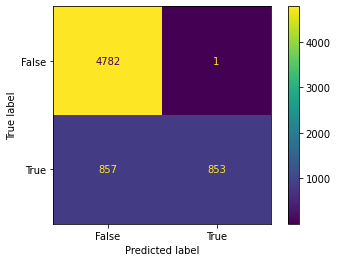

In [ ]:
actual = y_test
predicted = y_pred

confusion_matrix = metrics.confusion_matrix(actual, predicted)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

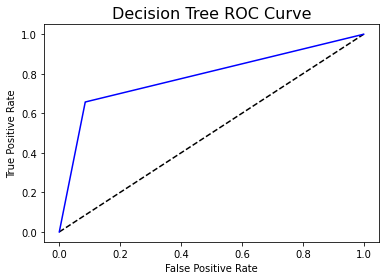

In [ ]:
#ROC
y_dtpred_prob = dt_model.predict_proba(X_test)[:,1]
fpr_dt, tpr_dt, thresholds = roc_curve(y_test, y_dtpred_prob)
plt.plot([0, 1], [0, 1], 'k--' )
plt.plot(fpr_dt, tpr_dt, label='Decision Tree',color = "b")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC Curve',fontsize=16)
plt.show();

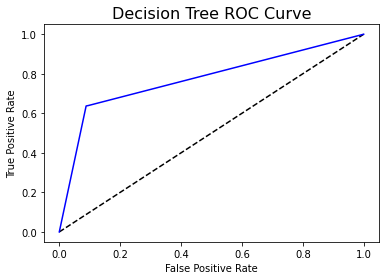

In [ ]:
# ROC
# Success
y_dtpred_prob = dt_model.predict_proba(X_test)[:,1]
fpr_dt, tpr_dt, thresholds = roc_curve(y_test, y_dtpred_prob)
plt.plot([0, 1], [0, 1], 'k--' )
plt.plot(fpr_dt, tpr_dt, label='Decision Tree',color = "b")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC Curve',fontsize=16)
plt.show();

In [ ]:
# AUC score

auc = metrics.roc_auc_score(y_test,predictdt_y)
print(auc)

0.7857948411344761


In [ ]:
# AUC score
# Success

auc = metrics.roc_auc_score(y_test,predictdt_y)
print(auc)

0.7744057902618207


## **Feature Real**

In [ ]:
# Read Dataset use Google Drive

click_stream_test = pd.read_csv('gdrive/My Drive/Mockup Dataset/click_stream_test.csv')

In [ ]:
#Slicing click stream by event_name

# homepage
homepage = click_stream_test[(click_stream_test['event_name'] == 'HOMEPAGE')]
homepage = homepage.groupby('session_id')['event_name'].count()
homepage = homepage.to_frame().rename(columns={"event_name": "homepage"}).reset_index()

# scroll
scroll = click_stream_test[(click_stream_test['event_name'] == 'SCROLL')]
scroll = scroll.groupby('session_id')['event_name'].count()
scroll = scroll.to_frame().rename(columns={"event_name": "scroll"}).reset_index()

# click
click = click_stream_test[(click_stream_test['event_name'] == 'CLICK')]
click = click.groupby('session_id')['event_name'].count()
click = click.to_frame().rename(columns={"event_name": "click"}).reset_index()

# item_detail
item_detail = click_stream_test[(click_stream_test['event_name'] == 'ITEM_DETAIL')]
item_detail = item_detail.groupby('session_id')['event_name'].count()
item_detail = item_detail.to_frame().rename(columns={"event_name": "item_detail"}).reset_index()

# promo_page
promo_page = click_stream_test[(click_stream_test['event_name'] == 'PROMO_PAGE')]
promo_page = promo_page.groupby('session_id')['event_name'].count()
promo_page = promo_page.to_frame().rename(columns={"event_name": "promo_page"}).reset_index()

# search
search = click_stream_test[(click_stream_test['event_name'] == 'SEARCH')]
search = search.groupby('session_id')['event_name'].count()
search = search.to_frame().rename(columns={"event_name": "search"}).reset_index()

# add_to_cart
add_to_cart = click_stream_test[(click_stream_test['event_name'] == 'ADD_TO_CART')]
add_to_cart = add_to_cart.groupby('session_id')['event_name'].count()
add_to_cart = add_to_cart.to_frame().rename(columns={"event_name": "add_to_cart"}).reset_index()

# add_promo
add_promo = click_stream_test[(click_stream_test['event_name'] == 'ADD_PROMO')]
add_promo = add_promo.groupby('session_id')['event_name'].count()
add_promo = add_promo.to_frame().rename(columns={"event_name": "add_promo"}).reset_index()

# Slicing click_stream_test by traffic_source

# web
web = click_stream_test[(click_stream_test['traffic_source'] == 'WEB')]
web = web.groupby('session_id')['traffic_source'].count()
web = web.to_frame().rename(columns={"traffic_source": "web"}).reset_index()

# mobile
mobile = click_stream_test[(click_stream_test['traffic_source'] == 'MOBILE')]
mobile = mobile.groupby('session_id')['traffic_source'].count()
mobile = mobile.to_frame().rename(columns={"traffic_source": "mobile"}).reset_index()

In [ ]:
# merge all table 

stream = click_stream_test[['session_id', 'event_time']].merge(homepage, on='session_id', how='left')
stream = stream.merge(scroll, on='session_id', how='left')
stream = stream.merge(click, on='session_id', how='left')
stream = stream.merge(item_detail, on='session_id', how='left')
stream = stream.merge(promo_page, on='session_id', how='left')
stream = stream.merge(search, on='session_id', how='left')
stream = stream.merge(add_to_cart, on='session_id', how='left')
stream = stream.merge(add_promo, on='session_id', how='left')
stream = stream.merge(web, on='session_id', how='left')
stream = stream.merge(mobile, on='session_id', how='left')

stream.head()

,session_id,event_time,homepage,scroll,click,item_detail,promo_page,search,add_to_cart,add_promo,web,mobile
0,9cf42322-8c48-4be8-9c8b-3926fa59c18d,2017-04-25T10:05:01.207986Z,1,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,3.0
1,9cf42322-8c48-4be8-9c8b-3926fa59c18d,2017-04-25T10:08:53.207986Z,1,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,3.0
2,9cf42322-8c48-4be8-9c8b-3926fa59c18d,2017-04-25T10:13:41.207986Z,1,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,3.0
3,9cf42322-8c48-4be8-9c8b-3926fa59c18d,2017-04-25T10:18:27.207986Z,1,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,3.0
4,10f0f55c-7094-4f1c-9399-919d7da49200,2017-03-04T07:14:38.454713Z,3,NaN,1.0,NaN,1.0,2.0,1.0,1.0,9.0,NaN


In [ ]:
success = transactions_test[transactions_test['payment_status'] == 'Success'][['session_id', 'created_at', 'customer_id', 'booking_id', 'promo_amount', 'shipment_fee', 'total_amount', 'product_id', 'quantity', 'item_price']]

df_feature_test = success.merge(stream, on='session_id', how='left')
df_feature_test.head()

,session_id,created_at,customer_id,booking_id,promo_amount,shipment_fee,total_amount,product_id,quantity,item_price,event_time,homepage,scroll,click,item_detail,promo_page,search,add_to_cart,add_promo,web,mobile
0,90acade1-9dbb-464b-82a9-f9332625d225,2017-02-01 23:06:50.716201,104555,97df3fe2-3efc-429a-aff6-ccecf5306c31,3443,0.0,758102.0,55170,1,246915,2017-02-01T22:18:40.174669Z,3.0,1.0,1.0,1.0,NaN,NaN,5.0,1.0,11.0,NaN
1,90acade1-9dbb-464b-82a9-f9332625d225,2017-02-01 23:06:50.716201,104555,97df3fe2-3efc-429a-aff6-ccecf5306c31,3443,0.0,758102.0,55170,1,246915,2017-02-01T22:22:31.174669Z,3.0,1.0,1.0,1.0,NaN,NaN,5.0,1.0,11.0,NaN
2,90acade1-9dbb-464b-82a9-f9332625d225,2017-02-01 23:06:50.716201,104555,97df3fe2-3efc-429a-aff6-ccecf5306c31,3443,0.0,758102.0,55170,1,246915,2017-02-01T22:26:47.174669Z,3.0,1.0,1.0,1.0,NaN,NaN,5.0,1.0,11.0,NaN
3,90acade1-9dbb-464b-82a9-f9332625d225,2017-02-01 23:06:50.716201,104555,97df3fe2-3efc-429a-aff6-ccecf5306c31,3443,0.0,758102.0,55170,1,246915,2017-02-01T22:30:32.174669Z,3.0,1.0,1.0,1.0,NaN,NaN,5.0,1.0,11.0,NaN
4,90acade1-9dbb-464b-82a9-f9332625d225,2017-02-01 23:06:50.716201,104555,97df3fe2-3efc-429a-aff6-ccecf5306c31,3443,0.0,758102.0,55170,1,246915,2017-02-01T22:35:03.174669Z,3.0,1.0,1.0,1.0,NaN,NaN,5.0,1.0,11.0,NaN


In [ ]:
df_feature_test.to_csv('gdrive/My Drive/Mockup Dataset/feature_test.csv', index=False)

In [ ]:
# Read Dataset use Google Drive

df_feature = pd.read_csv('gdrive/My Drive/Mockup Dataset/feature_test.csv')

In [ ]:
# Change data type of feature 'created-at'

df_feature['created_at'] = df_feature['created_at'].astype('datetime64')

In [ ]:
# Get yearmonth
df_feature['yearmonth'] = df_feature['created_at'].dt.strftime('%Y-%m')

In [ ]:
# data aggregate

df_agg = df_feature.groupby(['yearmonth','customer_id']).agg(
                            total_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=sum),
                            min_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=min),
                            max_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc=max),
                            avg_shipment = pd.NamedAgg(column = 'shipment_fee', aggfunc='mean'),

                            total_amount = pd.NamedAgg(column = 'total_amount', aggfunc=sum),
                            min_amount = pd.NamedAgg(column = 'total_amount', aggfunc=min),
                            max_amount = pd.NamedAgg(column = 'total_amount', aggfunc=max),
                            avg_amount = pd.NamedAgg(column = 'total_amount', aggfunc='mean'),

                            total_quantity = pd.NamedAgg(column = 'quantity', aggfunc=sum),
                            min_quantity = pd.NamedAgg(column = 'quantity', aggfunc=min),
                            max_quantity = pd.NamedAgg(column = 'quantity', aggfunc=max),
                            avg_quantity = pd.NamedAgg(column = 'quantity', aggfunc='mean'),

                            min_item_price = pd.NamedAgg(column = 'item_price', aggfunc=min),
                            max_item_price = pd.NamedAgg(column = 'item_price', aggfunc=max),
                            avg_item_price = pd.NamedAgg(column = 'item_price', aggfunc='mean'),
                            
                            freguency_trx = pd.NamedAgg(column = 'booking_id', aggfunc='nunique'),
                            total_unique_product = pd.NamedAgg(column = 'product_id', aggfunc='nunique'),
                            first_transaction = pd.NamedAgg(column = 'created_at', aggfunc=min),
                            last_transaction = pd.NamedAgg(column = 'created_at', aggfunc=max),
                            total_promo_amount = pd.NamedAgg(column = 'promo_amount', aggfunc=sum),
                            total_promo_code = pd.NamedAgg(column = 'promo_amount', aggfunc='nunique'),

                            avg_homepage = pd.NamedAgg(column = 'homepage', aggfunc='mean'),
                            avg_scroll = pd.NamedAgg(column = 'scroll', aggfunc='mean'),
                            avg_click = pd.NamedAgg(column = 'click', aggfunc='mean'),
                            item_detail = pd.NamedAgg(column = 'item_detail', aggfunc='mean'),
                            avg_promo_page = pd.NamedAgg(column = 'promo_page', aggfunc='mean'),
                            avg_search = pd.NamedAgg(column = 'search', aggfunc='mean'),
                            avg_add_to_cart = pd.NamedAgg(column = 'add_to_cart', aggfunc='mean'),
                            avg_add_promo = pd.NamedAgg(column = 'add_promo', aggfunc='mean'),

                            avg_web = pd.NamedAgg(column = 'web', aggfunc='mean'),
                            avg_mobile = pd.NamedAgg(column = 'mobile', aggfunc='mean')

                            ).reset_index()

In [ ]:
# Numerical Fitur 
# Tipe data yang berisi angka atau bilangan
num_col = ['avg_shipment', 'avg_amount', 'avg_quantity', 'avg_item_price', 'freguency_trx', 'total_promo_amount']

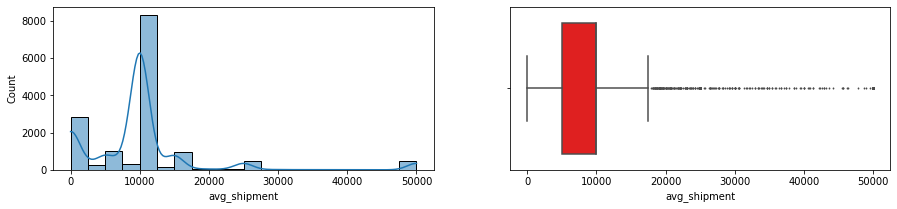

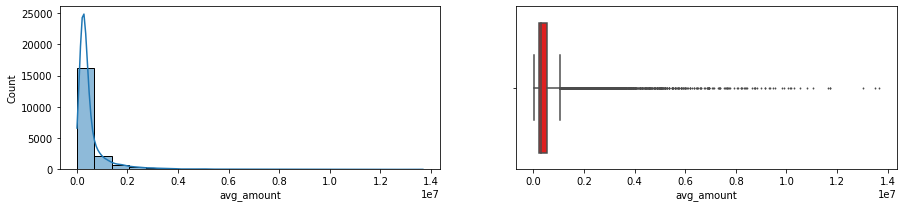

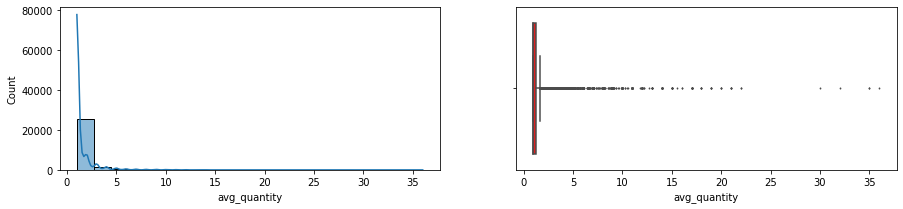

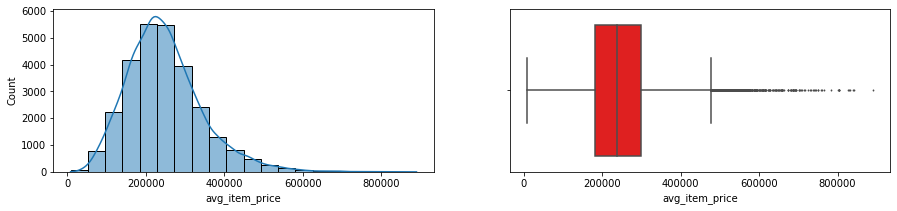

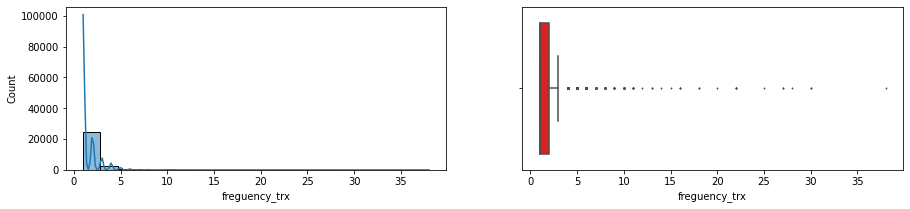

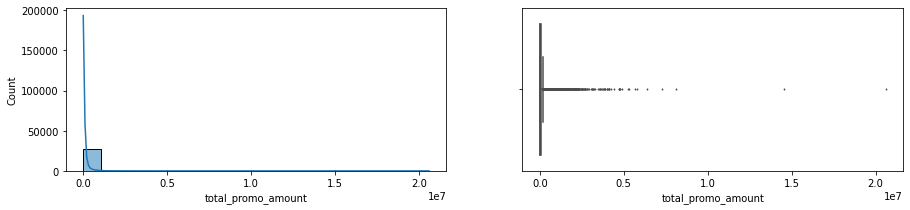

In [ ]:
# Distribusi Numerical Fitur
for i in num_col:
    fig, axs = plt.subplots(1,2,figsize=(15, 3))
    
    sns.histplot(df_agg[i], bins=20, kde=True, ax=axs[0]);
    sns.boxplot(df_agg[i], ax=axs[1], color='red', fliersize=1);

In [ ]:
# Handling Outliers
num_col_outliers = ['avg_shipment', 'avg_amount', 'avg_quantity', 'avg_item_price', 'freguency_trx', 'total_promo_amount']
for feature in num_col_outliers:
    q1 = df_agg[feature].quantile(0.25)
    q3 = df_agg[feature].quantile(0.75)
    IQR = q3 - q1
    lower_limit = q1 - (IQR*1.5)
    upper_limit = q3 + (IQR*1.5)
    df_agg.loc[df_agg[feature]<lower_limit, feature] = lower_limit
    df_agg.loc[df_agg[feature]>upper_limit, feature] = upper_limit

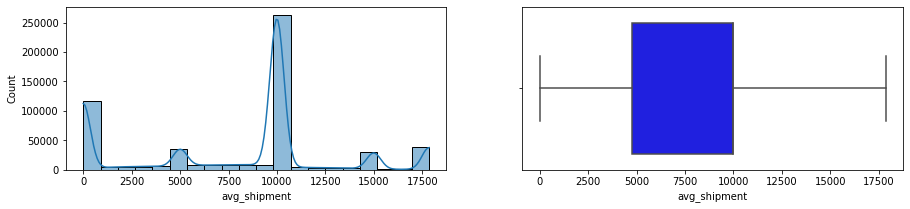

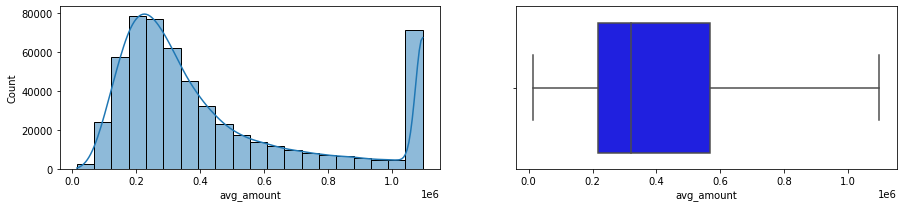

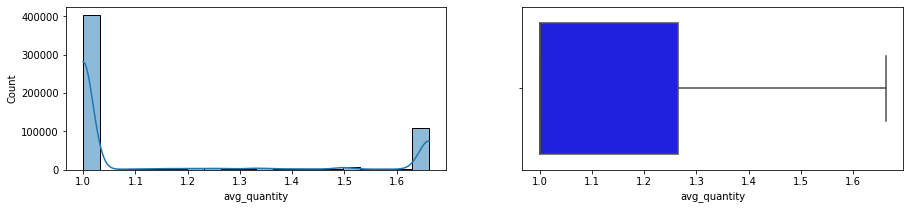

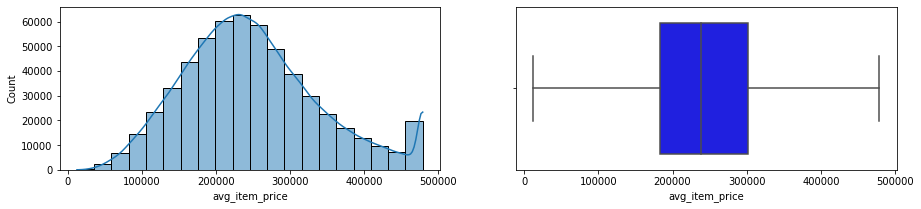

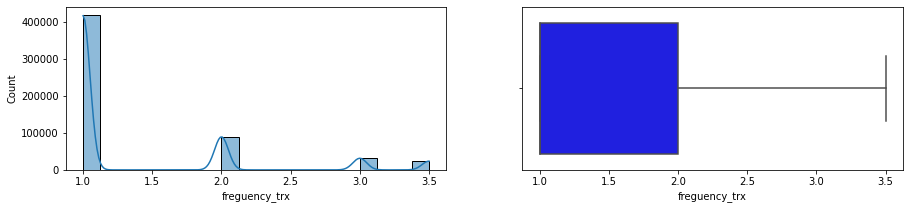

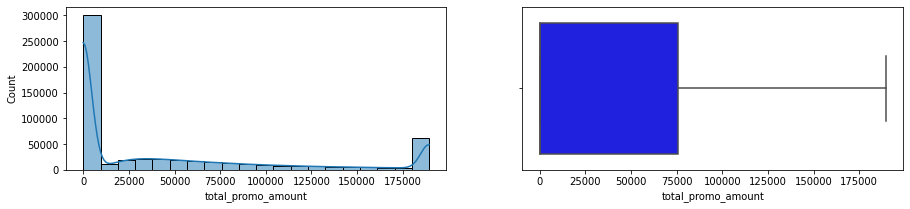

In [ ]:
num_col = ['avg_shipment', 'avg_amount', 'avg_quantity', 'avg_item_price', 'freguency_trx', 'total_promo_amount']

for i in num_col:
    fig, axs = plt.subplots(1,2,figsize=(15, 3))
    
    sns.histplot(df_agg[i], bins=20, kde=True, ax=axs[0]);
    sns.boxplot(df_agg[i], ax=axs[1], color='blue', fliersize=1);

In [ ]:
df_agg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27742 entries, 0 to 27741
Data columns (total 33 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   yearmonth             27742 non-null  object        
 1   customer_id           27742 non-null  int64         
 2   total_shipment        27742 non-null  float64       
 3   min_shipment          14992 non-null  float64       
 4   max_shipment          14992 non-null  float64       
 5   avg_shipment          14992 non-null  float64       
 6   total_amount          27742 non-null  float64       
 7   min_amount            20058 non-null  float64       
 8   max_amount            20058 non-null  float64       
 9   avg_amount            20058 non-null  float64       
 10  total_quantity        27742 non-null  int64         
 11  min_quantity          27742 non-null  int64         
 12  max_quantity          27742 non-null  int64         
 13  avg_quantity    

In [ ]:
# #2016

# month1_2016 = df_agg[df_agg['yearmonth'].isin(['2016-05','2016-06'])]
# month2_2016 = df_agg[df_agg['yearmonth'].isin(['2016-07','2016-08'])]
# month3_2016 = df_agg[df_agg['yearmonth'].isin(['2016-09','2016-10'])]
# month4_2016 = df_agg[df_agg['yearmonth'].isin(['2016-11','2016-12'])]

# #2017

# month1_2017 = df_agg[df_agg['yearmonth'].isin(['2017-01','2017-02'])]
# month2_2017 = df_agg[df_agg['yearmonth'].isin(['2017-03','2017-04'])]
# month3_2017 = df_agg[df_agg['yearmonth'].isin(['2017-05','2017-06'])]
# month4_2017 = df_agg[df_agg['yearmonth'].isin(['2017-07','2017-08'])]
# month5_2017 = df_agg[df_agg['yearmonth'].isin(['2017-09','2017-10'])]
# month6_2017 = df_agg[df_agg['yearmonth'].isin(['2017-11','2017-12'])]

# #2018

# month1_2018 = df_agg[df_agg['yearmonth'].isin(['2018-01','2018-02'])]
# month2_2018 = df_agg[df_agg['yearmonth'].isin(['2018-03','2018-04'])]
# month3_2018 = df_agg[df_agg['yearmonth'].isin(['2018-05','2018-06'])]
# month4_2018 = df_agg[df_agg['yearmonth'].isin(['2018-07','2018-08'])]
# month5_2018 = df_agg[df_agg['yearmonth'].isin(['2018-09','2018-10'])]
# month6_2018 = df_agg[df_agg['yearmonth'].isin(['2018-11','2018-12'])]

# # 2019

# month1_2019 = df_agg[df_agg['yearmonth'].isin(['2019-01','2019-02'])]
# month2_2019 = df_agg[df_agg['yearmonth'].isin(['2019-03','2019-04'])]
# month3_2019 = df_agg[df_agg['yearmonth'].isin(['2019-05','2019-06'])]
# month4_2019 = df_agg[df_agg['yearmonth'].isin(['2019-07','2019-08'])]
# month5_2019 = df_agg[df_agg['yearmonth'].isin(['2019-09','2019-10'])]
# month6_2019 = df_agg[df_agg['yearmonth'].isin(['2019-11','2019-12'])]

#2020

month1_2020 = df_agg[df_agg['yearmonth'].isin(['2020-01','2020-02'])]
month2_2020 = df_agg[df_agg['yearmonth'].isin(['2020-03','2020-04'])]
month3_2020 = df_agg[df_agg['yearmonth'].isin(['2020-05','2020-06'])]
month4_2020 = df_agg[df_agg['yearmonth'].isin(['2020-07','2020-08'])]
month5_2020 = df_agg[df_agg['yearmonth'].isin(['2020-09','2020-10'])]
month6_2020 = df_agg[df_agg['yearmonth'].isin(['2020-11','2020-12'])]

#2021

month1_2021 = df_agg[df_agg['yearmonth'].isin(['2021-01','2021-02'])]
month2_2021 = df_agg[df_agg['yearmonth'].isin(['2021-03','2021-04'])]
month3_2021 = df_agg[df_agg['yearmonth'].isin(['2021-05','2021-06'])]
month4_2021 = df_agg[df_agg['yearmonth'].isin(['2021-07','2021-08'])]
month5_2021 = df_agg[df_agg['yearmonth'].isin(['2021-09','2021-10'])]
month6_2021 = df_agg[df_agg['yearmonth'].isin(['2021-11','2021-12'])]

#2022

month1_2022 = df_agg[df_agg['yearmonth'].isin(['2022-01','2022-02'])]
month2_2022 = df_agg[df_agg['yearmonth'].isin(['2022-03','2022-04'])]
month3_2022 = df_agg[df_agg['yearmonth'].isin(['2022-05','2022-06'])]
month4_2022 = df_agg[df_agg['yearmonth'].isin(['2022-07','2022-08'])]

In [ ]:
# # 2016

# #month1
# churn1_16 = month1_2016.merge(month2_2016[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn1_16.fillna(0, inplace = True)
# churn1_16['churn'] = churn1_16.apply(label, axis =1)
# churn2_16 = month2_2016.merge(month3_2016[['customer_id','yearmonth']], on='customer_id', how='outer')

# #month2
# churn2_16 = month2_2016.merge(month3_2016[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn2_16.fillna(0, inplace = True)
# churn2_16['churn'] = churn2_16.apply(label, axis =1)

# #month3
# churn3_16 = month3_2016.merge(month4_2016[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn3_16.fillna(0, inplace = True)
# churn3_16['churn'] = churn3_16.apply(label, axis =1)

# #2017

# #month1
# churn1_17 = month4_2016.merge(month1_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn1_17.fillna(0, inplace = True)
# churn1_17['churn'] = churn1_17.apply(label, axis =1)

# #month2
# churn2_17 = month1_2017.merge(month2_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn2_17.fillna(0, inplace = True)
# churn2_17['churn'] = churn2_17.apply(label, axis =1)

# #month3
# churn3_17 = month2_2017.merge(month3_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn3_17.fillna(0, inplace = True)
# churn3_17['churn'] = churn3_17.apply(label, axis =1)

# #month4
# churn4_17 = month3_2017.merge(month4_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn4_17.fillna(0, inplace = True)
# churn4_17['churn'] = churn4_17.apply(label, axis =1)

# #month5
# churn5_17 = month4_2017.merge(month5_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn5_17.fillna(0, inplace = True)
# churn5_17['churn'] = churn5_17.apply(label, axis =1)

# #month6
# churn6_17 = month5_2017.merge(month6_2017[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn6_17.fillna(0, inplace = True)
# churn6_17['churn'] = churn6_17.apply(label, axis =1)

# # 2018

# #month1
# churn1_18 = month6_2017.merge(month1_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn1_18.fillna(0, inplace = True)
# churn1_18['churn'] = churn1_18.apply(label, axis =1)

# #month2
# churn2_18 = month1_2018.merge(month2_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn2_18.fillna(0, inplace = True)
# churn2_18['churn'] = churn2_18.apply(label, axis =1)

# #month3
# churn3_18 = month2_2018.merge(month3_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn3_18.fillna(0, inplace = True)
# churn3_18['churn'] = churn3_18.apply(label, axis =1)

# #month4
# churn4_18 = month3_2018.merge(month4_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn4_18.fillna(0, inplace = True)
# churn4_18['churn'] = churn4_18.apply(label, axis =1)

# #month5
# churn5_18 = month4_2018.merge(month5_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn5_18.fillna(0, inplace = True)
# churn5_18['churn'] = churn5_18.apply(label, axis =1)

# #month6
# churn6_18 = month5_2018.merge(month6_2018[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn6_18.fillna(0, inplace = True)
# churn6_18['churn'] = churn6_18.apply(label, axis =1)

# # 2019

# #month1
# churn1_19 = month6_2018.merge(month1_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn1_19.fillna(0, inplace = True)
# churn1_19['churn'] = churn1_19.apply(label, axis =1)

# #month2
# churn2_19 = month1_2019.merge(month2_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn2_19.fillna(0, inplace = True)
# churn2_19['churn'] = churn2_19.apply(label, axis =1)

# #month3
# churn3_19 = month2_2019.merge(month3_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn3_19.fillna(0, inplace = True)
# churn3_19['churn'] = churn3_19.apply(label, axis =1)

# #month4
# churn4_19 = month3_2019.merge(month4_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn4_19.fillna(0, inplace = True)
# churn4_19['churn'] = churn4_19.apply(label, axis =1)

# #month5
# churn5_19 = month4_2019.merge(month5_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn5_19.fillna(0, inplace = True)
# churn5_19['churn'] = churn5_19.apply(label, axis =1)

# #month6
# churn6_19 = month5_2019.merge(month6_2019[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn6_19.fillna(0, inplace = True)
# churn6_19['churn'] = churn6_19.apply(label, axis =1)

# 2020

#month1
# churn1_20 = month6_2019.merge(month1_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn1_20.fillna(0, inplace = True)
# churn1_20['churn'] = churn1_20.apply(label, axis =1)

#month2
# churn2_20 = month1_2020.merge(month2_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
# churn2_20.fillna(0, inplace = True)
# churn2_20['churn'] = churn2_20.apply(label, axis =1)

#month3
churn3_20 = month2_2020.merge(month3_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
churn3_20.fillna(0, inplace = True)
churn3_20['churn'] = churn3_20.apply(label, axis =1)

#month4
churn4_20 = month3_2020.merge(month4_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
churn4_20.fillna(0, inplace = True)
churn4_20['churn'] = churn4_20.apply(label, axis =1)

#month5
churn5_20 = month4_2020.merge(month5_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
churn5_20.fillna(0, inplace = True)
churn5_20['churn'] = churn5_20.apply(label, axis =1)

#month6
churn6_20 = month5_2020.merge(month6_2020[['customer_id','yearmonth']], on='customer_id', how='outer')
churn6_20.fillna(0, inplace = True)
churn6_20['churn'] = churn6_20.apply(label, axis =1)

# 2021

#month1
churn1_21 = month6_2020.merge(month1_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1_21.fillna(0, inplace = True)
churn1_21['churn'] = churn1_21.apply(label, axis =1)

#month2
churn2_21 = month1_2021.merge(month2_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn2_21.fillna(0, inplace = True)
churn2_21['churn'] = churn2_21.apply(label, axis =1)

#month3
churn3_21 = month2_2021.merge(month3_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn3_21.fillna(0, inplace = True)
churn3_21['churn'] = churn3_21.apply(label, axis =1)

#month4
churn4_21 = month3_2021.merge(month4_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn4_21.fillna(0, inplace = True)
churn4_21['churn'] = churn4_21.apply(label, axis =1)

#month5
churn5_21 = month4_2021.merge(month5_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn5_21.fillna(0, inplace = True)
churn5_21['churn'] = churn5_21.apply(label, axis =1)

#month6
churn6_21 = month5_2021.merge(month6_2021[['customer_id','yearmonth']], on='customer_id', how='outer')
churn6_21.fillna(0, inplace = True)
churn6_21['churn'] = churn6_21.apply(label, axis =1)

# 2022

#month1
churn1_22 = month6_2021.merge(month1_2022[['customer_id','yearmonth']], on='customer_id', how='outer')
churn1_22.fillna(0, inplace = True)
churn1_22['churn'] = churn1_22.apply(label, axis =1)

#month2
churn2_22 = month1_2022.merge(month2_2022[['customer_id','yearmonth']], on='customer_id', how='outer')
churn2_22.fillna(0, inplace = True)
churn2_22['churn'] = churn2_22.apply(label, axis =1)

#month3
churn3_22 = month2_2022.merge(month3_2022[['customer_id','yearmonth']], on='customer_id', how='outer')
churn3_22.fillna(0, inplace = True)
churn3_22['churn'] = churn3_22.apply(label, axis =1)

#month4
churn4_22 = month3_2022.merge(month4_2022[['customer_id','yearmonth']], on='customer_id', how='outer')
churn4_22.fillna(0, inplace = True)
churn4_22['churn'] = churn4_22.apply(label, axis =1)

In [ ]:
# dataset2016_2month = pd.concat([churn1_16,churn2_16,churn3_16])
# dataset2017_2month = pd.concat([churn1_17,churn2_17,churn3_17,churn4_17,churn5_17,churn6_17])
# dataset2018_2month = pd.concat([churn1_18,churn2_18,churn3_18,churn4_18,churn5_18,churn6_18])
# dataset2019_2month = pd.concat([churn1_19,churn2_19,churn3_19,churn4_19,churn5_19,churn6_19])
# dataset2020_2month = pd.concat([churn1_20,churn2_20,churn3_20,churn4_20,churn5_20,churn6_20])
# dataset2021_2month = pd.concat([churn1_21,churn2_21,churn3_21,churn4_21,churn5_21,churn6_21])
# dataset2022_2month = pd.concat([churn1_22,churn2_22,churn3_22,churn4_22])

dataset2020_2month = pd.concat([churn3_20,churn4_20,churn5_20,churn6_20])
dataset2021_2month = pd.concat([churn1_21,churn2_21,churn3_21,churn4_21,churn5_21,churn6_21])
dataset2022_2month = pd.concat([churn1_22,churn2_22,churn3_22,churn4_22])

In [ ]:
# df_final_2month = pd.concat([dataset2016_2month,dataset2017_2month,dataset2018_2month,dataset2019_2month,dataset2020_2month,dataset2021_2month,dataset2022_2month])
df_final_2month = pd.concat([dataset2020_2month,dataset2021_2month,dataset2022_2month])

In [ ]:
df_final_2month.to_csv('gdrive/My Drive/Mockup Dataset/data_test.csv', index=False)

In [ ]:
#check proporsional
df_final_2month["churn"].value_counts(normalize = True)

0    0.726037
1    0.273963
Name: churn, dtype: float64

In [ ]:
def distplot(feature, frame, color='r'):
    plt.figure(figsize=(8,3))
    plt.title("Distribution for {}".format(feature))
    ax = sns.distplot(frame[feature], color= color)

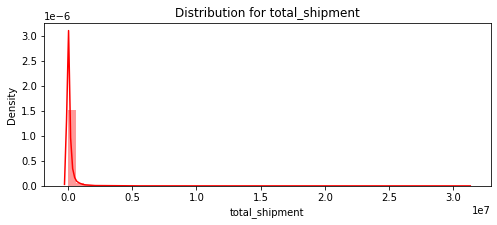

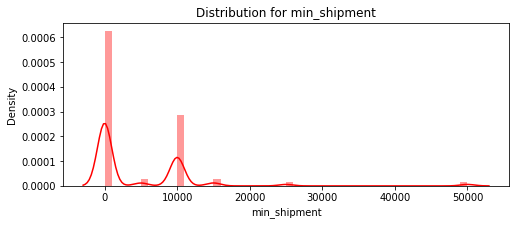

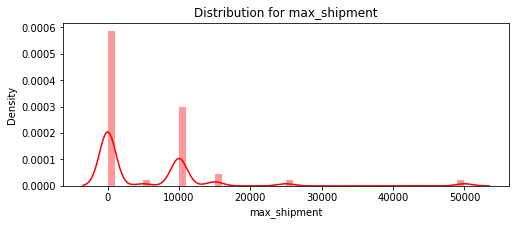

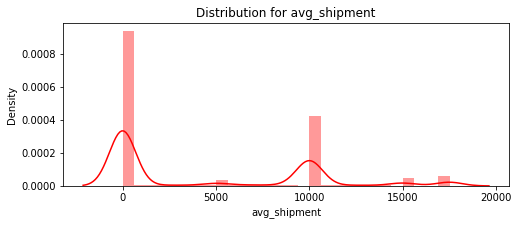

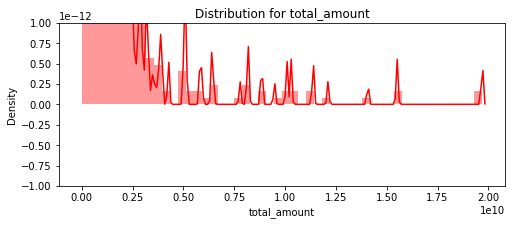

...

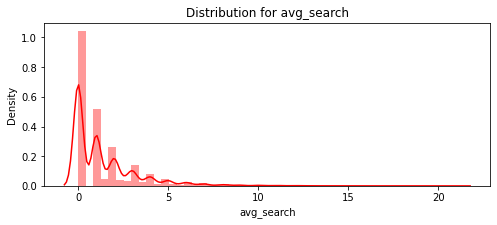

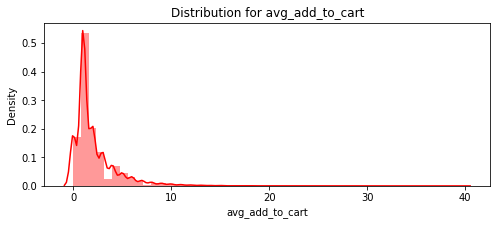

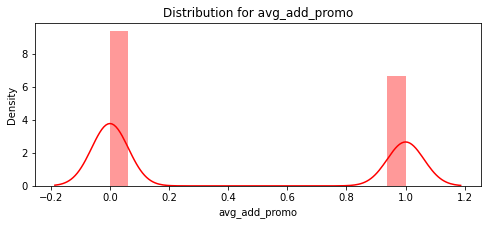

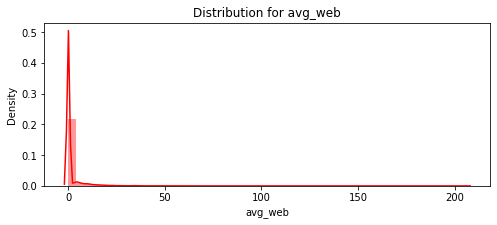

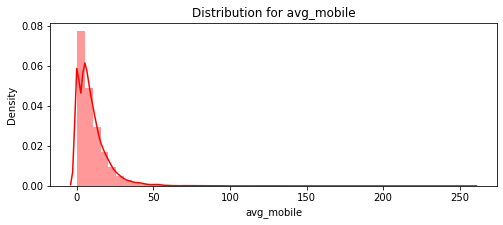

In [ ]:
# Check distribution

num_cols = df_final_2month.columns.to_list()
num_cols.remove('customer_id')
num_cols.remove('churn')
num_cols.remove('yearmonth_x')
num_cols.remove('yearmonth_y')
num_cols.remove('first_transaction')
num_cols.remove('last_transaction')
for feat in num_cols: distplot(feat, df_final_2month)

In [ ]:
# Data normalize

scaler= StandardScaler()

X_train[num_cols] = scaler.fit_transform(X_train[num_cols])
X_test[num_cols] = scaler.transform(X_test[num_cols])

Modelling

In [ ]:
# Make a dataset for split data

df_split = df_final_2month.copy()
df_split.drop(['yearmonth_x', 'customer_id', 'first_transaction', 'last_transaction', 'yearmonth_y'], axis = 1, inplace = True)

In [ ]:
#split data into traning and testing

#y = target variabel
#x = variable predictor

#separate data from target variabel
y = df_split.pop('churn')
X = df_split

#split data
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size= 0.8, random_state=50)

In [ ]:
# Baseline Model

#decision Tree model
dt_model = DecisionTreeClassifier()
clf = dt_model.fit(X_train,y_train)
predictdt_y = dt_model.predict(X_test)
accuracy_dt = dt_model.score(X_test,y_test)
print("Decision Tree accuracy is :",accuracy_dt)

Decision Tree accuracy is : 0.8436003830194702


In [ ]:
# Baseline Model
# Handling Outlier

#decision Tree model
dt_model = DecisionTreeClassifier()
clf = dt_model.fit(X_train,y_train)
predictdt_y = dt_model.predict(X_test)
accuracy_dt = dt_model.score(X_test,y_test)
print("Decision Tree accuracy is :",accuracy_dt)

Decision Tree accuracy is : 0.8384934567507182


In [ ]:
# Baseline Model
# After Normalization

#decision Tree model
dt_model = DecisionTreeClassifier()
clf = dt_model.fit(X_train,y_train)
predictdt_y = dt_model.predict(X_test)
accuracy_dt = dt_model.score(X_test,y_test)
print("Decision Tree accuracy is :",accuracy_dt)

Decision Tree accuracy is : 0.8378550909671242


In [ ]:
#decision Tree model
dt_model = DecisionTreeClassifier()
dt_model.fit(X_test,y_test)
predictdt_y_test = dt_model.predict(X_test)

In [ ]:
accuracy_dt_test = dt_model.score(X_test, y_test)

In [ ]:
accuracy_dt_test

1.0

In [ ]:
# Decision Tree

# Hyperparameter Optimization
parameters = {'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10, 50], 
              'min_samples_split': [2, 3, 50, 100],
              'min_samples_leaf': [1, 5, 8, 10]
             }

# Run the grid search
grid_obj = GridSearchCV(clf, parameters)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
clf = grid_obj.best_estimator_

# Train the model using the training sets 
clf.fit(X_train, y_train)

# Prediction on test set
y_pred = clf.predict(X_test)

# Calculating the accuracy
acc_dt = round( metrics.accuracy_score(y_test, y_pred) * 100, 2 )
print( 'Accuracy of Decision Tree model : ', acc_dt )

Accuracy of Decision Tree model :  86.07


In [ ]:
# Decision Tree
# Handling Outlier

# Hyperparameter Optimization
parameters = {'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10, 50], 
              'min_samples_split': [2, 3, 50, 100],
              'min_samples_leaf': [1, 5, 8, 10]
             }

# Run the grid search
grid_obj = GridSearchCV(clf, parameters)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
clf = grid_obj.best_estimator_

# Train the model using the training sets 
clf.fit(X_train, y_train)

# Prediction on test set
y_pred = clf.predict(X_test)

# Calculating the accuracy
acc_dt = round( metrics.accuracy_score(y_test, y_pred) * 100, 2 )
print( 'Accuracy of Decision Tree model : ', acc_dt )

Accuracy of Decision Tree model :  86.07


In [ ]:
# Decision Tree
# After Normalization

# Hyperparameter Optimization
parameters = {'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10, 50], 
              'min_samples_split': [2, 3, 50, 100],
              'min_samples_leaf': [1, 5, 8, 10]
             }

# Run the grid search
grid_obj = GridSearchCV(clf, parameters)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
clf = grid_obj.best_estimator_

# Train the model using the training sets 
clf.fit(X_train, y_train)

# Prediction on test set
y_pred = clf.predict(X_test)

# Calculating the accuracy
acc_dt = round( metrics.accuracy_score(y_test, y_pred) * 100, 2 )
print( 'Accuracy of Decision Tree model : ', acc_dt )

Accuracy of Decision Tree model :  86.08


In [ ]:
print('Best algorithm:', grid_obj.best_estimator_.get_params())

Best algorithm: {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 5, 'max_features': 'auto', 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 5, 'min_samples_split': 100, 'min_weight_fraction_leaf': 0.0, 'random_state': None, 'splitter': 'best'}


In [ ]:
pd.DataFrame.from_dict(parameter, orient='index')

,0
ccp_alpha,0.0
class_weight,None
criterion,entropy
max_depth,5
max_features,sqrt
max_leaf_nodes,None
min_impurity_decrease,0.0
min_samples_leaf,1
min_samples_split,2
min_weight_fraction_leaf,0.0


In [ ]:
print(classification_report(y_test, predictdt_y))

              precision    recall  f1-score   support

           0       0.88      0.91      0.89      4561
           1       0.73      0.67      0.70      1705

    accuracy                           0.84      6266
   macro avg       0.81      0.79      0.80      6266
weighted avg       0.84      0.84      0.84      6266



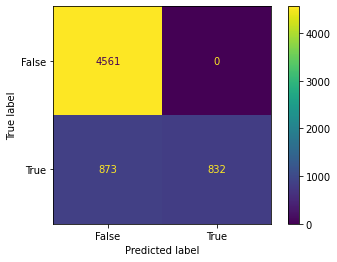

In [ ]:
actual = y_test
predicted = y_pred

confusion_matrix = metrics.confusion_matrix(actual, predicted)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

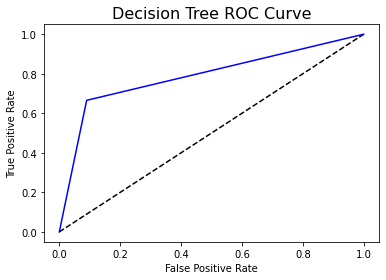

In [ ]:
#ROC
y_dtpred_prob = dt_model.predict_proba(X_test)[:,1]
fpr_dt, tpr_dt, thresholds = roc_curve(y_test, y_dtpred_prob)
plt.plot([0, 1], [0, 1], 'k--' )
plt.plot(fpr_dt, tpr_dt, label='Decision Tree',color = "b")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC Curve',fontsize=16)
plt.show();

In [ ]:
# AUC score

auc = metrics.roc_auc_score(y_test,predictdt_y)
print(auc)

0.7878982910703458
